## <p style="background-color:#fea162; font-family:newtimeroman; color:#FFF9ED; font-size:175%; text-align:center; border-radius:10px 10px;">DATA SCIENCE BorrowRisk PROJECT</p>

<a id="toc"></a>

## <p style="background-color:#fea162; font-family:newtimeroman; color:#FFF9ED; font-size:175%; text-align:center; border-radius:10px 10px;">Table of Contents</p>

- <a href="#0">Introduction</a><br>
- <a href="#1">Downloading And Importing Modules, Loading Data & Data Review</a><br>
- <a href="#2">Preprocessing</a><br>
    - <a href="#2.1">Cleaning Data</a><br>
    - <a href="#2.2">Handling Missing Values</a><br>
    - <a href="#2.3">Outlier Analysis</a><br>
    - <a href="#2.4">Strategies For Imbalanced Data</a><br>
        - <a href="#2.4.1">SMOTE</a><br>
        - <a href="#2.4.2">ADASYN</a><br>
        - <a href="#2.4.3">Under Sampling</a><br>
- <a href="#3">Exploratory Data Analysis (EDA)</a><br>
- <a href="#4">Scaling, Categorical Variables, Splitting</a><br>
- <a href="#5">Models</a><br>
    - <a href="#5.1">KNN Classifier</a><br>
    - <a href="#5.2">Logistic Regression</a><br>
    - <a href="#5.3">Neural Networks</a><br>
    - <a href="#5.4">Decision Tree</a><br>
    - <a href="#5.5">Random Forest</a><br>
    - <a href="#5.6">XGBoost</a><br>
    - <a href="#5.7">LightGBM</a><br>
    - <a href="#5.8">CatBoost</a><br>
- <a href="#6">Conclusion</a>


<a id="0"></a>
<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true"
style="color:blue; background-color:#dfa8e4" data-toggle="popover">Content</a>

## Introduction

### 1.1 Information About the Project
This project is about creating a model that predicts if someone will default on their loan. It helps financial institutions lower risks and avoid losing money.

- **Objective:**  
  The goal is to build a model that can classify whether a borrower will repay the loan or not. This is important for making better lending decisions.  

- **Scope:**  
  The project will include data preparation, testing different machine learning models with different imbalance data strategy, and evaluating their accuracy. It won’t focus on deploying the model but will create a ready-to-use prototype.

### 1.2 Description of the Dataset
The dataset contains loan-related data about borrowers.

- **Source:** From Kaggle's Loan Default Dataset. [Loan Default Dataset](https://www.kaggle.com/datasets/yasserh/loan-default-dataset/data)

- **Size:** Before preprocessing : 148,671 rows and 34 columns.
             After preprocessing : 148,671 rows and 10 columns
- **Type:** Tabular data (a mix of numerical and categorical information).  

### 1.3 Description of the Columns
Here are the main columns in the dataset:

- **Target Variable:**  
  - `Loan Default`: A binary value (1 if the borrower defaulted, 0 if they didn’t).  

- **Feature Variables:**  


| **Column Name**           | **Description**                                                                                                     |
|----------------------------|---------------------------------------------------------------------------------------------------------------------|
| `ID`                      | Unique identifier for each loan record.                                                                             |
| `year`                    | Year of loan issuance.                                                                                              |
| `loan_limit`              | Loan limit category.                                                                                                |
| `Gender`                  | Loan applicant gender.                                                                                              |
| `approv_in_adv`           | Indicates whether the loan has been pre-approved.                                                                   |
| `loan_type`               | Type of loan.                                                                                                       |
| `loan_purpose`            | Purpose of the loan.                                                                                                |
| `Credit_Worthiness`       | Credit reliability based on past repayment behavior.                                                                |
| `open_credit`             | Indicates whether the applicant has other open credits.                                                             |
| `business_or_commercial`  | Whether the loan is for business or commercial purposes.                                                             |
| **`loan_amount`**         | **Total loan amount.**                                                                                              |
| `rate_of_interest`        | Loan interest rate.                                                                                                 |
| `Interest_rate_spread`    | Interest rate differential relative to a benchmark index.                                                            |
| **`Upfront_charges`**     | **Initial charges for the loan.**                                                                                   |
| **`term`**                | **Loan duration in months.**                                                                                        |
| `Neg_ammortization`       | Indicates whether there is negative amortization.                                                                   |
| `interest_only`           | Whether the loan allows for interest-only payments.                                                                 |
| `lump_sum_payment`        | Indicates whether there is an option to pay in a single installment.                                                |
| **`property_value`**      | **Value of the property associated with the loan.**                                                                 |
| `construction_type`       | Type of construction of the property.                                                                               |
| `occupancy_type`          | Type of property occupancy.                                                                                         |
| `Secured_by`              | Type of loan guarantee.                                                                                             |
| `total_units`             | Number of units related to the loan.                                                                                |
| **`income`**              | **Loan applicant's income.**                                                                                        |
| `credit_type`             | Type of credit check used.                                                                                          |
| **`Credit_Score`**        | **Applicant's credit score.**                                                                                       |
| `co-applicant_credit_type`| Type of credit check for co-applicants.                                                                              |
| **`age`**                 | **Age range of the applicant.**                                                                                     |
| `submission_of_application`| Loan application submission method.                                                                                 |
| **`LTV` (Loan to Value)** | **Ratio of loan amount to property value.**                                                                          |
| `Region`                  | Geographic region of the loan.                                                                                      |
| `Security_Type`           | Type of loan security.                                                                                              |                                                           |
| **`dtir1` (Debt to Income Ratio)** | **Debt/income ratio of the applicant.**                                                                     |
 



<a id="1"></a>
## Downloading And Importing Modules, Loading Data & Data Review

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#dfa8e4" data-toggle="popover">Content</a>

In [1]:
if True:
    !pip install pandas==2.2.3
    !pip install numpy==1.26.4
    !pip install matplotlib==3.8.4
    !pip install seaborn==0.13.2
    !pip install missingno==0.5.2
    !pip install scikit-learn==1.5.2
    !pip install xgboost==2.1.2
    !pip install lightgbm==4.5.0
    !pip install catboost==1.2.7
    !pip install imbalanced-learn==0.12.4

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
import missingno as msno
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler,LabelEncoder
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, ConfusionMatrixDisplay, classification_report,roc_auc_score
from sklearn.metrics import make_scorer
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
from sklearn.utils import check_random_state
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
import lightgbm as lgb
from catboost import CatBoostClassifier
from imblearn.over_sampling import SMOTE,ADASYN
from imblearn.under_sampling import RandomUnderSampler
import pickle
import os
import random


In [3]:
df_main = pd.read_csv('Loan_Default.csv')
df = df_main.copy()
pd.set_option("display.max_columns", df.shape[-1]) 


In [4]:
df.sample(10)

,ID,year,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,loan_amount,rate_of_interest,Interest_rate_spread,Upfront_charges,term,Neg_ammortization,interest_only,lump_sum_payment,property_value,construction_type,occupancy_type,Secured_by,total_units,income,credit_type,Credit_Score,co-applicant_credit_type,age,submission_of_application,LTV,Region,Security_Type,Status,dtir1
1401,26291,2019,cf,Male,nopre,type1,p3,l1,nopc,nob/c,336500,NaN,NaN,NaN,360.0,not_neg,not_int,not_lpsm,NaN,sb,pr,home,1U,3780.0,EQUI,797,EXP,55-64,not_inst,NaN,North,direct,1,NaN
51604,76494,2019,cf,Joint,nopre,type1,p4,l1,nopc,nob/c,136500,3.875,0.2364,921.08,360.0,not_neg,not_int,not_lpsm,388000.0,sb,pr,home,1U,6060.0,EXP,888,EXP,65-74,not_inst,35.180412,North,direct,0,36.0
58340,83230,2019,cf,Sex Not Available,nopre,type1,p3,l1,nopc,nob/c,236500,4.125,0.6091,6794.00,360.0,not_neg,not_int,not_lpsm,488000.0,sb,ir,home,1U,4740.0,CIB,626,EXP,65-74,to_inst,48.463115,south,direct,0,40.0
66132,91022,2019,cf,Female,nopre,type1,p4,l1,nopc,nob/c,236500,NaN,NaN,NaN,360.0,not_neg,not_int,not_lpsm,NaN,sb,ir,home,2U,16560.0,EQUI,617,EXP,55-64,not_inst,NaN,North,direct,1,NaN
72211,97101,2019,cf,Female,nopre,type2,p3,l1,nopc,b/c,66500,4.375,1.2355,2148.32,360.0,neg_amm,not_int,not_lpsm,218000.0,sb,pr,home,1U,1920.0,CRIF,596,EXP,65-74,to_inst,30.504587,North,direct,0,31.0
122635,147525,2019,cf,Sex Not Available,nopre,type1,p3,l1,nopc,nob/c,406500,3.990,0.3090,6845.56,360.0,not_neg,int_only,not_lpsm,738000.0,sb,pr,home,1U,4080.0,EXP,670,CIB,55-64,to_inst,55.081301,south,direct,0,42.0
32339,57229,2019,cf,Male,nopre,type1,p3,l1,nopc,nob/c,506500,3.625,0.0640,1574.00,360.0,not_neg,not_int,not_lpsm,1198000.0,sb,pr,home,1U,9180.0,CIB,684,CIB,45-54,not_inst,42.278798,North,direct,0,30.0
9137,34027,2019,cf,Joint,pre,type1,p1,l1,nopc,nob/c,446500,3.750,-0.1099,13470.00,360.0,not_neg,not_int,not_lpsm,578000.0,sb,pr,home,1U,7920.0,CRIF,872,EXP,45-54,to_inst,77.249135,North,direct,0,30.0
74915,99805,2019,cf,Male,nopre,type1,p4,l1,nopc,nob/c,406500,4.375,0.8327,3275.50,348.0,not_neg,not_int,not_lpsm,548000.0,sb,pr,home,1U,5160.0,CRIF,817,CIB,45-54,to_inst,74.178832,North,direct,0,46.0
72193,97083,2019,cf,Male,pre,type2,p3,l1,nopc,b/c,316500,3.625,1.4767,760.90,240.0,not_neg,not_int,not_lpsm,368000.0,sb,pr,home,1U,7020.0,CRIF,740,CIB,35-44,to_inst,86.005435,North,direct,0,56.0


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 148670 entries, 0 to 148669
Data columns (total 34 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   ID                         148670 non-null  int64  
 1   year                       148670 non-null  int64  
 2   loan_limit                 145326 non-null  object 
 3   Gender                     148670 non-null  object 
 4   approv_in_adv              147762 non-null  object 
 5   loan_type                  148670 non-null  object 
 6   loan_purpose               148536 non-null  object 
 7   Credit_Worthiness          148670 non-null  object 
 8   open_credit                148670 non-null  object 
 9   business_or_commercial     148670 non-null  object 
 10  loan_amount                148670 non-null  int64  
 11  rate_of_interest           112231 non-null  float64
 12  Interest_rate_spread       112031 non-null  float64
 13  Upfront_charges            10

In [6]:
df.shape

(148670, 34)

In [7]:
df.describe(include='all')

,ID,year,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,loan_amount,rate_of_interest,Interest_rate_spread,Upfront_charges,term,Neg_ammortization,interest_only,lump_sum_payment,property_value,construction_type,occupancy_type,Secured_by,total_units,income,credit_type,Credit_Score,co-applicant_credit_type,age,submission_of_application,LTV,Region,Security_Type,Status,dtir1
count,148670.000000,148670.0,145326,148670,147762,148670,148536,148670,148670,148670,1.486700e+05,112231.000000,112031.000000,109028.000000,148629.000000,148549,148670,148670,1.335720e+05,148670,148670,148670,148670,139520.000000,148670,148670.000000,148670,148470,148470,133572.000000,148670,148670,148670.000000,124549.000000
unique,NaN,NaN,2,4,2,3,4,2,2,2,NaN,NaN,NaN,NaN,NaN,2,2,2,NaN,2,3,2,4,NaN,4,NaN,2,7,2,NaN,4,2,NaN,NaN
top,NaN,NaN,cf,Male,nopre,type1,p3,l1,nopc,nob/c,NaN,NaN,NaN,NaN,NaN,not_neg,not_int,not_lpsm,NaN,sb,pr,home,1U,NaN,CIB,NaN,CIB,45-54,to_inst,NaN,North,direct,NaN,NaN
freq,NaN,NaN,135348,42346,124621,113173,55934,142344,148114,127908,NaN,NaN,NaN,NaN,NaN,133420,141560,145286,NaN,148637,138201,148637,146480,NaN,48152,NaN,74392,34720,95814,NaN,74722,148637,NaN,NaN
mean,99224.500000,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.311177e+05,4.045476,0.441656,3224.996127,335.136582,NaN,NaN,NaN,4.978935e+05,NaN,NaN,NaN,NaN,6957.338876,NaN,699.789103,NaN,NaN,NaN,72.746457,NaN,NaN,0.246445,37.732932
std,42917.476598,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.839093e+05,0.561391,0.513043,3251.121510,58.409084,NaN,NaN,NaN,3.599353e+05,NaN,NaN,NaN,NaN,6496.586382,NaN,115.875857,NaN,NaN,NaN,39.967603,NaN,NaN,0.430942,10.545435
min,24890.000000,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.650000e+04,0.000000,-3.638000,0.000000,96.000000,NaN,NaN,NaN,8.000000e+03,NaN,NaN,NaN,NaN,0.000000,NaN,500.000000,NaN,NaN,NaN,0.967478,NaN,NaN,0.000000,5.000000
25%,62057.250000,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.965000e+05,3.625000,0.076000,581.490000,360.000000,NaN,NaN,NaN,2.680000e+05,NaN,NaN,NaN,NaN,3720.000000,NaN,599.000000,NaN,NaN,NaN,60.474860,NaN,NaN,0.000000,31.000000
50%,99224.500000,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.965000e+05,3.990000,0.390400,2596.450000,360.000000,NaN,NaN,NaN,4.180000e+05,NaN,NaN,NaN,NaN,5760.000000,NaN,699.000000,NaN,NaN,NaN,75.135870,NaN,NaN,0.000000,39.000000
75%,136391.750000,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.365000e+05,4.375000,0.775400,4812.500000,360.000000,NaN,NaN,NaN,6.280000e+05,NaN,NaN,NaN,NaN,8520.000000,NaN,800.000000,NaN,NaN,NaN,86.184211,NaN,NaN,0.000000,45.000000


In [8]:
df.isnull().sum()

ID                               0
year                             0
loan_limit                    3344
Gender                           0
approv_in_adv                  908
loan_type                        0
loan_purpose                   134
Credit_Worthiness                0
open_credit                      0
business_or_commercial           0
loan_amount                      0
rate_of_interest             36439
Interest_rate_spread         36639
Upfront_charges              39642
term                            41
Neg_ammortization              121
interest_only                    0
lump_sum_payment                 0
property_value               15098
construction_type                0
occupancy_type                   0
Secured_by                       0
total_units                      0
income                        9150
credit_type                      0
Credit_Score                     0
co-applicant_credit_type         0
age                            200
submission_of_applic

<a id="2"></a>
## <p style="background-color:#fea162; font-family:newtimeroman; color:#FFF9ED; font-size:175%; text-align:center; border-radius:10px 10px;">Preprocessing</p>



<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#dfa8e4" data-toggle="popover">Content</a>
<a id="2.1"></a>
## 2.1 Data Cleaning
Cleaning the dataset is a critical step before analysis. Each column was carefully checked for common issues, such as:

- **Duplicates:** No duplicate records were found; all entries were unique.
- **Inconsistent Formats:** The data was already consistent in formatting (e.g., date formats, string casing).
- **Incorrect Data:** No obvious errors were detected, such as negative ages or future dates.

Since the dataset was clean, no additional cleaning steps were required.

### Credit Factors
According to [Forbes.com](https://www.forbes.com/advisor/personal-loans/personal-loan-requirements/), these credit factors are significant when evaluating loans:

- **Credit Score and History:** Reflects the borrower's reliability in repaying debt.
- **Income:** Determines the borrower's ability to repay the loan.
- **Debt-to-income Ratio:** The ratio of debt payments to income.
- **Collateral:** Assets offered as security for the loan.
- **Origination Fee:** A fee charged by the lender for processing the loan application.


In [9]:
willremove = []

### Data Cleaning: Column `ID`

In [10]:
df["ID"].sample(10)

3729       28619
14597      39487
46465      71355
121343    146233
143999    168889
29370      54260
136089    160979
26188      51078
50076      74966
5769       30659
Name: ID, dtype: int64

In [11]:
df["ID"].nunique(),df.shape[0]

(148670, 148670)

In [12]:
willremove.append("ID")

### Data Cleaning: Column `year`

In [13]:
df["year"].sample(10)

130455    2019
41839     2019
86736     2019
100150    2019
44585     2019
66556     2019
140154    2019
30456     2019
25502     2019
56225     2019
Name: year, dtype: int64

In [14]:
df["year"].describe()

count    148670.0
mean       2019.0
std           0.0
min        2019.0
25%        2019.0
50%        2019.0
75%        2019.0
max        2019.0
Name: year, dtype: float64

In [15]:
willremove.append("year")

### Data Cleaning: Column `loan_limit`

In [16]:
df["loan_limit"].sample(10) 

148466    cf
121682    cf
115045    cf
52196     cf
72885     cf
147445    cf
85213     cf
123336    cf
35305     cf
63437     cf
Name: loan_limit, dtype: object

In [17]:
df["loan_limit"].value_counts(dropna=False)

loan_limit
cf     135348
ncf      9978
NaN      3344
Name: count, dtype: int64

In [18]:
willremove.append("loan_limit")

### Data Cleaning: Column `Gender`

In [19]:
df["Gender"].sample(10)

16615                  Male
96841                 Joint
36533                 Joint
127619                 Male
84569                  Male
147326    Sex Not Available
32296                 Joint
93641                 Joint
56664                 Joint
37587                Female
Name: Gender, dtype: object

In [20]:
df["Gender"].value_counts(dropna=False) , df["Gender"].isnull().sum()

(Gender
 Male                 42346
 Joint                41399
 Sex Not Available    37659
 Female               27266
 Name: count, dtype: int64,
 0)

In [21]:
df[df["Gender"]=="Sex Not Available"].sample(3)

,ID,year,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,loan_amount,rate_of_interest,Interest_rate_spread,Upfront_charges,term,Neg_ammortization,interest_only,lump_sum_payment,property_value,construction_type,occupancy_type,Secured_by,total_units,income,credit_type,Credit_Score,co-applicant_credit_type,age,submission_of_application,LTV,Region,Security_Type,Status,dtir1
35917,60807,2019,ncf,Sex Not Available,nopre,type1,p3,l1,nopc,nob/c,506500,NaN,NaN,NaN,360.0,not_neg,not_int,not_lpsm,648000.0,sb,pr,home,1U,420.0,EXP,628,EXP,55-64,to_inst,78.163580,south,direct,1,44.0
131320,156210,2019,cf,Sex Not Available,nopre,type1,p3,l1,nopc,nob/c,276500,4.125,0.2054,2417.22,360.0,not_neg,not_int,not_lpsm,378000.0,sb,pr,home,1U,3720.0,CRIF,838,EXP,45-54,to_inst,73.148148,south,direct,0,44.0
83968,108858,2019,cf,Sex Not Available,nopre,type1,p1,l1,nopc,nob/c,306500,NaN,NaN,NaN,360.0,not_neg,not_int,not_lpsm,448000.0,sb,pr,home,1U,4620.0,CIB,640,EXP,>74,to_inst,68.415179,south,direct,1,16.0


In [22]:
df.loc[df["Gender"] == "Sex Not Available", "Gender"] = np.nan

In [23]:
df["Gender"].value_counts(dropna=False), df["Gender"].isnull().sum()

(Gender
 Male      42346
 Joint     41399
 NaN       37659
 Female    27266
 Name: count, dtype: int64,
 37659)

In [24]:
willremove.append("Gender")

### Data Cleaning: Column `approv_in_adv`

In [25]:
df["approv_in_adv"].sample(10)

1122      nopre
111427      pre
101351    nopre
144496      pre
77070     nopre
94868       pre
65713     nopre
27461     nopre
84835     nopre
44861       pre
Name: approv_in_adv, dtype: object

In [26]:
df["approv_in_adv"].value_counts(dropna=False)

approv_in_adv
nopre    124621
pre       23141
NaN         908
Name: count, dtype: int64

In [27]:
willremove.append("approv_in_adv")

### Data Cleaning: Column `loan_type`

In [28]:
df["loan_type"].sample(10)

119159    type1
44243     type1
143543    type1
127528    type2
98138     type1
90128     type1
17568     type1
95402     type3
92514     type1
36645     type1
Name: loan_type, dtype: object

In [29]:
df["loan_type"].value_counts(dropna=False)

loan_type
type1    113173
type2     20762
type3     14735
Name: count, dtype: int64

In [30]:
willremove.append("loan_type")

### Data Cleaning: Column `loan_purpose`

In [31]:
df["loan_purpose"].sample(10)

145626    p3
52974     p4
111501    p1
53176     p1
133267    p3
98387     p3
109082    p1
54148     p3
80648     p4
115857    p4
Name: loan_purpose, dtype: object

In [32]:
df["loan_purpose"].value_counts(dropna=False)

loan_purpose
p3     55934
p4     54799
p1     34529
p2      3274
NaN      134
Name: count, dtype: int64

In [33]:
willremove.append("loan_purpose")

### Data Cleaning: Column `Credit_Worthiness`

In [34]:
df["Credit_Worthiness"].sample(10)

147311    l1
135326    l1
27279     l1
53425     l1
22190     l1
107423    l1
28244     l1
127285    l1
56481     l2
40659     l1
Name: Credit_Worthiness, dtype: object

In [35]:
df["Credit_Worthiness"].value_counts(dropna=False)

Credit_Worthiness
l1    142344
l2      6326
Name: count, dtype: int64

In [36]:
willremove.append("Credit_Worthiness")

### Data Cleaning: Column `open_credit`

In [37]:
df["open_credit"].sample(10)

33163     nopc
61397     nopc
90513     nopc
143180    nopc
50783     nopc
70902     nopc
86435     nopc
103515    nopc
55350     nopc
78677     nopc
Name: open_credit, dtype: object

In [38]:
df["open_credit"].value_counts(dropna=False)

open_credit
nopc    148114
opc        556
Name: count, dtype: int64

In [39]:
willremove.append("open_credit")

### Data Cleaning: Column `business_or_commercial`

In [40]:
df["business_or_commercial"].sample(10)

44611       b/c
71374       b/c
115034    nob/c
36042     nob/c
43258       b/c
23227     nob/c
33824       b/c
141428    nob/c
145120    nob/c
24898       b/c
Name: business_or_commercial, dtype: object

In [41]:
df["business_or_commercial"].value_counts(dropna=False)

business_or_commercial
nob/c    127908
b/c       20762
Name: count, dtype: int64

In [42]:
willremove.append("business_or_commercial")

### Data Cleaning: Column `loan_amount`

In [43]:
df["loan_amount"].sample(10)

92888     486500
122680    116500
29447     316500
61937     196500
40500     326500
68439     236500
147356    406500
61385     216500
61628     286500
79934     156500
Name: loan_amount, dtype: int64

In [44]:
df["loan_amount"].describe(),df["loan_amount"].isnull().sum()

(count    1.486700e+05
 mean     3.311177e+05
 std      1.839093e+05
 min      1.650000e+04
 25%      1.965000e+05
 50%      2.965000e+05
 75%      4.365000e+05
 max      3.576500e+06
 Name: loan_amount, dtype: float64,
 0)

### Data Cleaning: Column `rate_of_interest`

In [45]:
df["rate_of_interest"].sample(10)

111909      NaN
3147        NaN
94547     4.990
35043     3.750
6007      3.990
112572    4.375
95957     3.875
128347    3.375
81243     4.750
74677     3.250
Name: rate_of_interest, dtype: float64

In [46]:
df["rate_of_interest"].describe(),df["rate_of_interest"].isnull().sum()

(count    112231.000000
 mean          4.045476
 std           0.561391
 min           0.000000
 25%           3.625000
 50%           3.990000
 75%           4.375000
 max           8.000000
 Name: rate_of_interest, dtype: float64,
 36439)

In [47]:
willremove.append("rate_of_interest")

### Data Cleaning: Column `Interest_rate_spread`

In [48]:
df["Interest_rate_spread"].sample(10)

12222    -0.6537
125101   -0.1253
131103    1.0582
49317     1.4661
21670     0.2864
16777        NaN
11890     0.6036
119133    0.2273
147763    0.2607
135806       NaN
Name: Interest_rate_spread, dtype: float64

In [49]:
df["Interest_rate_spread"].describe(),df["Interest_rate_spread"].isnull().sum()

(count    112031.000000
 mean          0.441656
 std           0.513043
 min          -3.638000
 25%           0.076000
 50%           0.390400
 75%           0.775400
 max           3.357000
 Name: Interest_rate_spread, dtype: float64,
 36639)

In [50]:
willremove.append("Interest_rate_spread")

### Data Cleaning: Column `Upfront_charges`

In [51]:
df["Upfront_charges"].sample(10)

6410      3824.26
106880       0.00
31867     2125.00
39367        0.00
48116     5230.00
106990    1428.93
87619     4940.00
128112    2404.54
43631        0.00
137282        NaN
Name: Upfront_charges, dtype: float64

In [52]:
df["Upfront_charges"].describe(),df["Upfront_charges"].isnull().sum()

(count    109028.000000
 mean       3224.996127
 std        3251.121510
 min           0.000000
 25%         581.490000
 50%        2596.450000
 75%        4812.500000
 max       60000.000000
 Name: Upfront_charges, dtype: float64,
 39642)

### Data Cleaning: Column `term`

In [53]:
df["term"].sample(10)

140816    360.0
135045    360.0
35378     180.0
138481    360.0
108734    360.0
84481     360.0
145418    360.0
123518    360.0
45367     360.0
75304     240.0
Name: term, dtype: float64

In [54]:
df["term"].describe(),df["term"].isnull().sum()

(count    148629.000000
 mean        335.136582
 std          58.409084
 min          96.000000
 25%         360.000000
 50%         360.000000
 75%         360.000000
 max         360.000000
 Name: term, dtype: float64,
 41)

In [55]:
df["term"].value_counts(dropna=False)

term
360.0    121685
180.0     12981
240.0      5859
300.0      2822
324.0      2766
120.0       510
144.0       263
348.0       260
336.0       213
96.0        194
312.0       185
156.0       174
216.0       115
276.0       100
132.0        93
288.0        90
168.0        82
228.0        74
204.0        59
264.0        43
NaN          41
108.0        33
192.0        17
252.0         8
165.0         1
280.0         1
322.0         1
Name: count, dtype: int64

### Data Cleaning: Column `Neg_ammortization`

In [56]:
df["Neg_ammortization"].sample(10)

106959    not_neg
18906     not_neg
7477      not_neg
122286    not_neg
45261     not_neg
28595     neg_amm
111516    not_neg
103829    not_neg
2871      neg_amm
122259    not_neg
Name: Neg_ammortization, dtype: object

In [57]:
df["Neg_ammortization"].value_counts(dropna=False)

Neg_ammortization
not_neg    133420
neg_amm     15129
NaN           121
Name: count, dtype: int64

In [58]:
willremove.append("Neg_ammortization")

### Data Cleaning: Column `interest_only`

In [59]:
df["interest_only"].sample(10)

40845     not_int
115594    not_int
8564      not_int
26329     not_int
79418     not_int
98186     not_int
117704    not_int
10424     not_int
65680     not_int
90883     not_int
Name: interest_only, dtype: object

In [60]:
df["interest_only"].value_counts(dropna=False)

interest_only
not_int     141560
int_only      7110
Name: count, dtype: int64

In [61]:
willremove.append("interest_only")

### Data Cleaning: Column `lump_sum_payment`

In [62]:
df["lump_sum_payment"].sample(10)

79157     not_lpsm
94852     not_lpsm
1961      not_lpsm
1143      not_lpsm
132598    not_lpsm
46814     not_lpsm
21011     not_lpsm
50990     not_lpsm
15510     not_lpsm
143767    not_lpsm
Name: lump_sum_payment, dtype: object

In [63]:
df["lump_sum_payment"].value_counts(dropna=False)

lump_sum_payment
not_lpsm    145286
lpsm          3384
Name: count, dtype: int64

In [64]:
willremove.append("lump_sum_payment")

### Data Cleaning: Column `property_value`

In [65]:
df["property_value"].sample(10)

117615     878000.0
105648     568000.0
46085      768000.0
28398           NaN
117218     258000.0
5267       558000.0
78609      418000.0
79296     1108000.0
62522      688000.0
135112     178000.0
Name: property_value, dtype: float64

In [66]:
df["property_value"].describe(),df["property_value"].isnull().sum()

(count    1.335720e+05
 mean     4.978935e+05
 std      3.599353e+05
 min      8.000000e+03
 25%      2.680000e+05
 50%      4.180000e+05
 75%      6.280000e+05
 max      1.650800e+07
 Name: property_value, dtype: float64,
 15098)

### Data Cleaning: Column `construction_type`

In [67]:
df["construction_type"].sample(10)

35772     sb
26936     sb
90683     sb
115120    sb
72345     sb
89773     sb
82873     sb
119008    sb
148639    sb
4522      sb
Name: construction_type, dtype: object

In [68]:
df["construction_type"].value_counts(dropna=False)

construction_type
sb    148637
mh        33
Name: count, dtype: int64

In [69]:
willremove.append("construction_type")

### Data Cleaning: Column `occupancy_type`

In [70]:
df["occupancy_type"].sample(10)

29405     pr
51567     pr
68133     pr
141538    pr
91739     pr
113232    pr
116310    pr
64725     pr
91407     pr
13500     pr
Name: occupancy_type, dtype: object

In [71]:
df["occupancy_type"].value_counts(dropna=False)

occupancy_type
pr    138201
ir      7340
sr      3129
Name: count, dtype: int64

In [72]:
willremove.append("occupancy_type")

### Data Cleaning: Column `Secured_by`

In [73]:
df["Secured_by"].sample(10)

19033     home
69958     home
40349     home
129211    home
123325    home
30924     home
37412     home
36662     home
144656    home
142904    home
Name: Secured_by, dtype: object

In [74]:
df["Secured_by"].value_counts(dropna=False)

Secured_by
home    148637
land        33
Name: count, dtype: int64

In [75]:
willremove.append("Secured_by")

### Data Cleaning: Column `total_units`

In [76]:
df["total_units"].sample(10)    

75304     1U
119646    1U
71036     1U
141056    1U
6513      1U
58416     1U
73753     1U
129887    1U
120824    1U
105184    1U
Name: total_units, dtype: object

In [77]:
df["total_units"].value_counts(dropna=False)

total_units
1U    146480
2U      1477
3U       393
4U       320
Name: count, dtype: int64

In [78]:
willremove.append("total_units")

### Data Cleaning: Column `income`

In [79]:
df["income"].sample(10)

27087     15000.0
92964      6840.0
113131     6900.0
58854         NaN
58301      2040.0
79453      3480.0
68472      4140.0
20415      8760.0
34548      8760.0
73417      2460.0
Name: income, dtype: float64

In [80]:
df["income"].describe(),df["income"].isnull().sum()

(count    139520.000000
 mean       6957.338876
 std        6496.586382
 min           0.000000
 25%        3720.000000
 50%        5760.000000
 75%        8520.000000
 max      578580.000000
 Name: income, dtype: float64,
 9150)

### Data Cleaning: Column `credit_type`

In [81]:
df["credit_type"].sample(10)

7487      CRIF
106557    CRIF
42982     CRIF
144392     CIB
88401      CIB
133577    CRIF
139343     EXP
63382      CIB
7550       CIB
75544     CRIF
Name: credit_type, dtype: object

In [82]:
df["credit_type"].value_counts(dropna=False)

credit_type
CIB     48152
CRIF    43901
EXP     41319
EQUI    15298
Name: count, dtype: int64

In [83]:
willremove.append("credit_type")

### Data Cleaning: Column `Credit_Score`

In [84]:
df["Credit_Score"].sample(10)

117703    889
48985     580
79754     841
106369    648
103571    630
147277    859
137671    778
147298    611
86031     782
140272    707
Name: Credit_Score, dtype: int64

In [85]:
df["Credit_Score"].describe(),df["Credit_Score"].isnull().sum()

(count    148670.000000
 mean        699.789103
 std         115.875857
 min         500.000000
 25%         599.000000
 50%         699.000000
 75%         800.000000
 max         900.000000
 Name: Credit_Score, dtype: float64,
 0)

### Data Cleaning: Column `co-applicant_credit_type`

In [86]:
df["co-applicant_credit_type"].sample(10)

31765     EXP
83954     EXP
82642     CIB
137439    EXP
65458     EXP
63269     EXP
133693    CIB
24121     EXP
143901    CIB
95931     CIB
Name: co-applicant_credit_type, dtype: object

In [87]:
df["co-applicant_credit_type"].value_counts(dropna=False)

co-applicant_credit_type
CIB    74392
EXP    74278
Name: count, dtype: int64

In [88]:
willremove.append("co-applicant_credit_type")

### Data Cleaning: Column `age`

In [89]:
df["age"].sample(10)

112631    35-44
95682     65-74
97390     35-44
11816     45-54
21021     35-44
8000      55-64
101603    25-34
76020     25-34
136333    45-54
72182     45-54
Name: age, dtype: object

In [90]:
df["age"].value_counts(dropna=False)

age
45-54    34720
35-44    32818
55-64    32534
65-74    20744
25-34    19142
>74       7175
<25       1337
NaN        200
Name: count, dtype: int64

### Data Cleaning: Column `submission_of_application`

In [91]:
df["submission_of_application"].sample(10)

87390      to_inst
83371      to_inst
23903     not_inst
13742      to_inst
75095      to_inst
89829      to_inst
147428     to_inst
32153     not_inst
21782      to_inst
114816    not_inst
Name: submission_of_application, dtype: object

In [92]:
df["submission_of_application"].value_counts(dropna=False)

submission_of_application
to_inst     95814
not_inst    52656
NaN           200
Name: count, dtype: int64

In [93]:
willremove.append("submission_of_application")

### Data Cleaning: Column `LTV`

In [94]:
df["LTV"].sample(10)

146792    98.076923
67675     78.645833
44046           NaN
38600     67.578125
92492     39.053672
92227     77.537129
10639           NaN
23428     78.474903
80        34.136086
122201    67.694064
Name: LTV, dtype: float64

In [95]:
df["LTV"].describe(),df["LTV"].isnull().sum()       

(count    133572.000000
 mean         72.746457
 std          39.967603
 min           0.967478
 25%          60.474860
 50%          75.135870
 75%          86.184211
 max        7831.250000
 Name: LTV, dtype: float64,
 15098)

In [96]:
(df["LTV"] - 100*df["loan_amount"]/df["property_value"]).mean()

1.3393921381366646e-10

### Data Cleaning: Column `Region`

In [97]:
df["Region"].sample(10)

57378       North
104143      south
92327       south
96642       North
116561      North
3005        south
57501     central
108385      south
133731      North
26406       North
Name: Region, dtype: object

In [98]:
df["Region"].value_counts(dropna=False)

Region
North         74722
south         64016
central        8697
North-East     1235
Name: count, dtype: int64

In [99]:
willremove.append("Region")

### Data Cleaning: Column `Security_Type`

In [100]:
df["Security_Type"].sample(10)

142436    direct
58382     direct
32742     direct
60163     direct
74037     direct
90856     direct
133720    direct
137555    direct
125648    direct
85482     direct
Name: Security_Type, dtype: object

In [101]:
df["Security_Type"].value_counts(dropna=False)

Security_Type
direct      148637
Indriect        33
Name: count, dtype: int64

In [102]:
willremove.append("Security_Type")

### Data Cleaning: Column `Status`

In [103]:
df["Status"].sample(10)

94920     1
77780     0
67243     0
100359    1
97462     0
84629     0
122399    0
61046     0
134986    0
122352    1
Name: Status, dtype: int64

In [104]:
df["Status"].value_counts(dropna=False) 

Status
0    112031
1     36639
Name: count, dtype: int64

### Data Cleaning: Column `dtir1`

In [105]:
df["dtir1"].sample(10)

22988     24.0
57187     10.0
122998    59.0
70974     49.0
139718    44.0
83840     29.0
101791    46.0
45965     39.0
58438     39.0
148198     NaN
Name: dtir1, dtype: float64

In [106]:
df["dtir1"].describe(),df["dtir1"].isnull().sum()

(count    124549.000000
 mean         37.732932
 std          10.545435
 min           5.000000
 25%          31.000000
 50%          39.000000
 75%          45.000000
 max          61.000000
 Name: dtir1, dtype: float64,
 24121)

In [107]:
(df["dtir1"] - df["loan_amount"]/df["income"])

0        -21.954023
1               NaN
2          3.120253
3          3.574074
4        -27.714559
            ...    
148665    -7.534351
148666   -67.142857
148667   -15.710145
148668     1.478992
148669   -11.991736
Length: 148670, dtype: float64

In [108]:
df["dtir1"] = df["loan_amount"]/df["income"]

In [109]:
[i for i in df.columns if not i in willremove]

['loan_amount',
 'Upfront_charges',
 'term',
 'property_value',
 'income',
 'Credit_Score',
 'age',
 'LTV',
 'Status',
 'dtir1']

In [110]:
df_old = df.copy()

In [111]:
df.drop(willremove,axis=1,inplace=True)

In [112]:
df.columns

Index(['loan_amount', 'Upfront_charges', 'term', 'property_value', 'income',
       'Credit_Score', 'age', 'LTV', 'Status', 'dtir1'],
      dtype='object')

In [113]:
df.head()

,loan_amount,Upfront_charges,term,property_value,income,Credit_Score,age,LTV,Status,dtir1
0,116500,NaN,360.0,118000.0,1740.0,758,25-34,98.728814,1,66.954023
1,206500,NaN,360.0,NaN,4980.0,552,55-64,NaN,1,41.465863
2,406500,595.0,360.0,508000.0,9480.0,834,35-44,80.019685,0,42.879747
3,456500,NaN,360.0,658000.0,11880.0,587,45-54,69.376900,0,38.425926
4,696500,0.0,360.0,758000.0,10440.0,602,25-34,91.886544,0,66.714559


<a id="2.2"></a>
## 2.2 Missing Value Analysis

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#dfa8e4" data-toggle="popover">Content</a>

Evaluate the dataset for missing values:

### **Percentage of Missing Data**
Below are the features with missing values and their corresponding percentages:

- **Upfront_charges:** 39,642 missing values (26.664% of the data).
- **term:** 41 missing values (0.028% of the data).
- **property_value:** 15,098 missing values (10.155% of the data).
- **income:** 9,150 missing values (6.155% of the data).
- **age:** 200 missing values (0.135% of the data).
- **LTV:** 15,098 missing values (10.155% of the data).
- **dtir1:** 24,121 missing values (16.225% of the data).

### **Handling Missing Data**
The following strategies were applied to handle missing values for each feature:

- **Upfront_charges:** filled in any missing `Upfront_charges` values with the average `Upfront_charges` of loans that have the same `loan_amount` and `term` combination.
- **term:** filled in any missing `term` values with the mode `term` of loans that have the same `loan_amount`.
- **property_value:** filled in any missing `property_value` values with the average `property_value` of loans that have the same `loan_amount`.
- **income:** filled in any missing `income` values with the average `income` of loans that have the same `property_value`.
- **age:** filled in any missing `age` values with the mode `age` of loans that have the same `property_value`.
- **LTV:** filled in any missing `LTV` values with the mode `LTV` of loans that have the same `term`.
- **dtir1:** filled in any missing `dtir1` values with the mode `dtir1` of loans that have the same `loan_amount`.

### **Summary**
The dataset contained several missing values across key features. Appropriate strategies were selected based on the nature of the data and the percentage of missing entries. By addressing these missing values, the dataset is now ready for further analysis and modeling.


<Axes: >

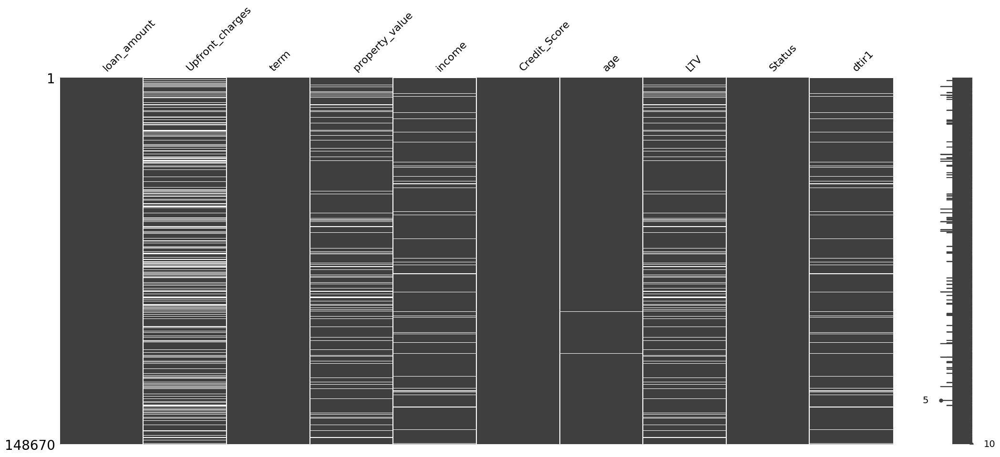

In [114]:
msno.matrix(df)

In [115]:
total = df.shape[0]
miss_columns = [col for col in df.columns if df[col].isnull().sum() > 0]
miss_percent = {}
for col in miss_columns:
    null_count = df[col].isnull().sum()
    percent = (null_count/total) * 100
    miss_percent[col] = percent
    print("{} : {} ({}%)".format(col, null_count, round(percent, 3)))

Upfront_charges : 39642 (26.664%)
term : 41 (0.028%)
property_value : 15098 (10.155%)
income : 9150 (6.155%)
age : 200 (0.135%)
LTV : 15098 (10.155%)
dtir1 : 9150 (6.155%)


In [116]:
df['dtir1'] = df['dtir1'].replace([np.inf, -np.inf], np.nan)

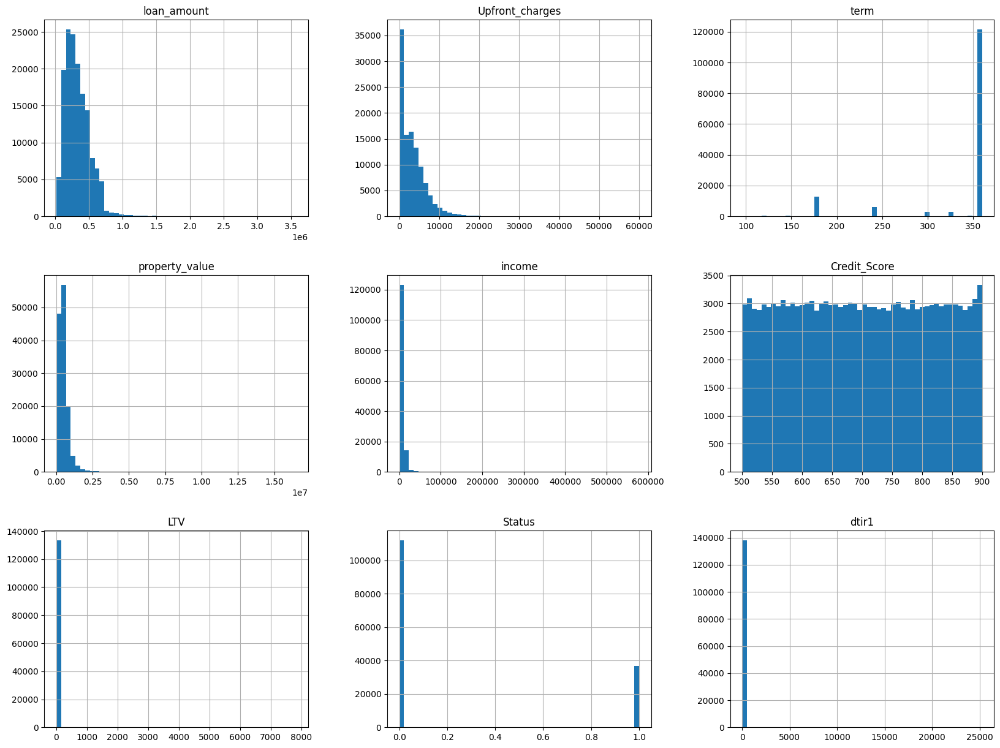

In [117]:
df.hist(bins = 50, figsize = (20, 15))
plt.show()

Text(0.5, 1.0, 'Correlation Heatmap')

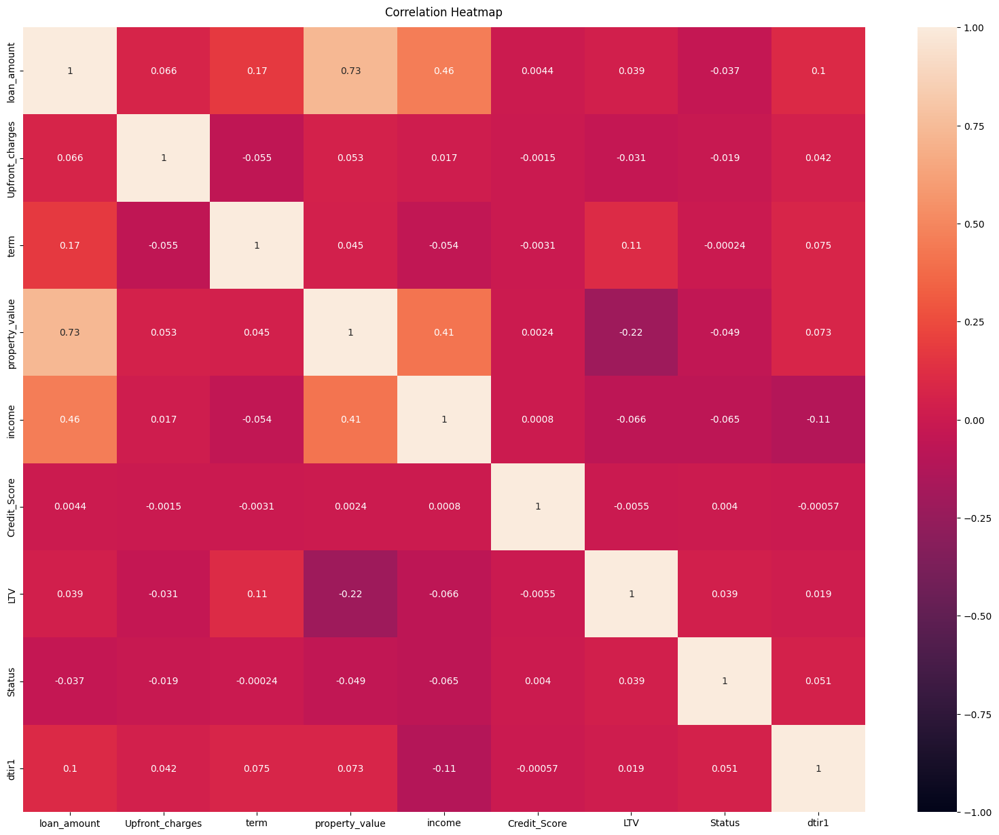

In [118]:
corr = df.drop(columns=["age"],axis=1).corr()
plt.figure(figsize=(20, 15))
heatmap = sb.heatmap(corr, vmin=-1, vmax=1, annot=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)

In [119]:
df.isnull().sum()

loan_amount            0
Upfront_charges    39642
term                  41
property_value     15098
income              9150
Credit_Score           0
age                  200
LTV                15098
Status                 0
dtir1              10410
dtype: int64

In [120]:
df.dtypes

loan_amount          int64
Upfront_charges    float64
term               float64
property_value     float64
income             float64
Credit_Score         int64
age                 object
LTV                float64
Status               int64
dtir1              float64
dtype: object

### Handling Missing Values: Column `Upfront_charges`

In [121]:
uc_att_1 = df["Upfront_charges"].fillna(df.groupby('loan_amount')['Upfront_charges'].transform(lambda x: x.mean()))
uc_att_1.isnull().sum()

54

In [122]:
uc_att_2 = df["Upfront_charges"].fillna(df.groupby(['loan_amount','term'])['Upfront_charges'].transform(lambda x: x.mean()))
uc_att_2.isnull().sum()

261

In [123]:
np.max(uc_att_1 - uc_att_2), np.min(uc_att_1 - uc_att_2)

(7812.465, -19690.0)

In [124]:
df["Upfront_charges"] = uc_att_2

### Handling Missing Values: Column `term`

In [125]:
df["term"].fillna(df.groupby('loan_amount')['term'].transform(lambda x: x.mode()[0])).isnull().sum()

0

In [126]:
df["term"].fillna(df.groupby('loan_amount')['term'].transform(lambda x: x.mode()[0]),inplace=True)

C:\Users\Stude\AppData\Local\Temp\ipykernel_9492\3484462955.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["term"].fillna(df.groupby('loan_amount')['term'].transform(lambda x: x.mode()[0]),inplace=True)


### Handling Missing Values: Column `property_value`

In [127]:
df["property_value"].fillna(df.groupby('loan_amount')['property_value'].transform(lambda x: x.mean())).isnull().sum()   

7

In [128]:
df["property_value"].fillna(df.groupby('loan_amount')['property_value'].transform(lambda x: x.mean()),inplace=True)   

C:\Users\Stude\AppData\Local\Temp\ipykernel_9492\464885817.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["property_value"].fillna(df.groupby('loan_amount')['property_value'].transform(lambda x: x.mean()),inplace=True)


### Handling Missing Values: Column `income`

In [129]:
df["income"].fillna(df.groupby('property_value')['income'].transform(lambda x: x.mean())).isnull().sum()

6

In [130]:
df["income"].fillna(df.groupby('property_value')['income'].transform(lambda x: x.mean()),inplace=True)

C:\Users\Stude\AppData\Local\Temp\ipykernel_9492\3743406681.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["income"].fillna(df.groupby('property_value')['income'].transform(lambda x: x.mean()),inplace=True)


In [131]:
df["income"]=df["income"].fillna(df["income"].mean())

In [132]:
df["income"].isnull().sum()

0

### Handling Missing Values: Column `age`

In [133]:
df["age"].fillna(df.groupby('property_value')['age'].transform(lambda x: x.mode()[0])).isnull().sum()

0

In [134]:
df["age"].fillna(df.groupby('property_value')['age'].transform(lambda x: x.mode()[0]),inplace=True)

C:\Users\Stude\AppData\Local\Temp\ipykernel_9492\3001916602.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["age"].fillna(df.groupby('property_value')['age'].transform(lambda x: x.mode()[0]),inplace=True)


### Handling Missing Values: Column `LTV`

In [135]:
(df["LTV"] - 100*df["loan_amount"]/df["property_value"]).mean()

1.3393921381366646e-10

In [136]:
df["LTV"]=100*df["loan_amount"]/df["property_value"]

In [137]:
df["LTV"].isnull().sum()

7

### Handling Missing Values: Column `dtir1`

In [138]:
df["dtir1"].isnull().sum()

10410

In [139]:
(df["loan_amount"]/df["income"]).isnull().sum()

0

In [140]:
df["dtir1"]=df["loan_amount"]/df["income"]

In [141]:
df['dtir1'] = df['dtir1'].replace([np.inf, -np.inf], np.nan)

In [142]:
df['dtir1'].isnull().sum()

1260

In [143]:
df["dtir1"].fillna(df.groupby('loan_amount')['dtir1'].transform(lambda x: x.mean())).isnull().sum()

1

In [144]:
df["dtir1"].fillna(df.groupby('loan_amount')['dtir1'].transform(lambda x: x.mean()),inplace=True)

C:\Users\Stude\AppData\Local\Temp\ipykernel_9492\2025548805.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["dtir1"].fillna(df.groupby('loan_amount')['dtir1'].transform(lambda x: x.mean()),inplace=True)


In [145]:
df = df.replace([np.inf, -np.inf], None)

In [146]:
df.isnull().sum()

loan_amount          0
Upfront_charges    261
term                 0
property_value       7
income               0
Credit_Score         0
age                  0
LTV                  7
Status               0
dtir1                1
dtype: int64

### Handling Missing Values: `Remaining Null Values`

In [147]:
df["Upfront_charges"]=df["Upfront_charges"].fillna(df["Upfront_charges"].mean())
df["property_value"]=df["property_value"].fillna(df["property_value"].mean())
df["LTV"]=df["LTV"].fillna(df["LTV"].mean())
df["dtir1"]=df["dtir1"].fillna(df["dtir1"].mean())

In [148]:
df.isnull().sum().sum()

0

In [149]:
del df_old
del df_main

cols = list(df.columns[:-2])
cols.extend([df.columns[-1],df.columns[-2]])

df = df[cols]
df.columns = df.columns.str.lower()
df_main = df.copy()

<a id="2.3"></a>
## 2.3 Outlier Analysis
Identify and handle outliers in the data.Plot features using boxplots to visualize outliers.

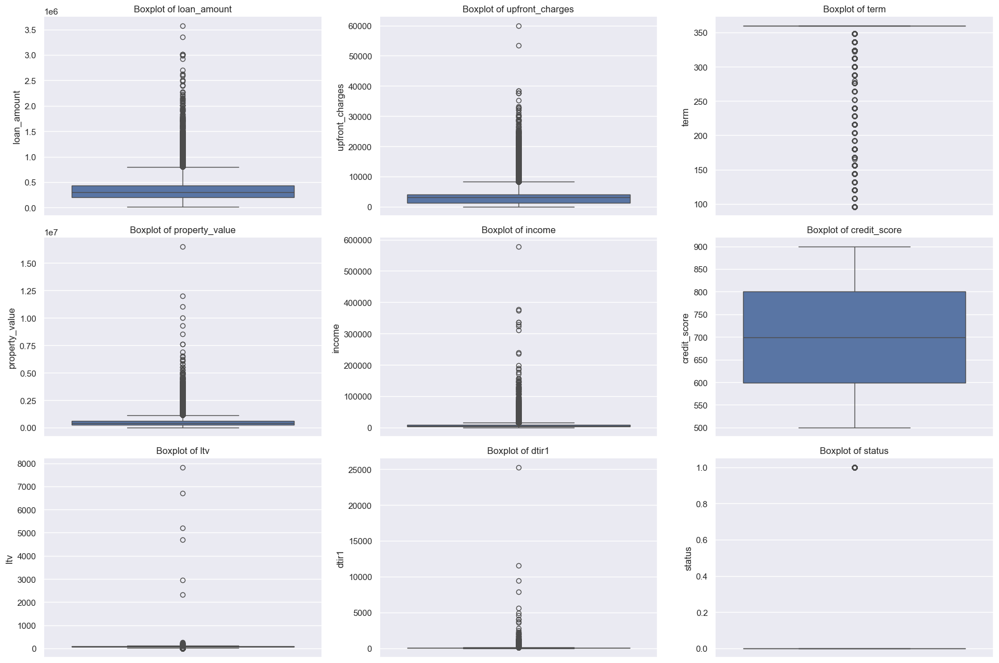

In [150]:
numeric_cols = df.select_dtypes(include=['number']).columns
plt.figure(figsize=(18, 12))  
sb.set_theme(style='darkgrid')

for i, col in enumerate(numeric_cols):
    plt.subplot(3, 3, i + 1)  
    sb.boxplot(y=col, data=df)
    plt.title(f'Boxplot of {col}')  

plt.tight_layout()  
plt.show()

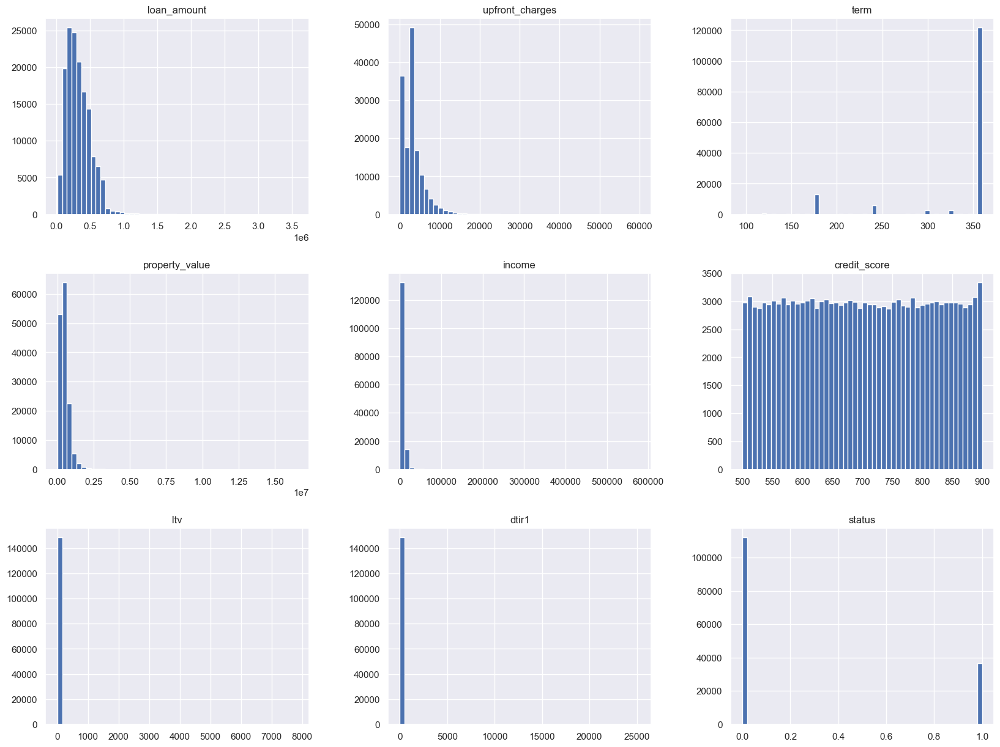

In [151]:
df.hist(bins = 50, figsize = (20, 15))
plt.show()

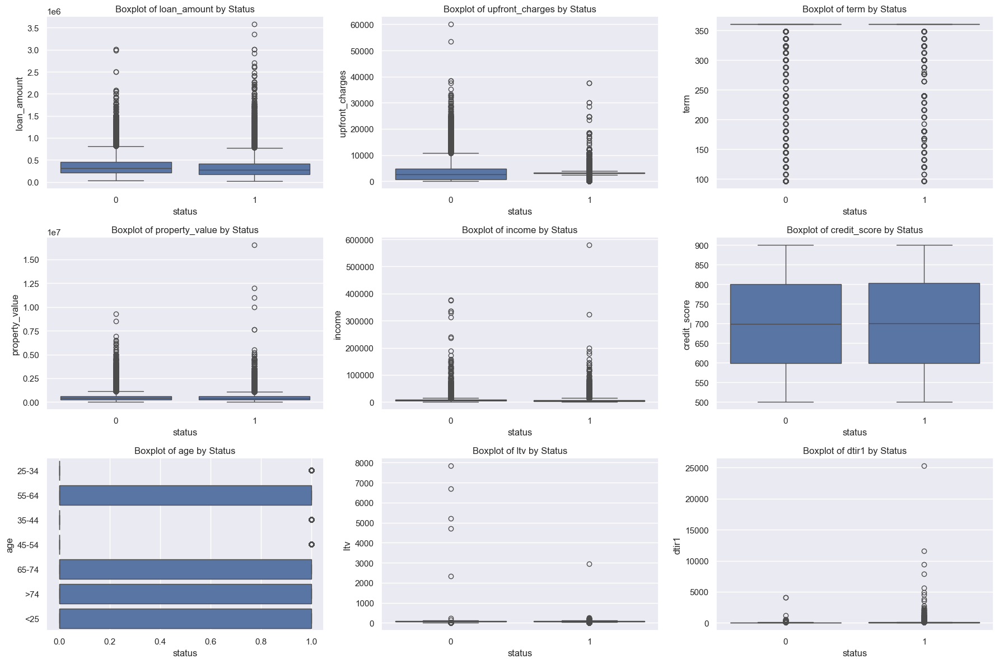

In [152]:
plt.figure(figsize=(18, 12))  
sb.set_theme(style='darkgrid')

for i, col in enumerate(df.columns[:-1]):
    plt.subplot(3, 3, i + 1)  
    sb.boxplot(x='status', y=col, data=df)
    plt.title(f'Boxplot of {col} by Status')  

plt.tight_layout()  
plt.show()

<a id="2.4"></a>
## 2.4 Strategies for Handling Imbalanced Data
<a id="2.4.1"></a>
### 2.4.1 SMOTE

In [153]:
df_2 = df.copy()
category_list = df["age"].astype('category').cat.categories.to_list()
df_2["age"] = df["age"].astype('category').cat.codes

In [154]:
category_list

['25-34', '35-44', '45-54', '55-64', '65-74', '<25', '>74']

In [155]:
y = df_2["status"].copy()
X = df_2.drop("status", axis=1).copy()
del df_2

In [156]:
smote = SMOTE(random_state=1)
X_smote, y_smote = smote.fit_resample(X, y)
df_smote = pd.concat([X_smote, y_smote], axis=1)
np.bincount(y_smote)

array([112031, 112031], dtype=int64)

In [157]:
df_smote.head()

,loan_amount,upfront_charges,term,property_value,income,credit_score,age,ltv,dtir1,status
0,116500,2570.136346,360.0,118000.000000,1740.0,758,0,98.728814,66.954023,1
1,206500,3002.893204,360.0,350858.517806,4980.0,552,3,58.855633,41.465863,1
2,406500,595.000000,360.0,508000.000000,9480.0,834,1,80.019685,42.879747,0
3,456500,2977.392940,360.0,658000.000000,11880.0,587,2,69.376900,38.425926,0
4,696500,0.000000,360.0,758000.000000,10440.0,602,0,91.886544,66.714559,0


In [158]:
X_smote["age"].value_counts()

age
2    56239
1    52706
3    49037
0    28453
4    26088
6     7579
5     3960
Name: count, dtype: int64

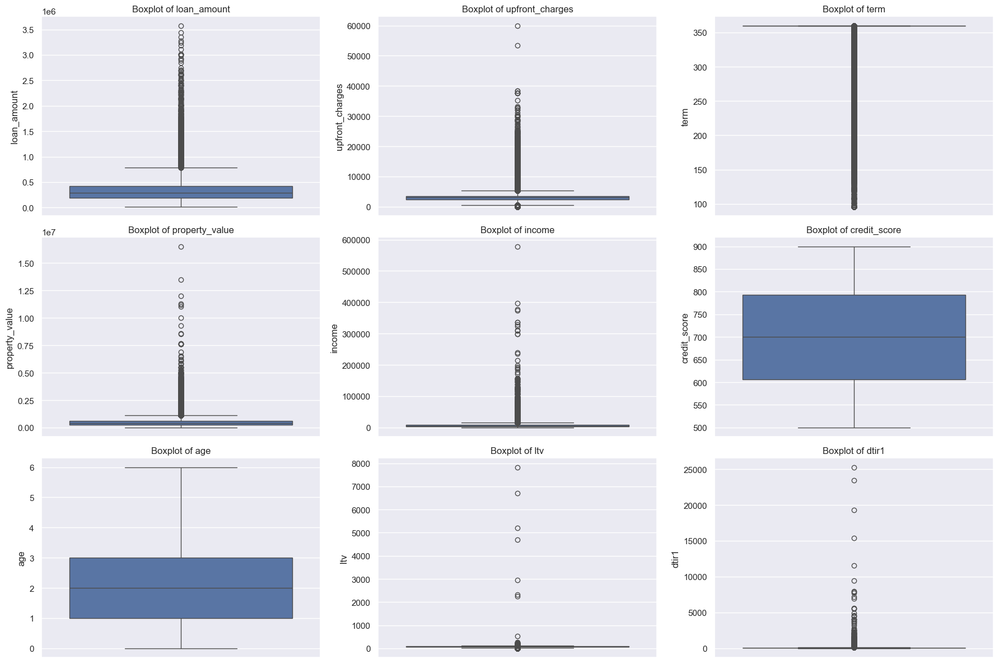

In [159]:
plt.figure(figsize=(18, 12))  
sb.set_theme(style='darkgrid')

for i, col in enumerate(df_smote.columns[:-1]):
    plt.subplot(3, 3, i + 1)  
    sb.boxplot(y=col, data=df_smote)
    plt.title(f'Boxplot of {col}')  

plt.tight_layout()  
plt.show()

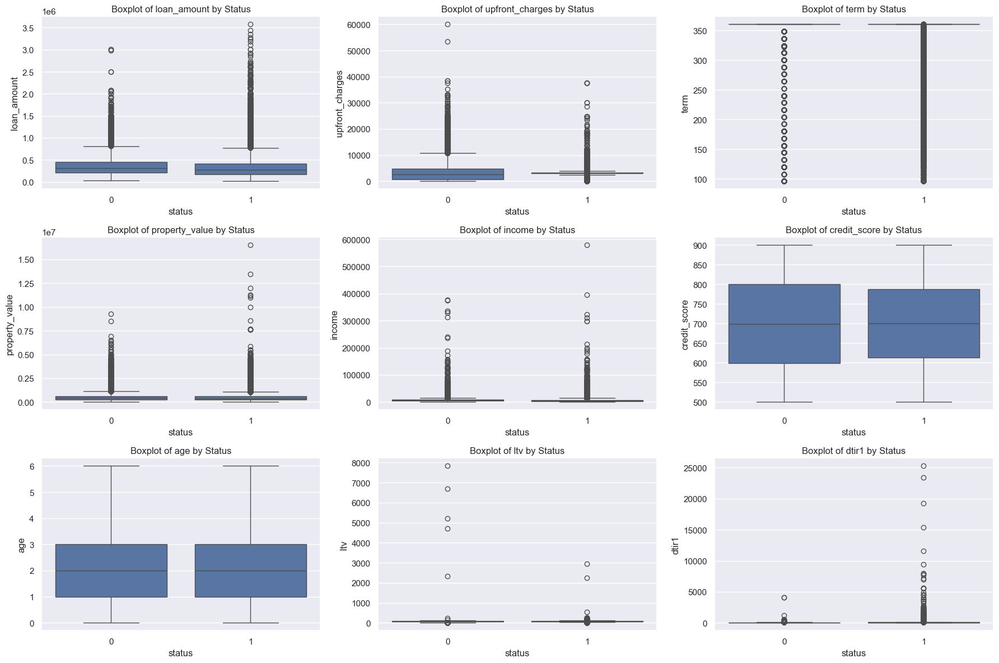

In [160]:
plt.figure(figsize=(18, 12))  
sb.set_theme(style='darkgrid')

for i, col in enumerate(df_smote.columns[:-1]):
    plt.subplot(3, 3, i + 1)  
    sb.boxplot(x='status', y=col, data=df_smote)
    plt.title(f'Boxplot of {col} by Status')  

plt.tight_layout()  
plt.show()

<a id="2.4.2"></a>
### 2.4.2 ADASYN

In [161]:
adasyn = ADASYN(random_state=1)
X_adasyn, y_adasyn = adasyn.fit_resample(X, y)
df_adasyn = pd.concat([X_adasyn, y_adasyn], axis=1)
np.bincount(y_adasyn)

array([112031, 110751], dtype=int64)

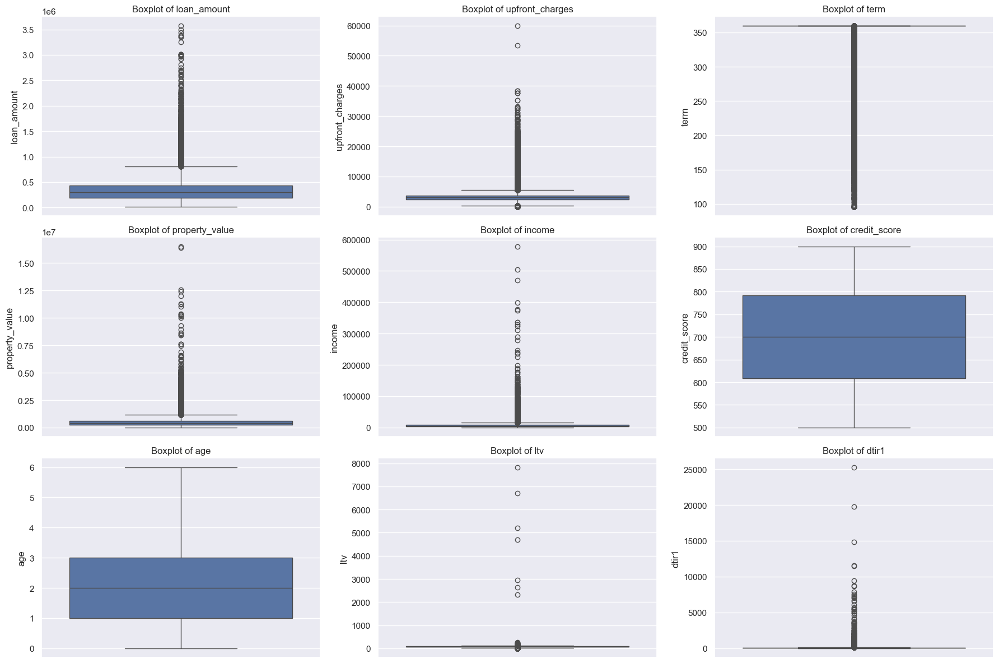

In [162]:
plt.figure(figsize=(18, 12))  
sb.set_theme(style='darkgrid')

for i, col in enumerate(df_adasyn.columns[:-1]):
    plt.subplot(3, 3, i + 1)  
    sb.boxplot(y=col, data=df_adasyn)
    plt.title(f'Boxplot of {col}')  

plt.tight_layout()  
plt.show()

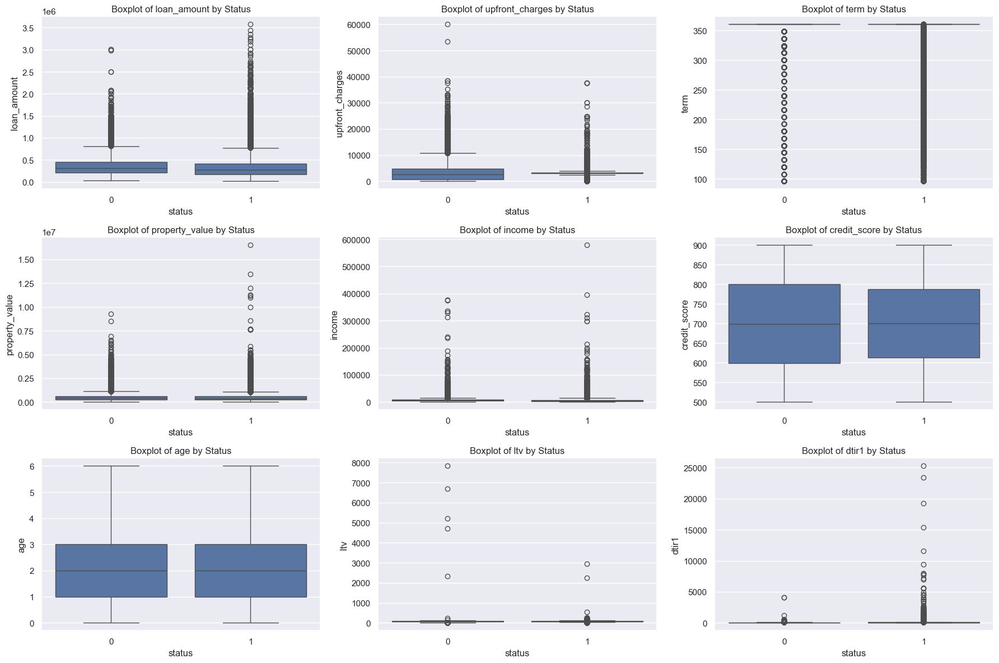

In [163]:
plt.figure(figsize=(18, 12))  
sb.set_theme(style='darkgrid')

for i, col in enumerate(df_smote.columns[:-1]):
    plt.subplot(3, 3, i + 1)  
    sb.boxplot(x='status', y=col, data=df_smote)
    plt.title(f'Boxplot of {col} by Status')  

plt.tight_layout()  
plt.show()

In [164]:
X_adasyn["age"].value_counts()

age
2    57809
1    51352
3    50026
0    26671
4    25607
6     7551
5     3766
Name: count, dtype: int64

<a id="2.4.3"></a>
### 2.4.3 Under Sampling

In [165]:
under_sampler = RandomUnderSampler(random_state=42)
X_under, y_under = under_sampler.fit_resample(X, y)
df_under = pd.concat([X_under, y_under], axis=1)
np.bincount(y_under)

array([36639, 36639], dtype=int64)

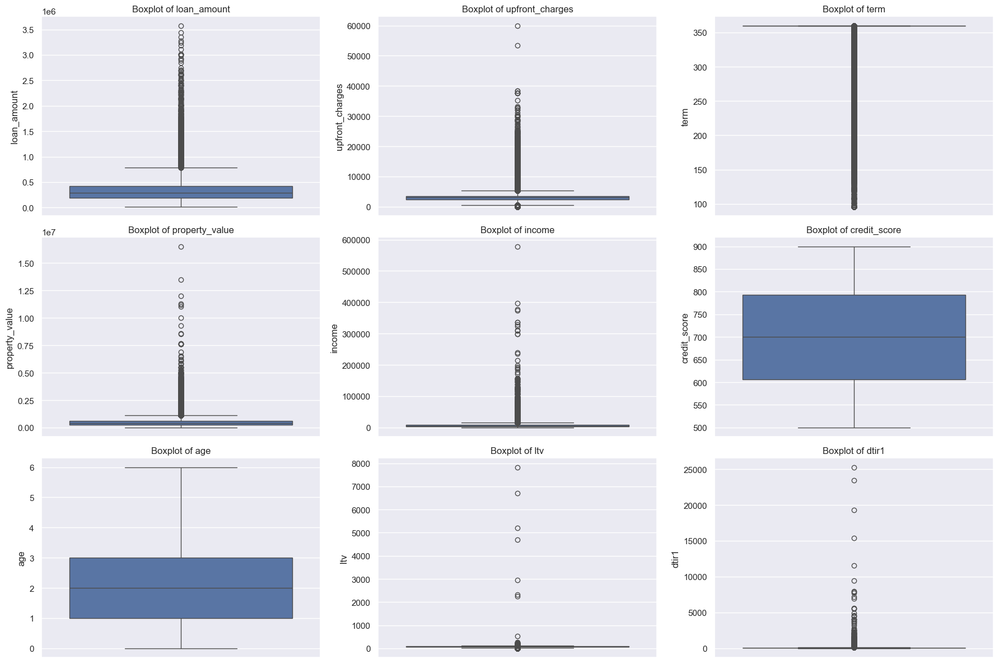

In [166]:
plt.figure(figsize=(18, 12))  
sb.set_theme(style='darkgrid')

for i, col in enumerate(df_smote.columns[:-1]):
    plt.subplot(3, 3, i + 1)  
    sb.boxplot(y=col, data=df_smote)
    plt.title(f'Boxplot of {col}')  

plt.tight_layout()  
plt.show()

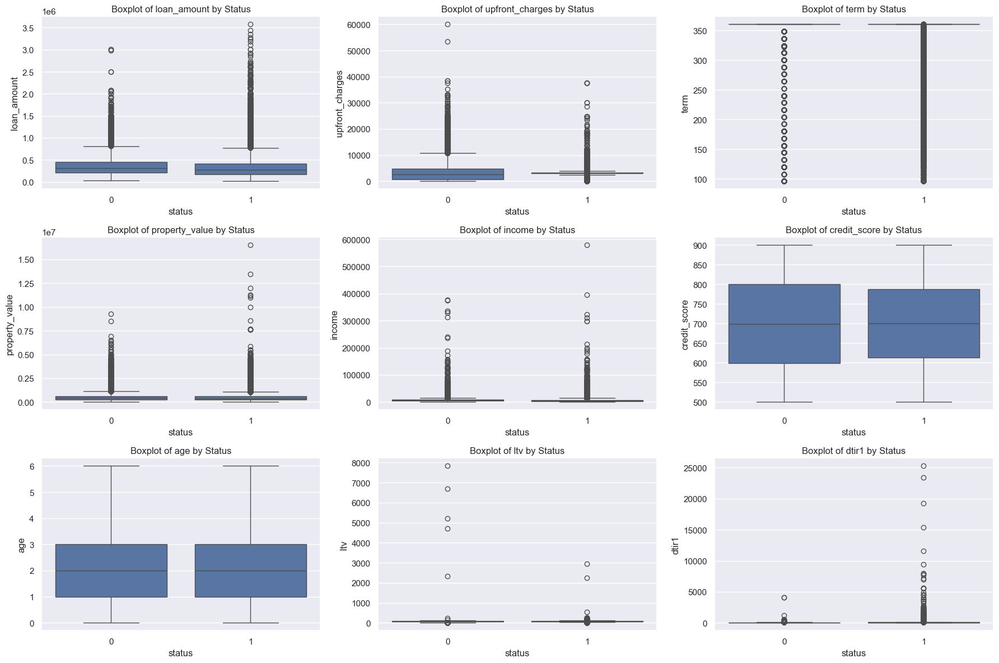

In [167]:
plt.figure(figsize=(18, 12))  
sb.set_theme(style='darkgrid')

for i, col in enumerate(df_smote.columns[:-1]):
    plt.subplot(3, 3, i + 1)  
    sb.boxplot(x='status', y=col, data=df_smote)
    plt.title(f'Boxplot of {col} by Status')  

plt.tight_layout()  
plt.show()

<a id="3"></a>
## Exploratory Data Analysis (EDA)

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#dfa8e4" data-toggle="popover">Content</a>

## 3.1 Data Visualization

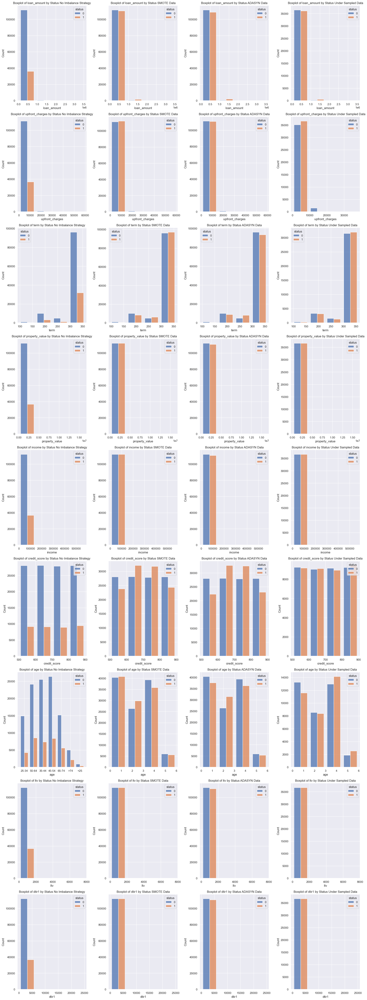

In [168]:
plt.figure(figsize=(20, 60))  
sb.set_theme(style='darkgrid')

df_sets = [df, df_smote, df_adasyn, df_under]
methods_for_imbalanced_data = ['No Imbalance Strategy', 'SMOTE Data', 'ADASYN Data', 'Under Sampled Data']

for i,col in enumerate(df.columns[:-1]):
    for j,title in enumerate(methods_for_imbalanced_data):
        plt.subplot(10, 4, i*4 + j+1)  
        sb.histplot(data=df_sets[j], x=col, hue="status", multiple="dodge", shrink=.8, bins=4)
        plt.title('Boxplot of {} by Status {}'.format(col,title))  
        

plt.tight_layout()  
plt.show()

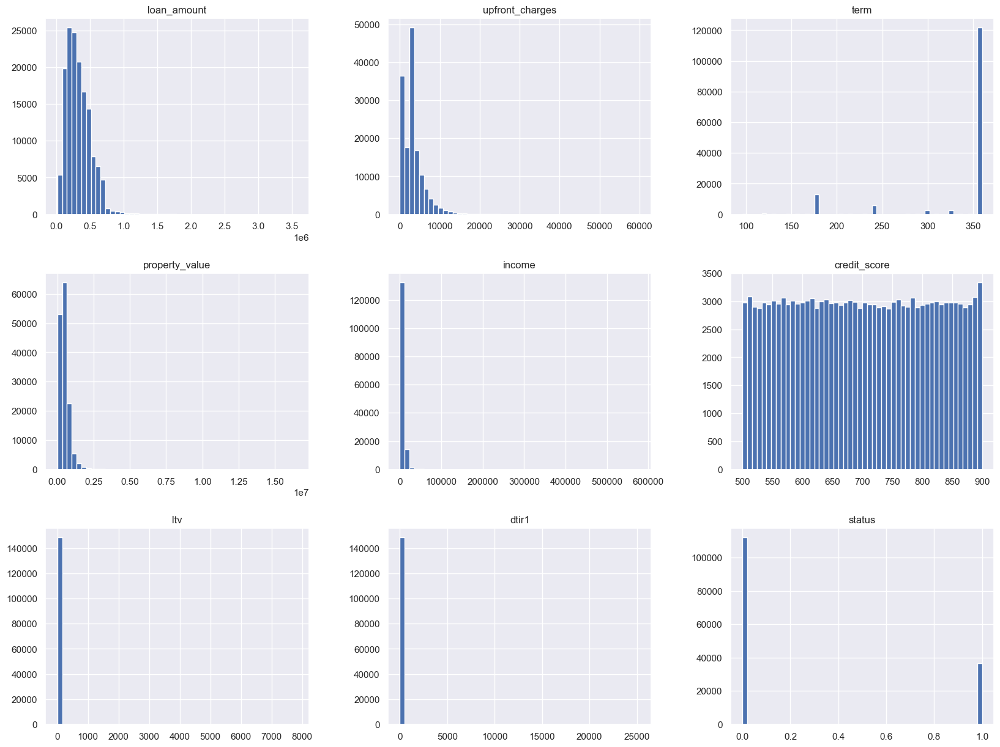

In [169]:
df.hist(bins = 50, figsize = (20, 15))
plt.show()

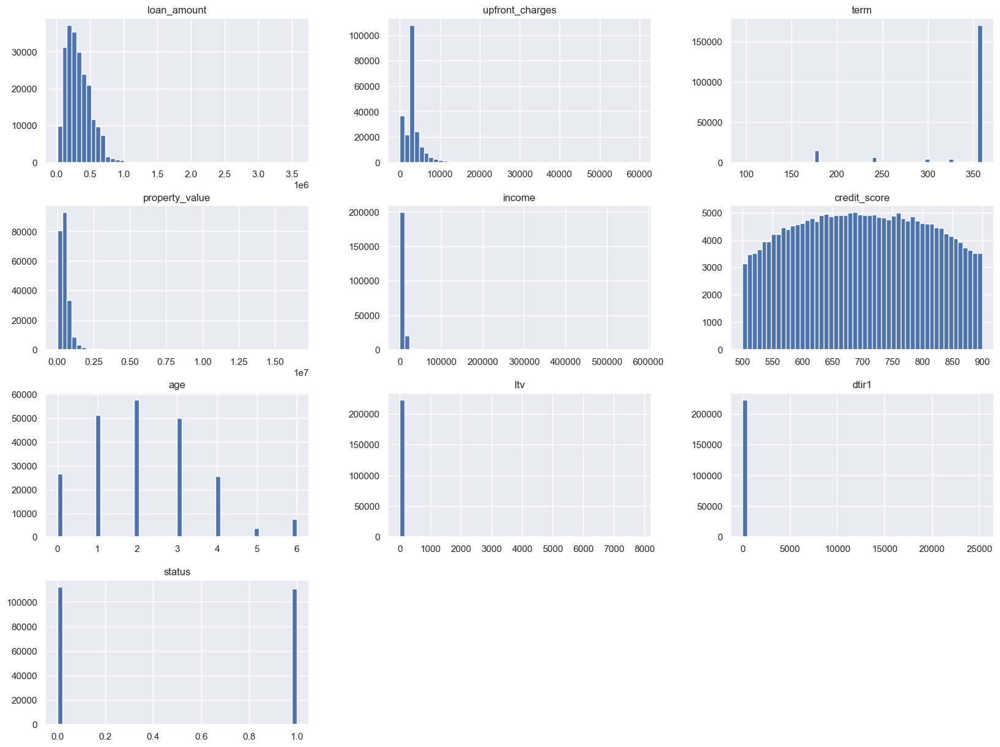

In [170]:
df_adasyn.hist(bins = 50, figsize = (20, 15))
plt.show()

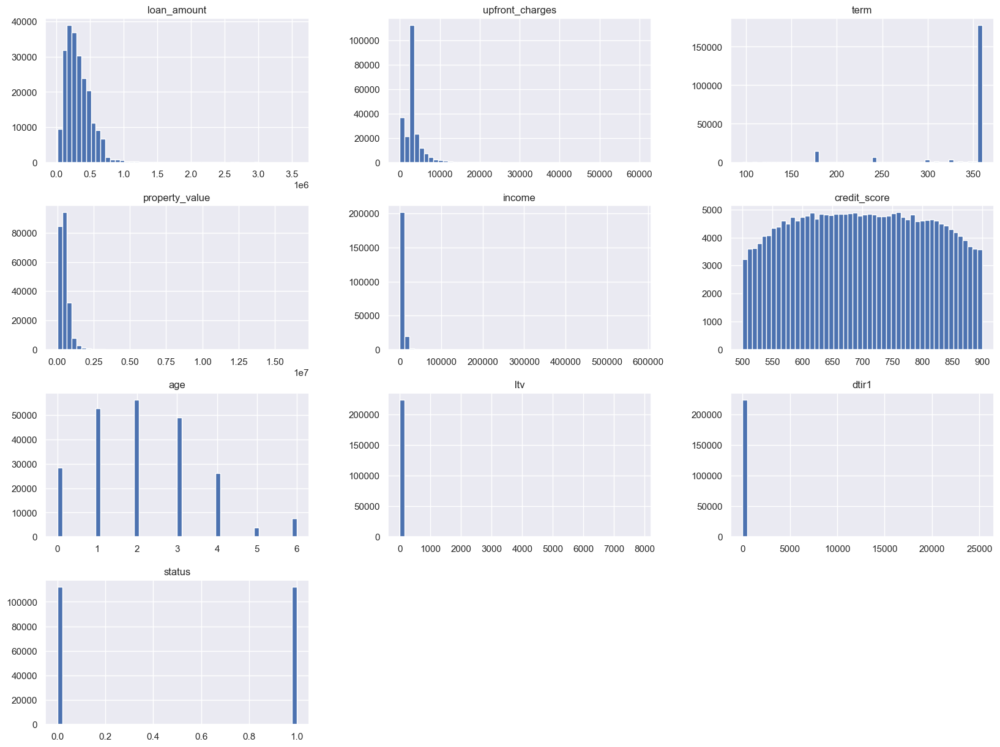

In [171]:
df_smote.hist(bins = 50, figsize = (20, 15))
plt.show()

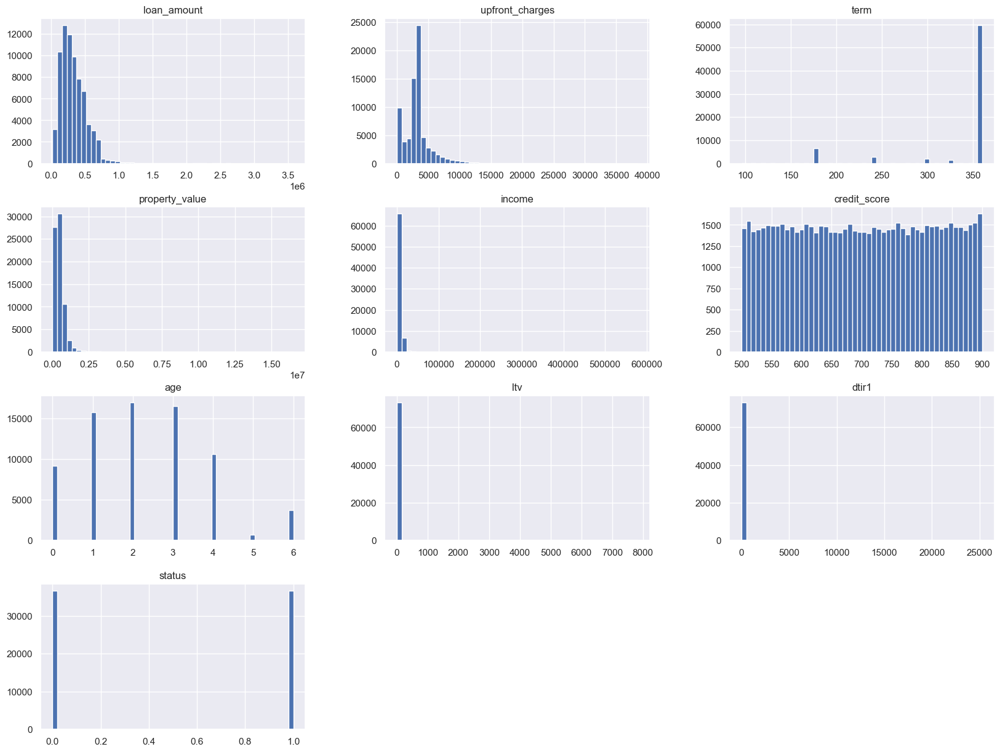

In [172]:
df_under.hist(bins = 50, figsize = (20, 15))
plt.show()

## 3.2 Correlation Analysis
Analyze correlations between numerical features

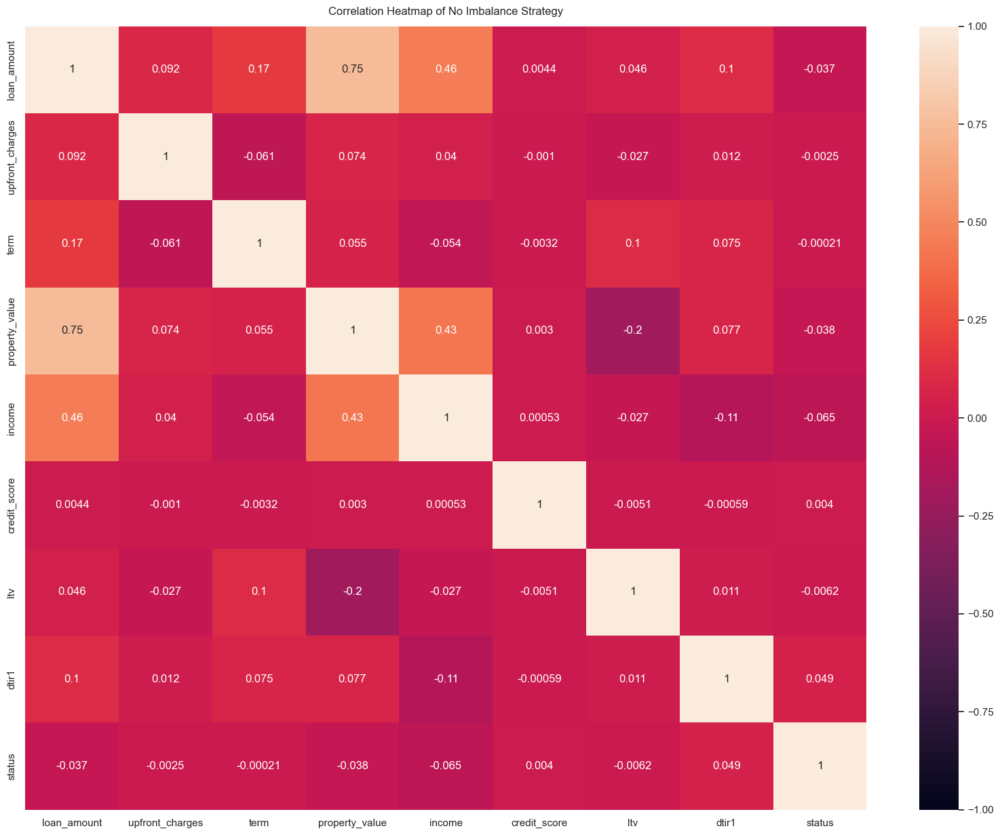

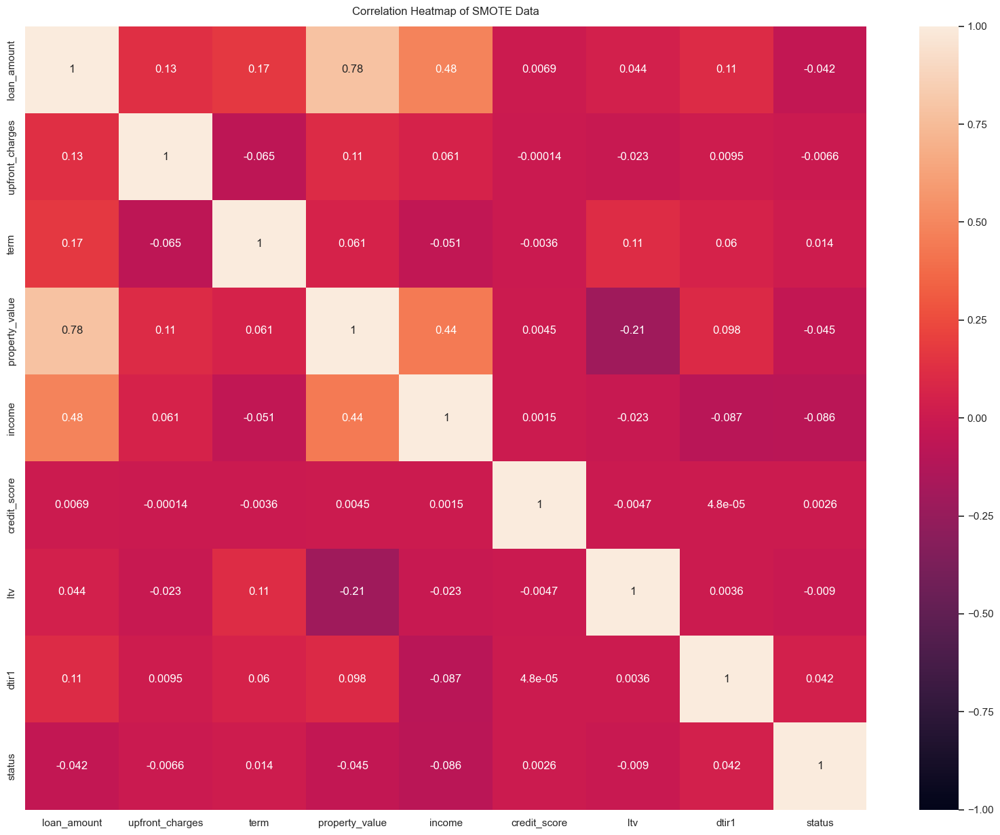

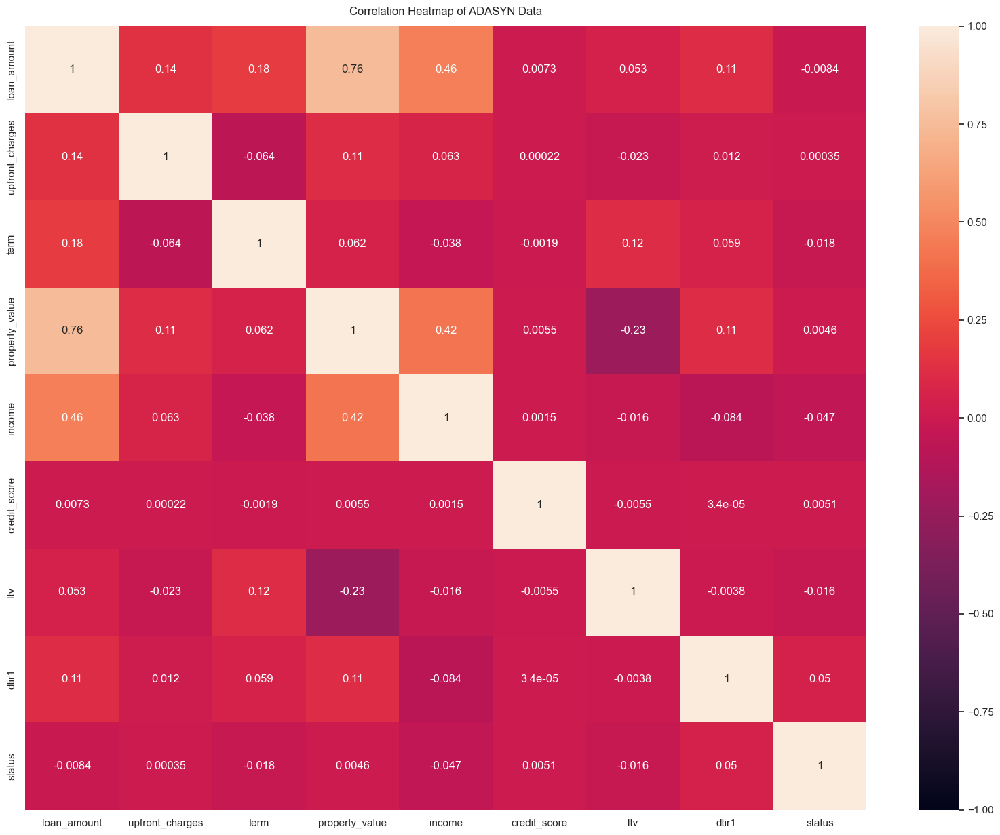

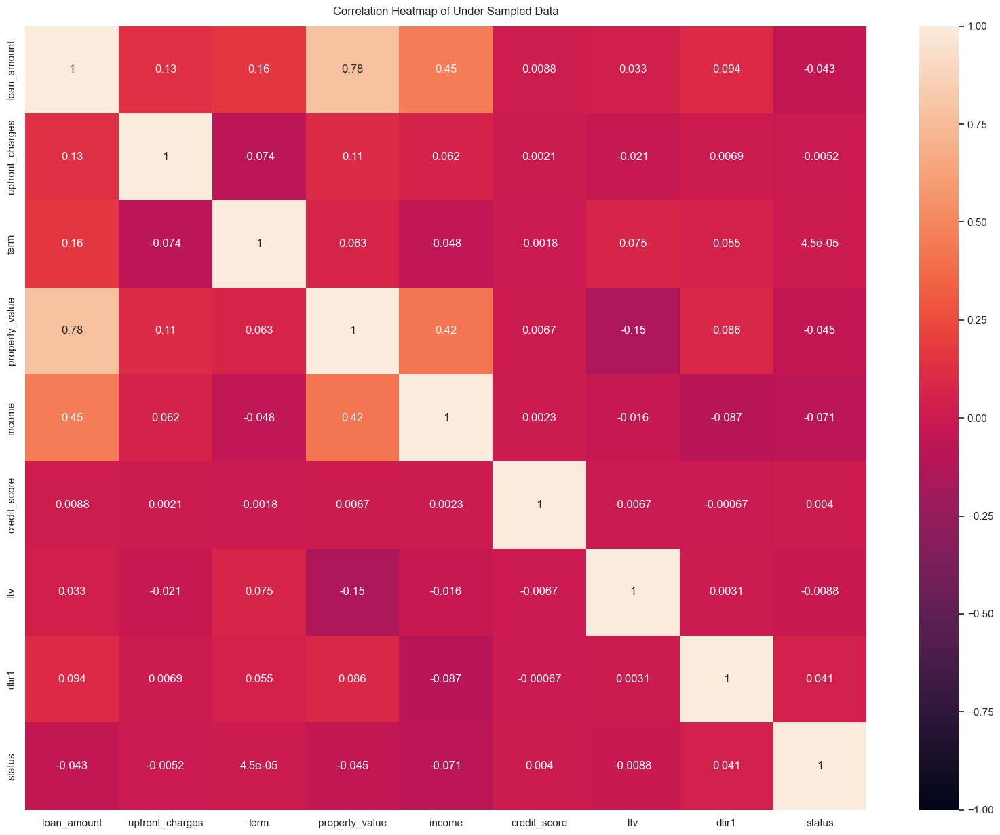

In [173]:
for i, method in enumerate(methods_for_imbalanced_data):
    corr = df_sets[i%4].drop(columns=["age"],axis=1).corr()
    plt.figure(figsize=(20, 15))
    heatmap = sb.heatmap(corr, vmin=-1, vmax=1, annot=True)
    heatmap.set_title('Correlation Heatmap of {}'.format(method), fontdict={'fontsize':12}, pad=12)

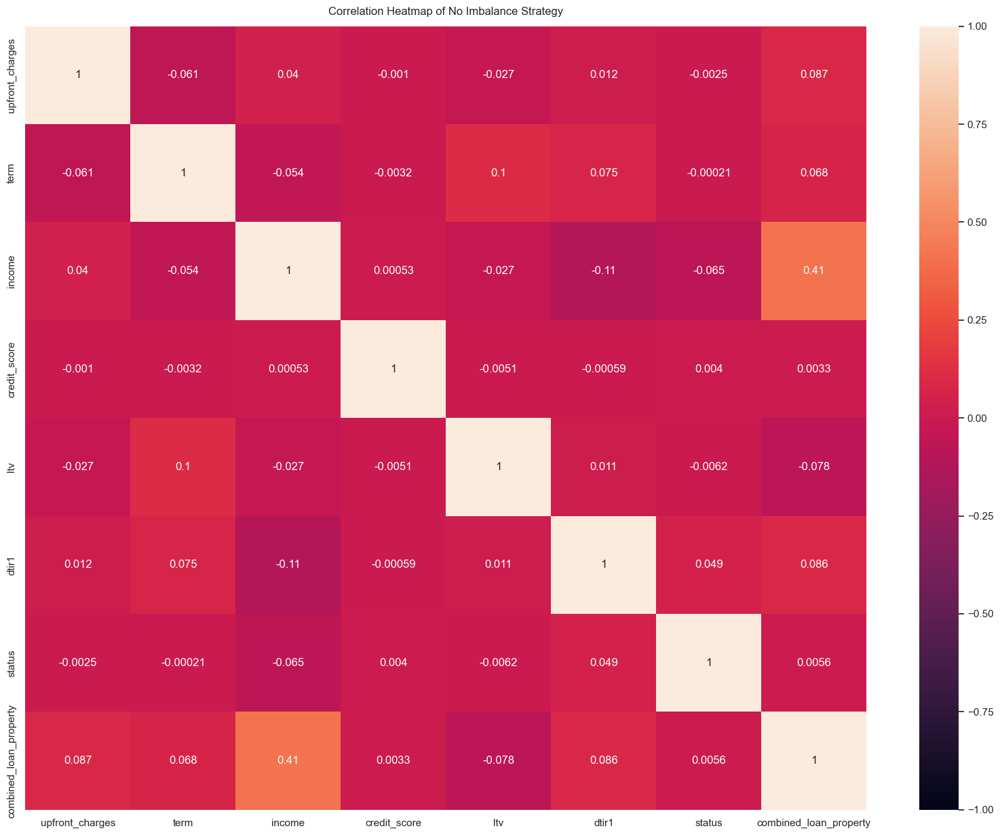

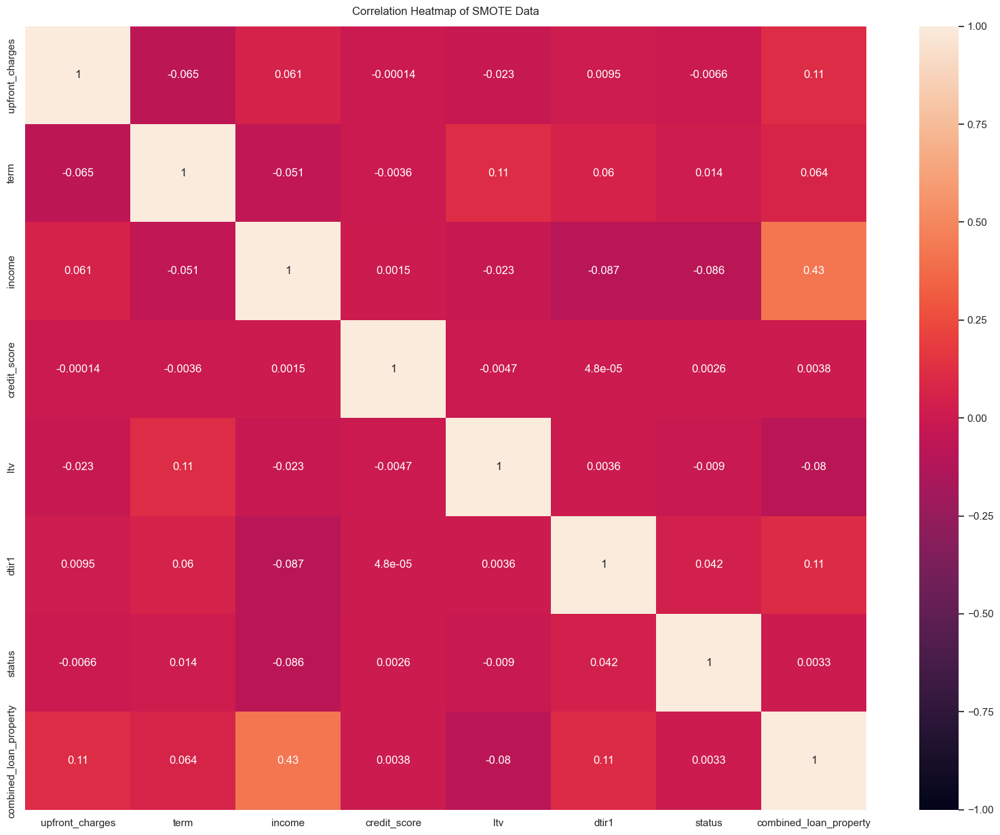

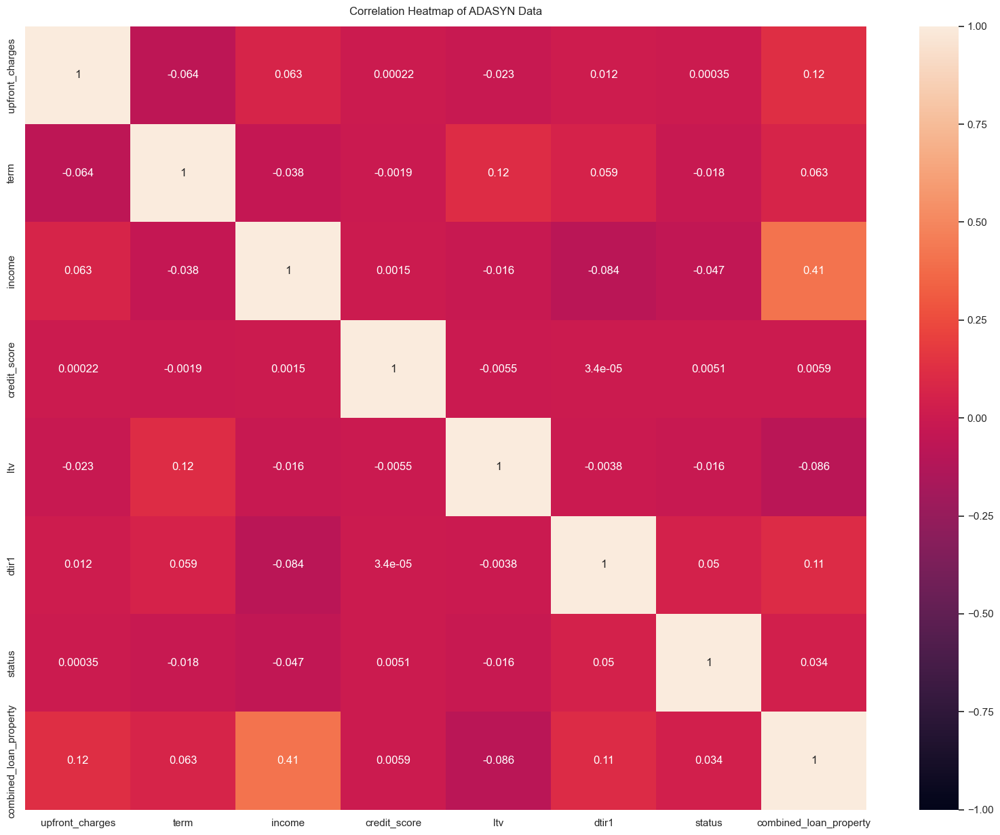

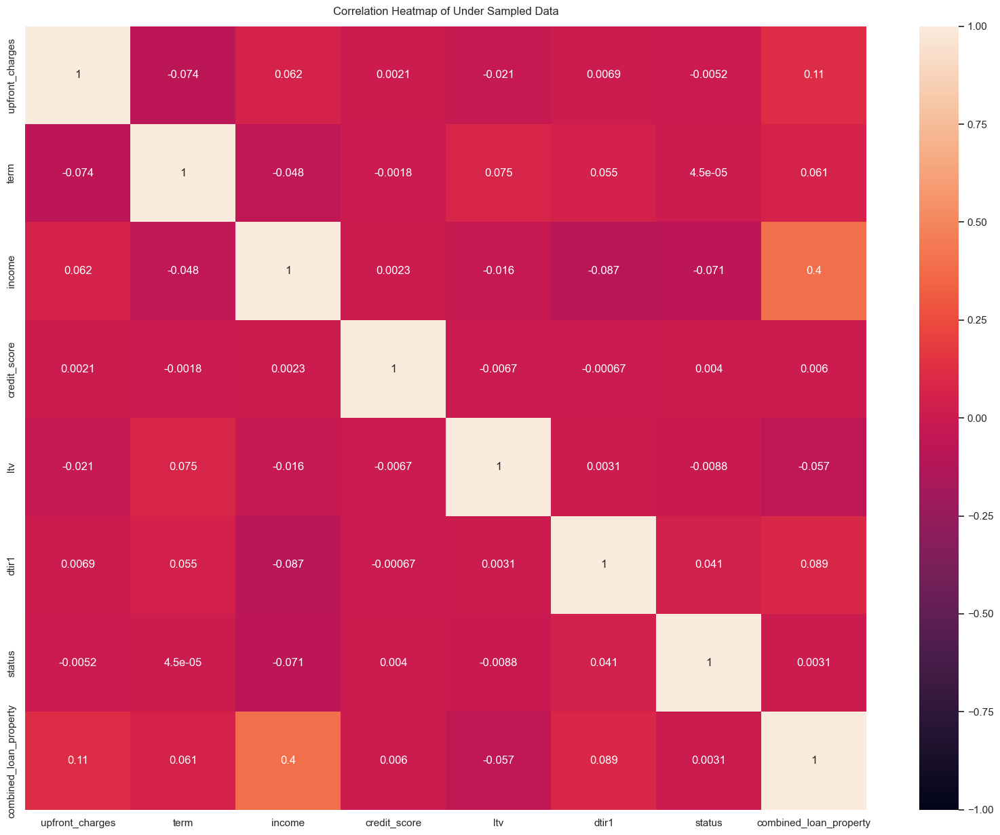

In [177]:
for i, method in enumerate(methods_for_imbalanced_data):
    the_set = df_sets[i%4].drop(columns=["age"],axis=1)
    the_set["combined_loan_property"] = the_set["loan_amount"]*the_set["property_value"]
    corr = the_set.drop(columns=["loan_amount","property_value"],axis=1).corr()
    plt.figure(figsize=(20, 15))
    heatmap = sb.heatmap(corr, vmin=-1, vmax=1, annot=True)
    heatmap.set_title('Correlation Heatmap of {}'.format(method), fontdict={'fontsize':12}, pad=12)

In [178]:
X["combined_loan_property"] = X["loan_amount"]*X["property_value"]
X.drop(columns=["loan_amount","property_value"],axis=1,inplace=True)

In [180]:
X.columns

Index(['upfront_charges', 'term', 'income', 'credit_score', 'age', 'ltv',
       'dtir1', 'combined_loan_property'],
      dtype='object')

<a id="4"></a>
## 4. Scaling, Categorical Variables, and Splitting

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#dfa8e4" data-toggle="popover">Content</a>
## 4.1 Scaling
Both **Standard Scaler** and **Min-Max Scaler** were applied to the dataset for scaling numerical features. 

- **Standard Scaler:** Scales the data to have a mean of 0 and a standard deviation of 1, which is useful for algorithms sensitive to feature scaling (e.g., Logistic Regression).
- **Min-Max Scaler:** Transforms the data to a fixed range (e.g., 0 to 1), which is beneficial for algorithms that rely on normalized inputs (e.g., Neural Networks).

By applying both scalers, the dataset can be tested with various models to determine the optimal scaling method for performance.

In [181]:
scalling_methods = ["No Scaling", "Standard Scaler", "Min Max Scaler"]
all_types_data = {i: {j : {k : None for k in ['X_train','X_test','y_train','y_test']}
                      for j in scalling_methods}
                      for i in methods_for_imbalanced_data}

In [182]:
age_column = X.pop('age')

In [183]:
X.dtypes

upfront_charges           float64
term                      float64
income                    float64
credit_score                int64
ltv                       float64
dtir1                     float64
combined_loan_property    float64
dtype: object

In [184]:
X = X.astype('float64')
X.dtypes

upfront_charges           float64
term                      float64
income                    float64
credit_score              float64
ltv                       float64
dtir1                     float64
combined_loan_property    float64
dtype: object

In [185]:
minmax = MinMaxScaler()
standard = StandardScaler()
X_minmax = X.copy()
X_standard = X.copy()
X_minmax[:] = minmax.fit_transform(X[:])
X_standard[:] = standard.fit_transform(X[:])


## 4.2 Encoding Categorical Variables
Only one feature in the dataset requires encoding.

In [186]:
X = pd.concat([X,pd.get_dummies(age_column,
                         drop_first=False,dtype=float,prefix='age')],axis=1)

X_minmax = pd.concat([X_minmax,pd.get_dummies(age_column,
                         drop_first=False,dtype=float,prefix='age')], axis=1)

X_standard = pd.concat([X_standard,pd.get_dummies(age_column,
                        drop_first=False,dtype=float,prefix='age')], axis=1)

In [187]:
X.head(1)

,upfront_charges,term,income,credit_score,ltv,dtir1,combined_loan_property,age_0,age_1,age_2,age_3,age_4,age_5,age_6
0,2570.136346,360.0,1740.0,758.0,98.728814,66.954023,1.374700e+10,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [188]:
X_minmax.head(1)

,upfront_charges,term,income,credit_score,ltv,dtir1,combined_loan_property,age_0,age_1,age_2,age_3,age_4,age_5,age_6
0,0.042836,1.0,0.003007,0.645,0.012485,0.002625,0.000329,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [189]:

Xs = [X,X_smote,X_adasyn,X_under]
ys = [y,y_smote,y_adasyn,y_under]
for index,data_frame in enumerate(methods_for_imbalanced_data):
    X_train, X_test, y_train, y_test = train_test_split(Xs[index], ys[index], test_size=0.3, stratify=ys[index], random_state=1)
    all_types_data[data_frame]["No Scaling"]["X_train"]=X_train
    all_types_data[data_frame]["No Scaling"]["X_test"]=X_test
    for method in scalling_methods:
        all_types_data[data_frame][method]["y_train"]=y_train
        all_types_data[data_frame][method]["y_test"]=y_test

In [190]:
X_standard.head(1)

,upfront_charges,term,income,credit_score,ltv,dtir1,combined_loan_property,age_0,age_1,age_2,age_3,age_4,age_5,age_6
0,-0.231063,0.425609,-0.821848,0.502357,0.70463,0.114798,-0.560598,1.0,0.0,0.0,0.0,0.0,0.0,0.0


### 4.3 Splitting the Data into Training and Testing Sets

To prevent data leakage and ensure robust evaluation, the dataset was split into training and testing subsets as follows:

- **Train/Test Split:** The data was split into 80% for training and 20% for testing.
- **Stratified Sampling:** Since the dataset is imbalanced, stratified sampling was applied to maintain the proportion of classes in both training and testing sets, ensuring that the minority class is adequately represented in each subset.

In [191]:
train_index, test_index = train_test_split(X.index, test_size=0.3, stratify=y, random_state=1)

In [192]:
def imbalance_strategy_applier(imbalance_method,data_X,data_y):
    if imbalance_method == "No Imbalance Strategy":
        return data_X,data_y
    elif imbalance_method == 'SMOTE Data':
        smote = SMOTE(random_state=1)
        X_smote, y_smote = smote.fit_resample(data_X, data_y)
        return X_smote, y_smote
    elif imbalance_method == 'ADASYN Data':
        adasyn = ADASYN(random_state=1)
        X_adasyn, y_adasyn = adasyn.fit_resample(data_X, data_y)
        return X_adasyn, y_adasyn
    elif imbalance_method == 'Under Sampled Data':
        under_sampler = RandomUnderSampler(random_state=1)
        X_under, y_under = under_sampler.fit_resample(data_X, data_y)
        return X_under, y_under


In [193]:
methods_for_imbalanced_data = ['No Imbalance Strategy', 'SMOTE Data', 'ADASYN Data', 'Under Sampled Data']
for imbalance_method in methods_for_imbalanced_data:
    for method_name, data in zip(scalling_methods, [X, X_standard, X_minmax]):
        data_X, data_y = imbalance_strategy_applier(imbalance_method,
                                                    data.loc[train_index],
                                                    y[train_index])
        all_types_data[imbalance_method][method_name]["X_train"] = data_X 
        all_types_data[imbalance_method][method_name]["y_train"] = data_y
        all_types_data[imbalance_method][method_name]["X_test"] = data.loc[test_index]
        all_types_data[imbalance_method][method_name]["y_test"] = y.loc[test_index]

<a id="5"></a>
## 5. Models
- <a href="#5.1">KNN Classifier</a><br>
- <a href="#5.2">Logistic Regression</a><br>
- <a href="#5.3">Neural Networks</a><br>
- <a href="#5.4">Decision Tree</a><br>
- <a href="#5.5">Random Forest</a><br>
- <a href="#5.6">XGBoost</a><br>
- <a href="#5.7">LightGBM</a><br>
- <a href="#5.8">CatBoost</a><br>

<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#dfa8e4" data-toggle="popover">Content</a>

## 5.1 Creating Models and Fine-Tuning


In [302]:
def visualize_model_performance(results, model_name):
    # Prepare data for visualization
    performance_data = []
    for data_frame in results[model_name]:
        for scaling_method in results[model_name][data_frame]:
            test_results = results[model_name][data_frame][scaling_method].get('Test', {})
            performance_data.append({
                'Imbalance Method': data_frame,
                'Scaling Method': scaling_method,
                'Accuracy': test_results.get('Accuracy', np.nan),
                'F1 Score': test_results.get('F1 Score', np.nan),
                'Recall': test_results.get('Recall', np.nan),
                'ROC AUC': test_results.get('ROC', np.nan)
            })
    
    df_performance = pd.DataFrame(performance_data)
    # Set up the matplotlib figure
    plt.figure(figsize=(20, 15))

    metrics = ['Accuracy', 'F1 Score', 'Recall', 'ROC AUC']
    # Heatmaps for each metric
    for i, metric in enumerate(metrics, 1):
        plt.subplot(2, 3, i)
        
        pivot_metric = df_performance.pivot(
            index='Imbalance Method', 
            columns='Scaling Method', 
            values=metric
        )
        sb.heatmap(pivot_metric, annot=True, cmap='YlGnBu', center=pivot_metric.mean().mean())
        plt.title(f'{metric} Heatmap')
        plt.tight_layout()
    
    # 5. Comparative Bar Plot (Recall)
    ax = plt.subplot(2, 3, 5)
    sb.barplot(
        x='Imbalance Method', 
        y='Recall', 
        hue='Scaling Method', 
        data=df_performance
    )
    ax.set_ylim([0, 1])
    plt.title(f'{model_name} Recall Comparison')
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    # 6. Normalized Performance Radar Chart
    ax = plt.subplot(2, 3, 6)
    ax.set_ylim([0, 1])
    df_melted = pd.melt(
        df_performance, 
        id_vars=['Imbalance Method', 'Scaling Method'], 
        value_vars=['Accuracy', 'F1 Score', 'ROC AUC'],
        var_name='Metric', 
        value_name='Value'
    )
    
    sb.boxplot(
        x='Imbalance Method', 
        y='Value', 
        hue='Metric', 
        data=df_melted
    )
    plt.title('Overall Performance Metrics')
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    # Adjust layout and show plot
    plt.suptitle(f'{model_name} Model Performance Analysis', fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

    # Print detailed performance summary
    print(f"\n{model_name} Performance Summary:")
    summary = df_performance.groupby(['Imbalance Method', 'Scaling Method']).mean()
    print(summary)
    
    # Identify best configurations
    print(f"\nBest {model_name} Configurations:")
    for metric in metrics:
        best_idx = df_performance[metric].idxmax()
        print(f"\nBest {metric} Configuration:")
        print(df_performance.loc[best_idx])
    
    return None #df_performance

def set_save_results(model_list, model_name, data_frame, method, train_accuracy,test_metric, model, results):
    results[model_name][data_frame][method]["Train"] = train_accuracy
    results[model_name][data_frame][method]["Test"] = test_metric
    model_list[data_frame+"_"+method] = model

def run_model(model, all_types_data, data_frame,method, importance=False):
    model.fit(all_types_data[data_frame][method]["X_train"], all_types_data[data_frame][method]["y_train"])
    prediction = model.predict(all_types_data[data_frame][method]["X_test"])
    train_accuracy = model.score(all_types_data[data_frame][method]["X_train"], 
                                                                all_types_data[data_frame][method]["y_train"])
    test_metric = {
                "Accuracy": accuracy_score(all_types_data[data_frame][method]["y_test"], prediction),
                "Precision": precision_score(all_types_data[data_frame][method]["y_test"], prediction),
                "Recall": recall_score(all_types_data[data_frame][method]["y_test"], prediction),
                "F1 Score": f1_score(all_types_data[data_frame][method]["y_test"], prediction),
                "Confusion Matrix": confusion_matrix(all_types_data[data_frame][method]["y_test"], prediction),
                "ROC": roc_auc_score(all_types_data[data_frame][method]["y_test"], prediction)
            }
    print("Train Score : ",train_accuracy)
    print("Test Score : ",test_metric["Accuracy"])
    print("Test F1 Score : ",test_metric["F1 Score"])
    print("Test ROC : ", test_metric["ROC"])
    print("Test Recall : ", test_metric["Recall"])
    if importance:
        print("Feature Importance : ",model.feature_importances_)
    return train_accuracy,test_metric, model

def run_check_model(model, results, all_types_data, data_frame,method, model_name, importance=False):
    model.fit(all_types_data[data_frame][method]["X_train"], all_types_data[data_frame][method]["y_train"])
    prediction = model.predict(all_types_data[data_frame][method]["X_test"])
    train_accuracy = model.score(all_types_data[data_frame][method]["X_train"], 
                                                                all_types_data[data_frame][method]["y_train"])
    test_metric = {
                "Accuracy": accuracy_score(all_types_data[data_frame][method]["y_test"], prediction),
                "Precision": precision_score(all_types_data[data_frame][method]["y_test"], prediction),
                "Recall": recall_score(all_types_data[data_frame][method]["y_test"], prediction),
                "F1 Score": f1_score(all_types_data[data_frame][method]["y_test"], prediction),
                "Confusion Matrix": confusion_matrix(all_types_data[data_frame][method]["y_test"], prediction),
                "ROC": roc_auc_score(all_types_data[data_frame][method]["y_test"], prediction)
            }
    print("Train Score : ",train_accuracy - results[model_name][data_frame][method]["Train"])
    print("Test Score : ",test_metric["Accuracy"] - results[model_name][data_frame][method]["Test"]["Accuracy"])
    print("Test F1 Score : ", test_metric["F1 Score"]- results[model_name][data_frame][method]["Test"]["F1 Score"])
    print("Test ROC : ", test_metric["ROC"] - results[model_name][data_frame][method]["Test"]["ROC"])
    print("Test Recall : ", test_metric["Recall"] - results[model_name][data_frame][method]["Test"]["Recall"])
    if importance:
        print("Feature Importance : ",model.feature_importances_)
    return train_accuracy,test_metric, model

def plot_model_comparison(y_true, y_pred_model1, y_pred_model2, model1_name="Model 1", model2_name="Model 2"):

    # Calculate metrics for both models
    metrics_model1 = {
        'Accuracy': accuracy_score(y_true, y_pred_model1),
        'Precision': precision_score(y_true, y_pred_model1),
        'Recall': recall_score(y_true, y_pred_model1),
        'F1 Score': f1_score(y_true, y_pred_model1)
    }
    
    metrics_model2 = {
        'Accuracy': accuracy_score(y_true, y_pred_model2),
        'Precision': precision_score(y_true, y_pred_model2),
        'Recall': recall_score(y_true, y_pred_model2),
        'F1 Score': f1_score(y_true, y_pred_model2)
    }
    
    # Create figure with subplots
    fig = plt.figure(figsize=(15, 10))
    
    # 1. Bar plot comparing metrics
    plt.subplot(2, 1, 1)
    x = np.arange(len(metrics_model1))
    width = 0.35
    
    bars1 = plt.bar(x - width/2, metrics_model1.values(), width, label=model1_name)
    bars2 = plt.bar(x + width/2, metrics_model2.values(), width, label=model2_name)
    
    plt.ylabel('Score')
    plt.title('Model Performance Comparison')
    plt.xticks(x, metrics_model1.keys())
    plt.legend()
    plt.ylim(0, 1)
    
    # Add value labels on bars
    def autolabel(bars):
        for bar in bars:
            height = bar.get_height()
            plt.text(bar.get_x() + bar.get_width()/2., height,
                    f'{height:.3f}',
                    ha='center', va='bottom')
    
    autolabel(bars1)
    autolabel(bars2)
    plt.grid(True, alpha=0.3)
    
    # 2. Heatmap comparison
    plt.subplot(2, 1, 2)
    metrics_array = np.array([
        list(metrics_model1.values()),
        list(metrics_model2.values())
    ])
    
    sb.heatmap(metrics_array, 
                annot=True, 
                fmt='.3f',
                xticklabels=list(metrics_model1.keys()),
                yticklabels=[model1_name, model2_name],
                cmap='YlOrRd')
    plt.title('Metrics Comparison Heatmap')
    
    # Adjust layout
    plt.tight_layout()
    
    return fig


In [195]:
model_names = ["KNN","Decision Tree","Random Forest","Logistic Regression","MLP","XGBoost","LightGBM","CatBoost"]
results = {l:{i:{j:{k:None for k in ["Test","Train"]} for j in scalling_methods} for i in methods_for_imbalanced_data} for l in model_names}

<a id="5.1"></a>
## 5.1 KNN Classifier
<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#dfa8e4" data-toggle="popover">Content</a>

In [196]:
KNN = {}
model_number = 0
c=0
for data_frame in all_types_data:
    for method in scalling_methods:
        print("Progress: {:.2f}%".format(100*(c)/(len(all_types_data)*len(scalling_methods))))
        c+=1
        print("Model: {}".format(model_names[model_number]))
        print("Data Frame : {} , Scalling Method : {}".format(data_frame,method))
        model = KNeighborsClassifier(n_neighbors=5, # 5, 7, 10, 15, 20, 25
                                     algorithm='auto', # auto, ball_tree, kd_tree, brute
                                     leaf_size=30, # 30, 40, 50, 60, 70, 80, 90, 100
                                     p=2) # 1, 2
        train_accuracy,test_metric, model = run_model(model, all_types_data, data_frame,method, importance=False)
        set_save_results(KNN, model_names[model_number], data_frame, method, train_accuracy,test_metric, model, results)
        print("---------------------------------------------------")
        

Progress: 0.00%
Model: KNN
Data Frame : No Imbalance Strategy , Scalling Method : No Scaling
Train Score :  0.903170012203442
Test Score :  0.8615277684356853
Test F1 Score :  0.6969280596721955
Test ROC :  0.7890137712319988
Test Recall :  0.6460152838427947
---------------------------------------------------
Progress: 8.33%
Model: KNN
Data Frame : No Imbalance Strategy , Scalling Method : Standard Scaler
Train Score :  0.9039387329560196
Test Score :  0.8526490437434138
Test F1 Score :  0.7158914058447172
Test ROC :  0.8192124601164092
Test Recall :  0.7532751091703057
---------------------------------------------------
Progress: 16.67%
Model: KNN
Data Frame : No Imbalance Strategy , Scalling Method : Min Max Scaler
Train Score :  0.8913989756795971
Test Score :  0.8407210600659178
Test F1 Score :  0.6908347114631387
Test ROC :  0.8007984570765706
Test Recall :  0.722070596797671
---------------------------------------------------
Progress: 25.00%
Model: KNN
Data Frame : SMOTE Data ,

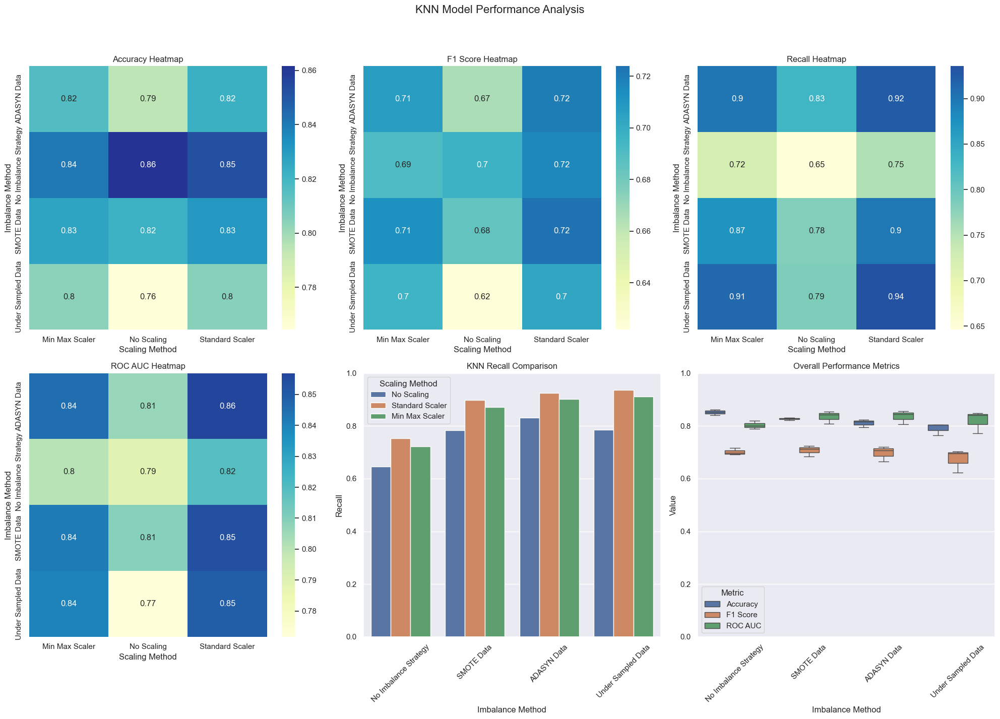


KNN Performance Summary:
                                       Accuracy  F1 Score    Recall   ROC AUC
Imbalance Method      Scaling Method                                         
ADASYN Data           Min Max Scaler   0.816394  0.707567  0.901292  0.844960
                      No Scaling       0.794108  0.665525  0.831150  0.806571
                      Standard Scaler  0.822739  0.719884  0.924218  0.856884
No Imbalance Strategy Min Max Scaler   0.840721  0.690835  0.722071  0.800798
                      No Scaling       0.861528  0.696928  0.646015  0.789014
                      Standard Scaler  0.852649  0.715891  0.753275  0.819212
SMOTE Data            Min Max Scaler   0.826999  0.713053  0.872180  0.842201
                      No Scaling       0.822336  0.684680  0.782660  0.808986
                      Standard Scaler  0.831080  0.723827  0.898199  0.853664
Under Sampled Data    Min Max Scaler   0.803502  0.695863  0.912118  0.840048
                      No Scaling      

In [197]:
visualize_model_performance(results,model_names[model_number])

In [229]:
data_frame = "ADASYN Data"
method = "Standard Scaler"
model_number = 0
model = KNeighborsClassifier(n_neighbors=3, # 5, 7, 10, 15, 20, 25
                            weights='uniform', # 
                            algorithm='auto', 
                            leaf_size=30, # 30, 40, 50, 60, 70, 80, 90, 100
                            p=2 # 1, 2
                            ) 

train_accuracy,test_metric, model = run_check_model(model, results, all_types_data, data_frame,method,model_names[model_number], importance=False)

Train Score :  0.02402678144428505
Test Score :  0.010022196811730666
Test F1 Score :  0.002158322337692309
Test ROC :  -0.007767616343407724
Test Recall :  -0.04284934497816595


In [ ]:
# set_save_results(KNN, model_names[model_number], data_frame, method, train_accuracy,test_metric, model, results)

<a id="5.2"></a>
## 5.2 Logistic Regression
<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#dfa8e4" data-toggle="popover">Content</a>

In [200]:
LR = {}
c=0
model_number = 3
for data_frame in all_types_data:
    for method in scalling_methods:
        print("Progress: {:.2f}%".format(100*(c)/(len(all_types_data)*len(scalling_methods))))
        c+=1
        print("Data Frame : {} , Scalling Method : {}".format(data_frame,method))
        model = LogisticRegression(class_weight="balanced", 
                                   solver='lbfgs', 
                                   max_iter=400,  # 100, 200, 300, 400, 500
                                   warm_start=True)
        
        train_accuracy,test_metric, model = run_model(model, all_types_data, data_frame,method, importance=False)
        set_save_results(LR, model_names[model_number], data_frame, method, train_accuracy,test_metric, model, results)
        print("---------------------------------------------------")


Progress: 0.00%
Data Frame : No Imbalance Strategy , Scalling Method : No Scaling
Train Score :  0.2464422642669767
Test Score :  0.24645187327638393
Test F1 Score :  0.39544546975338624
Test ROC :  0.5
Test Recall :  1.0
---------------------------------------------------
Progress: 8.33%
Data Frame : No Imbalance Strategy , Scalling Method : Standard Scaler
Train Score :  0.5576492519386177
Test Score :  0.5579022891863411
Test F1 Score :  0.3741509553735796
Test ROC :  0.5506028111491762
Test Recall :  0.5362081513828238
---------------------------------------------------
Progress: 16.67%
Data Frame : No Imbalance Strategy , Scalling Method : Min Max Scaler
Train Score :  0.5456956442360357
Test Score :  0.5472298827380552
Test F1 Score :  0.37853142118544963
Test ROC :  0.5513577035601167
Test Recall :  0.5594978165938864
---------------------------------------------------
Progress: 25.00%
Data Frame : SMOTE Data , Scalling Method : No Scaling
Train Score :  0.5
Test Score :  0.2464

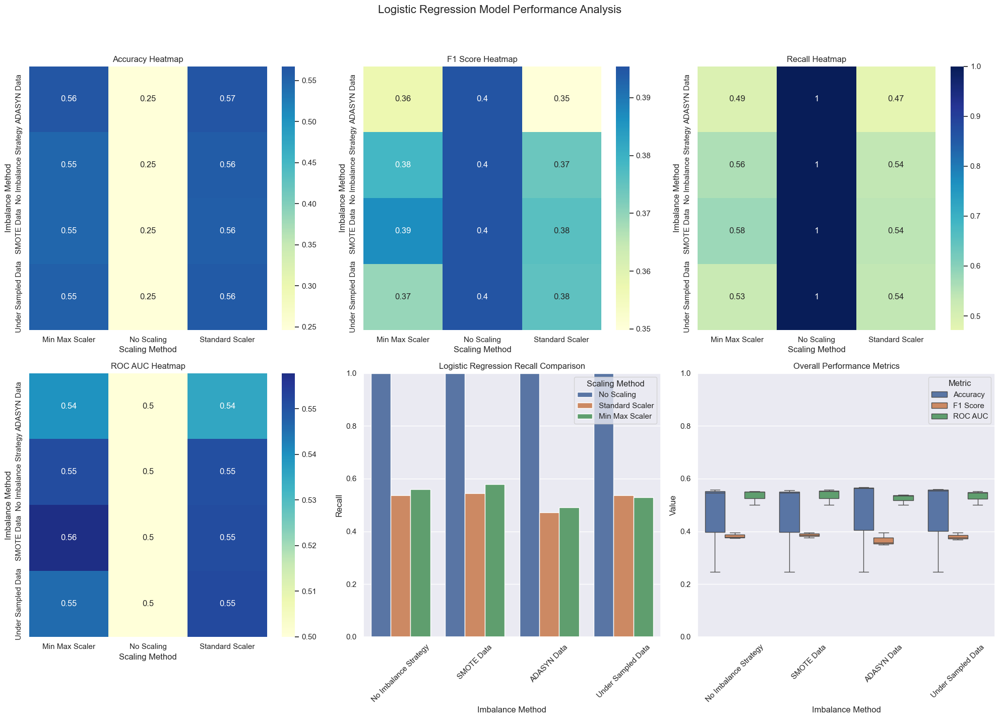


Logistic Regression Performance Summary:
                                       Accuracy  F1 Score    Recall   ROC AUC
Imbalance Method      Scaling Method                                         
ADASYN Data           Min Max Scaler   0.564046  0.357181  0.491448  0.539619
                      No Scaling       0.246452  0.395445  1.000000  0.500000
                      Standard Scaler  0.567409  0.349845  0.472253  0.535391
No Imbalance Strategy Min Max Scaler   0.547230  0.378531  0.559498  0.551358
                      No Scaling       0.246452  0.395445  1.000000  0.500000
                      Standard Scaler  0.557902  0.374151  0.536208  0.550603
SMOTE Data            Min Max Scaler   0.546916  0.386558  0.579239  0.557792
                      No Scaling       0.246452  0.395445  1.000000  0.500000
                      Standard Scaler  0.555100  0.376144  0.544214  0.551437
Under Sampled Data    Min Max Scaler   0.554427  0.369291  0.529294  0.545970
                      

In [201]:
visualize_model_performance(results,model_names[model_number])

In [231]:
data_frame = "SMOTE Data"
method = "Min Max Scaler"
model_number = 3

model = LogisticRegression(penalty='l2', # 'l1', 'l2', 'elasticnet
                            dual=False,
                            tol=1e-4,
                            C=1.0,
                            fit_intercept=True,
                            intercept_scaling=1,
                            class_weight="balanced", # 'balanced', None
                            solver='liblinear', # 'newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'
                            max_iter=100,
                            multi_class='auto',
                            verbose=0,
                            warm_start=False)

train_accuracy,test_metric, model = run_check_model(model, results, all_types_data, data_frame,method,model_names[model_number], importance=False)


C:\Users\Stude\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Train Score :  0.00030603657137029394
Test Score :  -0.00020178919755153846
Test F1 Score :  0.0003781563889504458
Test ROC :  0.00026404587121287015
Test Recall :  0.0011826783114992079


In [ ]:
# set_save_results(LR, model_names[model_number], data_frame, method, train_accuracy,test_metric, model, results)

<a id="5.3"></a>
## 5.3 Neural Networks 
<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#dfa8e4" data-toggle="popover">Content</a>

In [204]:
MLP = {}
model_number = 4
c=0
for data_frame in all_types_data:
    for method in scalling_methods:
        print("Progress: {:.2f}%".format(100*(c)/(len(all_types_data)*len(scalling_methods))))
        c+=1
        print("Data Frame : {} , Scalling Method : {}".format(data_frame,method))
        model = MLPClassifier(hidden_layer_sizes=(64, ), # (64,32 ), (32, 16), (128, 64, 32)
                               activation='relu', 
                                 solver='adam', # 'lbfgs', 'sgd', 'adam'
                                alpha=0.0001,
                                batch_size='auto',
                                learning_rate='constant', # 'constant', 'invscaling', 'adaptive'
                                learning_rate_init=0.001,
                                power_t=0.5,
                                max_iter=200,
                                shuffle=True,
                                random_state=42,
                                n_iter_no_change=10)
        train_accuracy,test_metric, model = run_model(model, all_types_data, data_frame,method, importance=False)
        set_save_results(MLP, model_names[model_number], data_frame, method, train_accuracy,test_metric, model, results)
        print("---------------------------------------------------")


Progress: 0.00%
Data Frame : No Imbalance Strategy , Scalling Method : No Scaling


C:\Users\Stude\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Train Score :  0.7535577357330233
Test Score :  0.753548126723616
Test F1 Score :  0.0
Test ROC :  0.5
Test Recall :  0.0
---------------------------------------------------
Progress: 8.33%
Data Frame : No Imbalance Strategy , Scalling Method : Standard Scaler


C:\Users\Stude\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Train Score :  0.9153830631600188
Test Score :  0.910069280957826
Test F1 Score :  0.8293699749010933
Test ROC :  0.9022488225432442
Test Recall :  0.8868267831149927
---------------------------------------------------
Progress: 16.67%
Data Frame : No Imbalance Strategy , Scalling Method : Min Max Scaler


C:\Users\Stude\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Train Score :  0.869394344137063
Test Score :  0.8665276563305756
Test F1 Score :  0.7635540374151011
Test ROC :  0.8691947019545736
Test Recall :  0.8744541484716157
---------------------------------------------------
Progress: 25.00%
Data Frame : SMOTE Data , Scalling Method : No Scaling


C:\Users\Stude\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Train Score :  0.5
Test Score :  0.753548126723616
Test F1 Score :  0.0
Test ROC :  0.5
Test Recall :  0.0
---------------------------------------------------
Progress: 33.33%
Data Frame : SMOTE Data , Scalling Method : Standard Scaler


C:\Users\Stude\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Train Score :  0.9303384254418403
Test Score :  0.9003833994753481
Test F1 Score :  0.8257852017409717
Test ROC :  0.9197595086235089
Test Recall :  0.9579694323144105
---------------------------------------------------
Progress: 41.67%
Data Frame : SMOTE Data , Scalling Method : Min Max Scaler


C:\Users\Stude\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Train Score :  0.8964257478768712
Test Score :  0.8572453532432008
Test F1 Score :  0.766904631155043
Test ROC :  0.889422026240372
Test Recall :  0.9528748180494906
---------------------------------------------------
Progress: 50.00%
Data Frame : ADASYN Data , Scalling Method : No Scaling


C:\Users\Stude\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Train Score :  0.5009485969069992
Test Score :  0.753548126723616
Test F1 Score :  0.0
Test ROC :  0.5
Test Recall :  0.0
---------------------------------------------------
Progress: 58.33%
Data Frame : ADASYN Data , Scalling Method : Standard Scaler


C:\Users\Stude\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Train Score :  0.9226271321536744
Test Score :  0.8939261451536961
Test F1 Score :  0.8189090909090909
Test ROC :  0.9205869221906016
Test Recall :  0.9731622998544396
---------------------------------------------------
Progress: 66.67%
Data Frame : ADASYN Data , Scalling Method : Min Max Scaler


C:\Users\Stude\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Train Score :  0.8871140408359232
Test Score :  0.8550929351359835
Test F1 Score :  0.7661637541155614
Test ROC :  0.8914834525894434
Test Recall :  0.9632459970887919
---------------------------------------------------
Progress: 75.00%
Data Frame : Under Sampled Data , Scalling Method : No Scaling
Train Score :  0.5
Test Score :  0.24645187327638393
Test F1 Score :  0.39544546975338624
Test ROC :  0.5
Test Recall :  1.0
---------------------------------------------------
Progress: 83.33%
Data Frame : Under Sampled Data , Scalling Method : Standard Scaler


C:\Users\Stude\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Train Score :  0.9188209147268687
Test Score :  0.8822896347615524
Test F1 Score :  0.8031496062992126
Test ROC :  0.9132637146475503
Test Recall :  0.9743449781659389
---------------------------------------------------
Progress: 91.67%
Data Frame : Under Sampled Data , Scalling Method : Min Max Scaler


C:\Users\Stude\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Train Score :  0.867703825008773
Test Score :  0.823479294186229
Test F1 Score :  0.7263944396177238
Test ROC :  0.8663132680396873
Test Recall :  0.9507823871906841
---------------------------------------------------


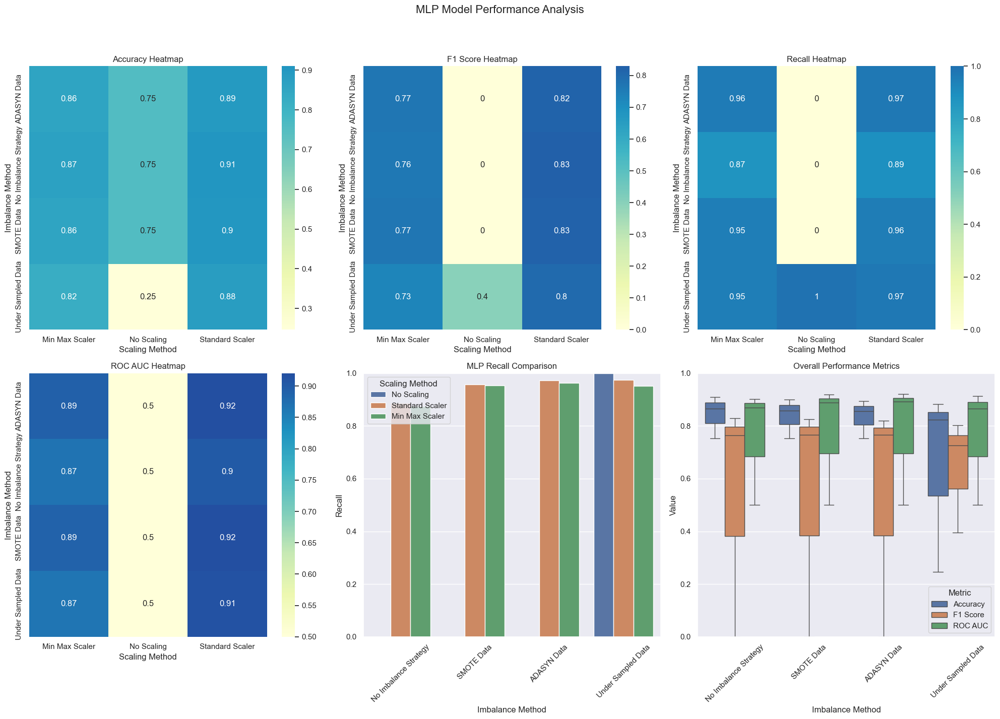


MLP Performance Summary:
                                       Accuracy  F1 Score    Recall   ROC AUC
Imbalance Method      Scaling Method                                         
ADASYN Data           Min Max Scaler   0.855093  0.766164  0.963246  0.891483
                      No Scaling       0.753548  0.000000  0.000000  0.500000
                      Standard Scaler  0.893926  0.818909  0.973162  0.920587
No Imbalance Strategy Min Max Scaler   0.866528  0.763554  0.874454  0.869195
                      No Scaling       0.753548  0.000000  0.000000  0.500000
                      Standard Scaler  0.910069  0.829370  0.886827  0.902249
SMOTE Data            Min Max Scaler   0.857245  0.766905  0.952875  0.889422
                      No Scaling       0.753548  0.000000  0.000000  0.500000
                      Standard Scaler  0.900383  0.825785  0.957969  0.919760
Under Sampled Data    Min Max Scaler   0.823479  0.726394  0.950782  0.866313
                      No Scaling      

In [205]:
visualize_model_performance(results,model_names[model_number])

In [233]:
data_frame = "ADASYN Data"
method = "Standard Scaler"
model_number = 4
model = MLPClassifier(hidden_layer_sizes=(64,32,16 ), # (64,32 ), (32, 16), (128, 64, 32)
                                 activation='relu', #
                                    solver='sgd', # 'lbfgs', 'sgd', 'adam'
                                  alpha=0.0001,
                                  batch_size='auto',
                                  learning_rate='adaptive', # 'constant', 'invscaling', 'adaptive'
                                  learning_rate_init=0.001,
                                  power_t=0.5,
                                  max_iter=200,
                                  shuffle=True,
                                  random_state=42,
                                  tol=0.0001,
                                  verbose=False,
                                  warm_start=False,
                                  momentum=0.9,
                                  nesterovs_momentum=True,
                                  early_stopping=False,
                                  validation_fraction=0.1,
                                  beta_1=0.9,
                                  beta_2=0.999,
                                  epsilon=1e-08,
                                  n_iter_no_change=10,
                                  max_fun=15000)

train_accuracy,test_metric, model = run_check_model(model, results, all_types_data, data_frame,method, model_names[model_number], importance=False)


C:\Users\Stude\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Train Score :  0.013097401562250921
Test Score :  0.017757449384543045
Test F1 Score :  0.025651107978088006
Test ROC :  0.011905000882873384
Test Recall :  0.0003639010189228076


In [ ]:
# set_save_results(MLP, model_names[model_number], data_frame, method, train_accuracy,test_metric, model, results)

<a id="5.4"></a>
## 5.4 Decision Tree  
<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#dfa8e4" data-toggle="popover">Content</a>

In [208]:
Decision_Tree = {}
c=0
model_number = 1
for data_frame in all_types_data:
    for method in scalling_methods:
        print("Progress: {:.2f}%".format(100*(c)/(len(all_types_data)*len(scalling_methods))))
        c+=1
        print("Data Frame : {} , Scalling Method : {}".format(data_frame,method))
        model = DecisionTreeClassifier(criterion='gini', # 'gini', 'entropy'
                                       min_samples_split=2, 
                                       min_samples_leaf=1, 
                                       random_state=43,  
                                       class_weight="balanced")
        train_accuracy,test_metric, model = run_model(model, all_types_data, data_frame,method, importance=False)
        set_save_results(Decision_Tree, model_names[model_number], data_frame, method, train_accuracy,test_metric, model, results)
        print("---------------------------------------------------")

Progress: 0.00%
Data Frame : No Imbalance Strategy , Scalling Method : No Scaling
Train Score :  1.0
Test Score :  0.9287908342862268
Test F1 Score :  0.8557281729808304
Test ROC :  0.9046001832855386
Test Recall :  0.8568959243085881
---------------------------------------------------
Progress: 8.33%
Data Frame : No Imbalance Strategy , Scalling Method : Standard Scaler
Train Score :  1.0
Test Score :  0.928319992825273
Test F1 Score :  0.8549126389834354
Test ROC :  0.9042877669684807
Test Recall :  0.8568959243085881
---------------------------------------------------
Progress: 16.67%
Data Frame : No Imbalance Strategy , Scalling Method : Min Max Scaler
Train Score :  1.0
Test Score :  0.9284769399789242
Test F1 Score :  0.8551448551448552
Test ROC :  0.9043000737611742
Test Recall :  0.8566229985443959
---------------------------------------------------
Progress: 25.00%
Data Frame : SMOTE Data , Scalling Method : No Scaling
Train Score :  1.0
Test Score :  0.9100020178919755
Test F

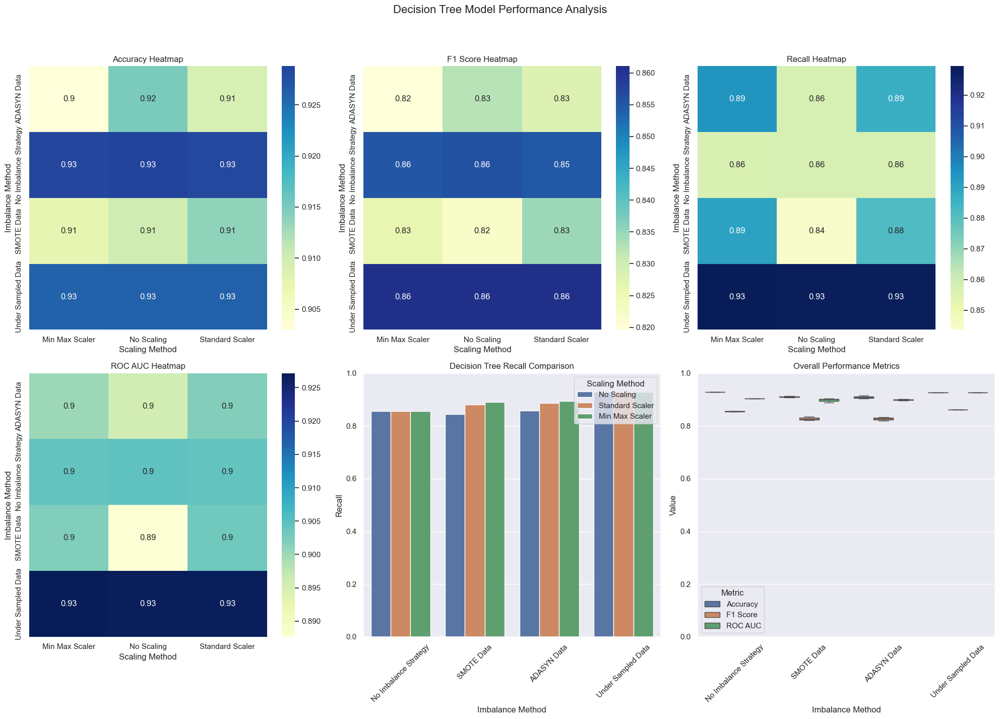


Decision Tree Performance Summary:
                                       Accuracy  F1 Score    Recall   ROC AUC
Imbalance Method      Scaling Method                                         
ADASYN Data           Min Max Scaler   0.902984  0.819626  0.894378  0.900088
                      No Scaling       0.915024  0.832553  0.857169  0.895558
                      Standard Scaler  0.909285  0.828137  0.886827  0.901728
No Imbalance Strategy Min Max Scaler   0.928477  0.855145  0.856623  0.904300
                      No Scaling       0.928791  0.855728  0.856896  0.904600
                      Standard Scaler  0.928320  0.854913  0.856896  0.904288
SMOTE Data            Min Max Scaler   0.907648  0.826210  0.890739  0.901958
                      No Scaling       0.910002  0.822074  0.843614  0.887664
                      Standard Scaler  0.913948  0.834726  0.881732  0.903108
Under Sampled Data    Min Max Scaler   0.926033  0.860984  0.929403  0.927167
                      No Sca

In [209]:
visualize_model_performance(results,model_name=model_names[model_number])

In [235]:
data_frame = "Under Sampled Data"
method = "Min Max Scaler"
model_number = 1
model = DecisionTreeClassifier(criterion='entropy', 
                                splitter='best', 
                                min_samples_split=2, 
                                min_samples_leaf=1, 
                                min_weight_fraction_leaf=0.0, 
                                random_state=10, 
                                min_impurity_decrease=0.0, 
                                class_weight="balanced")

train_accuracy,test_metric, model = run_check_model(model, results, all_types_data, data_frame,method, model_names[model_number], importance=True)

Train Score :  0.0
Test Score :  0.0021972601511176526
Test F1 Score :  0.004435858302388129
Test ROC :  0.0037843529643037943
Test Recall :  0.006914119359534121
Feature Importance :  [5.36876664e-01 8.34778360e-02 2.16524639e-02 3.09179145e-02
 7.83334786e-02 3.03592037e-02 2.04001882e-01 1.71256443e-03
 2.42217127e-03 3.18474202e-03 3.27184732e-03 2.58189921e-03
 1.48981832e-04 1.05835146e-03]


In [ ]:
# set_save_results(Decision_Tree, model_names[model_number], data_frame, method, train_accuracy,test_metric, model, results)

<a id="5.5"></a>
## 5.5 Random Forest  
<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#dfa8e4" data-toggle="popover">Content</a>

In [ ]:
RF = {}
c= 0
model_number = 2
for data_frame in all_types_data:
    for method in scalling_methods:
        print("Progress: {:.2f}%".format(100*(c)/(len(all_types_data)*len(scalling_methods))))
        c+=1
        print("Data Frame : {} , Scalling Method : {}".format(data_frame,method))
        model = RandomForestClassifier(n_estimators=200, 
                                       criterion='entropy', #gini
                                       min_samples_split=2, 
                                       min_samples_leaf=1, 
                                       min_weight_fraction_leaf=0.0,  
                                       min_impurity_decrease=0.0, 
                                       bootstrap=True, 
                                       random_state=42, 
                                       verbose=0, 
                                       warm_start=False, 
                                       class_weight="balanced", 
                                       ccp_alpha=0.0)
        train_accuracy,test_metric, model = run_model(model, all_types_data, data_frame,method, importance=False)
        set_save_results(RF, model_names[model_number], data_frame, method, train_accuracy,test_metric, model, results)
        print("---------------------------------------------------")

Progress: 0.00%
Data Frame : No Imbalance Strategy , Scalling Method : No Scaling
Train Score :  1.0
Test Score :  0.9310329364812449
Test F1 Score :  0.8619017688785131
Test ROC :  0.9115977988129871
Test Recall :  0.8732714701601164
---------------------------------------------------
Progress: 8.33%
Data Frame : No Imbalance Strategy , Scalling Method : Standard Scaler
Train Score :  1.0
Test Score :  0.9315934620299994
Test F1 Score :  0.8629072118625029
Test ROC :  0.9120615549796198
Test Recall :  0.8735443959243085
---------------------------------------------------
Progress: 16.67%
Data Frame : No Imbalance Strategy , Scalling Method : Min Max Scaler
Train Score :  1.0
Test Score :  0.9313916728324477
Test F1 Score :  0.862533692722372
Test ROC :  0.9118664409525364
Test Recall :  0.8733624454148472
---------------------------------------------------
Progress: 25.00%
Data Frame : SMOTE Data , Scalling Method : No Scaling
Train Score :  1.0
Test Score :  0.9213246339768166
Test F

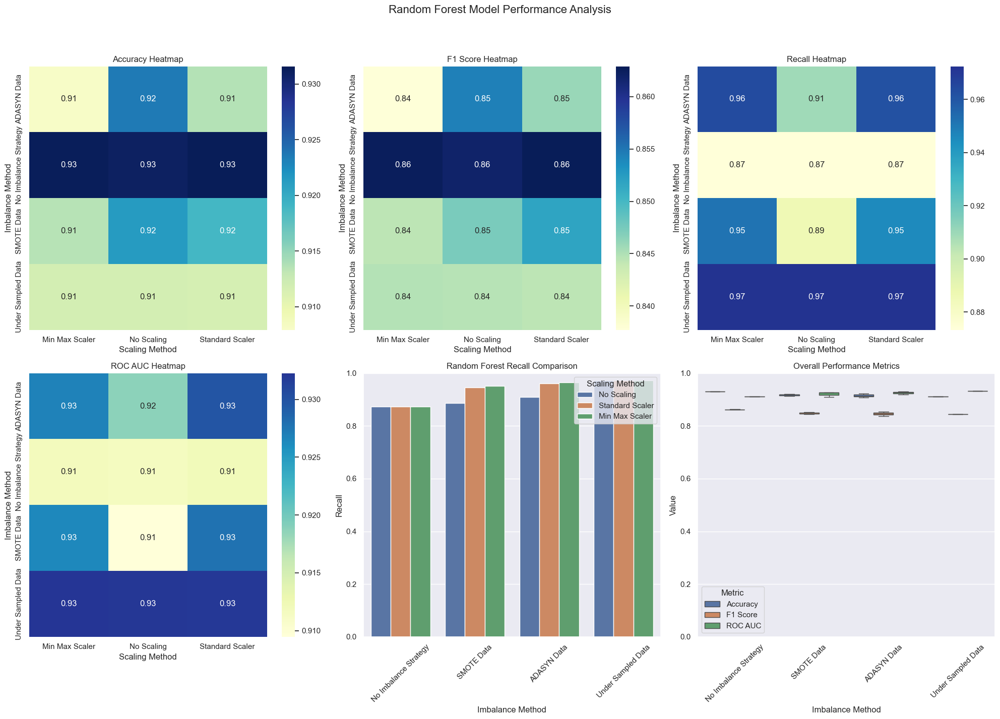


Random Forest Performance Summary:
                                       Accuracy  F1 Score    Recall   ROC AUC
Imbalance Method      Scaling Method                                         
ADASYN Data           Min Max Scaler   0.907939  0.837720  0.964156  0.926855
                      No Scaling       0.923634  0.854395  0.909116  0.918749
                      Standard Scaler  0.913657  0.845929  0.961790  0.929852
No Imbalance Strategy Min Max Scaler   0.931392  0.862534  0.873362  0.911866
                      No Scaling       0.931033  0.861902  0.873271  0.911598
                      Standard Scaler  0.931593  0.862907  0.873544  0.912062
SMOTE Data            Min Max Scaler   0.913522  0.844369  0.951874  0.926426
                      No Scaling       0.921325  0.847362  0.886099  0.909472
                      Standard Scaler  0.918881  0.851733  0.945415  0.927809
Under Sampled Data    Min Max Scaler   0.911885  0.844713  0.972434  0.932258
                      No Sca

In [213]:
visualize_model_performance(results,model_names[model_number])

In [237]:
data_frame = "No Imbalance Strategy"
method = "Standard Scaler"
model_number = 2
model = RandomForestClassifier(n_estimators=300, 
                            criterion='entropy', 
                            min_samples_split=2, 
                            min_samples_leaf=1, 
                            min_weight_fraction_leaf=0.0, 
                            min_impurity_decrease=0.0, 
                            bootstrap=False, # True, False
                            max_features=6, # 6, 8, 10, 12, 14, 16
                            oob_score=False, 
                            random_state=1, 
                            warm_start=False, 
                            class_weight="balanced")

train_accuracy,test_metric, model = run_check_model(model, results, all_types_data, data_frame,method, model_names[model_number], importance=True)


Train Score :  0.0
Test Score :  0.016927871572386177
Test F1 Score :  0.034638526647091106
Test ROC :  0.02515996069492199
Test Recall :  0.04139374090247461
Feature Importance :  [5.31738656e-01 7.65760082e-02 5.64097914e-02 3.30844874e-02
 8.98938722e-02 4.77540305e-02 1.46428203e-01 2.34701440e-03
 3.07865490e-03 3.55549741e-03 4.18088833e-03 3.03291135e-03
 2.64180411e-04 1.65580428e-03]


In [ ]:
# set_save_results(RF, model_names[model_number], data_frame, method, train_accuracy,test_metric, model, results)

<a id="5.6"></a>
## 5.6 XGBoost   
<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#dfa8e4" data-toggle="popover">Content</a>

In [216]:
XGB = {}
c=0
model_number = 5
for data_frame in all_types_data:
    for method in scalling_methods:
        print("Progress: {:.2f}%".format(100*(c)/(len(all_types_data)*len(scalling_methods))))
        c+=1
        print("Data Frame : {} , Scalling Method : {}".format(data_frame,method))
        class_counts = all_types_data[data_frame][method]["y_train"].value_counts()
        num_negative = class_counts[0]
        num_positive = class_counts[1]
        scale_pos_weight = num_negative / num_positive
        model = XGBClassifier(scale_pos_weight=scale_pos_weight, 
                              n_estimators=100, 
                              max_depth=3)
        train_accuracy,test_metric, model = run_model(model, all_types_data, data_frame,method, importance=False)
        set_save_results(XGB, model_names[model_number], data_frame, method, train_accuracy,test_metric, model, results)
        print("---------------------------------------------------")

Progress: 0.00%
Data Frame : No Imbalance Strategy , Scalling Method : No Scaling
Train Score :  0.9156040703763849
Test Score :  0.9125804354162462
Test F1 Score :  0.8456391781147314
Test ROC :  0.9324441779150183
Test Recall :  0.9716157205240175
---------------------------------------------------
Progress: 8.33%
Data Frame : No Imbalance Strategy , Scalling Method : Standard Scaler
Train Score :  0.9156040703763849
Test Score :  0.9125804354162462
Test F1 Score :  0.8456391781147314
Test ROC :  0.9324441779150183
Test Recall :  0.9716157205240175
---------------------------------------------------
Progress: 16.67%
Data Frame : No Imbalance Strategy , Scalling Method : Min Max Scaler
Train Score :  0.9156040703763849
Test Score :  0.9125804354162462
Test F1 Score :  0.8456391781147314
Test ROC :  0.9324441779150183
Test Recall :  0.9716157205240175
---------------------------------------------------
Progress: 25.00%
Data Frame : SMOTE Data , Scalling Method : No Scaling
Train Score 

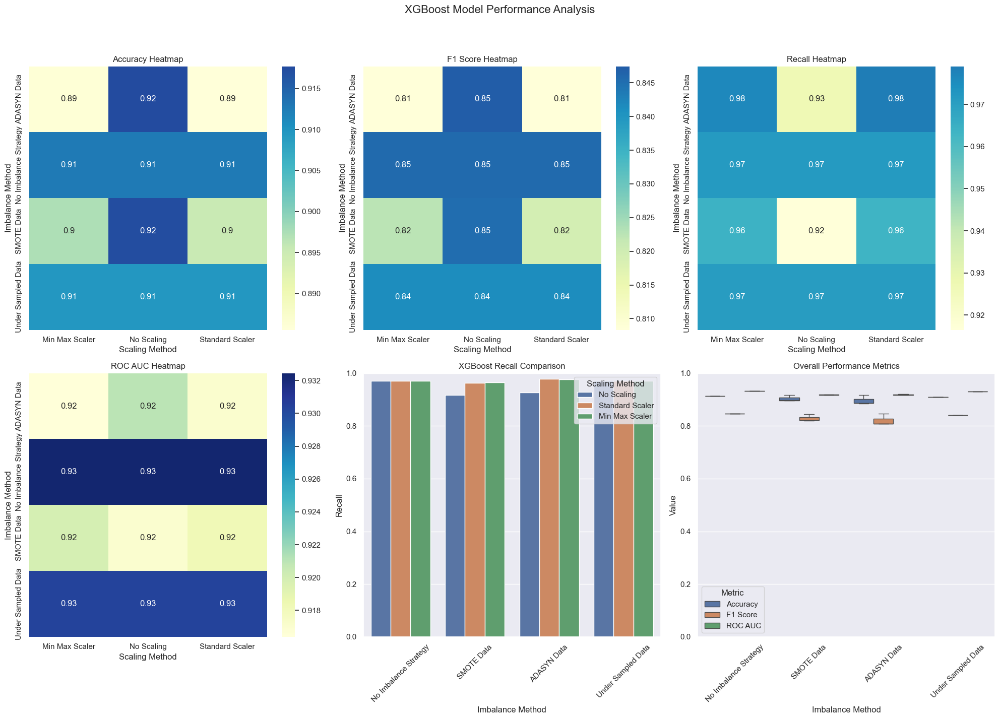


XGBoost Performance Summary:
                                       Accuracy  F1 Score    Recall   ROC AUC
Imbalance Method      Scaling Method                                         
ADASYN Data           Min Max Scaler   0.886034  0.808514  0.976255  0.916391
                      No Scaling       0.917715  0.847452  0.927402  0.920974
                      Standard Scaler  0.885586  0.808352  0.979076  0.917042
No Imbalance Strategy Min Max Scaler   0.912580  0.845639  0.971616  0.932444
                      No Scaling       0.912580  0.845639  0.971616  0.932444
                      Standard Scaler  0.912580  0.845639  0.971616  0.932444
SMOTE Data            Min Max Scaler   0.897357  0.822407  0.964338  0.919894
                      No Scaling       0.917244  0.845170  0.916485  0.916989
                      Standard Scaler  0.895339  0.819392  0.963337  0.918218
Under Sampled Data    Min Max Scaler   0.909666  0.841234  0.971070  0.930327
                      No Scaling  

In [217]:
visualize_model_performance(results,model_names[model_number])

In [240]:
data_frame = "ADASYN Data"
method = "No Scaling"
class_counts = all_types_data[data_frame][method]["y_train"].value_counts()
num_negative = class_counts[0]
num_positive = class_counts[1]
scale_pos_weight = num_negative / num_positive
model_number = 5
model = XGBClassifier(learning_rate=0.01, 
                              n_estimators=300, 
                              max_depth=5, 
                              min_child_weight=1, 
                              gamma=1, 
                              subsample=1, 
                              colsample_bytree=1, 
                              objective='binary:logistic', 
                              nthread=1, 
                              scale_pos_weight=scale_pos_weight, 
                              seed=27, 
                              use_label_encoder=False)

train_accuracy,test_metric, model = run_check_model(model, results, all_types_data, data_frame,method, model_names[model_number], importance=True)


C:\Users\Stude\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\xgboost\core.py:158: UserWarning: [21:49:12] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Train Score :  -0.027531667805834603
Test Score :  -0.037420685634851236
Test F1 Score :  -0.04867311189005019
Test ROC :  -0.012493562788143842
Test Recall :  0.03666302765647744
Feature Importance :  [0.3666256  0.07294668 0.00884889 0.00123141 0.01233222 0.0261174
 0.08496314 0.0090125  0.14116941 0.11024647 0.07803781 0.0798834
 0.         0.008585  ]


In [219]:
# set_save_results(XGB, model_names[model_number], data_frame, method, train_accuracy,test_metric, model, results)

<a id="5.7"></a>
## 5.7 LightGBM   
<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#dfa8e4" data-toggle="popover">Content</a>

In [220]:
LGBM = {}
model_number = 6
for data_frame in all_types_data:
    for method in scalling_methods:
        print("Model: {}".format(model_names[model_number]))
        print("Data Frame : {} , Scalling Method : {}".format(data_frame,method))
        model = LGBMClassifier(boosting_type='gbdt', 
                              class_weight='balanced')
        train_accuracy,test_metric, model = run_model(model, all_types_data, data_frame,method, importance=False)
        set_save_results(LGBM, model_names[model_number], data_frame, method, train_accuracy,test_metric, model, results)
        print("---------------------------------------------------")

Model: LightGBM
Data Frame : No Imbalance Strategy , Scalling Method : No Scaling
[LightGBM] [Info] Number of positive: 25647, number of negative: 78422
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000416 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1562
[LightGBM] [Info] Number of data points in the train set: 104069, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
Train Score :  0.9347067810779387
Test Score :  0.9291719916593798
Test F1 Score :  0.8719860598938283
Test ROC :  0.9458713759804669
Test Recall :  0.9788027656477438
---------------------------------------------------
Model: LightGBM
Data Frame : No Imbalance Strategy , Scalling Method : Standard Scaler
[LightGBM] [Info] Number of positive: 25647, number of

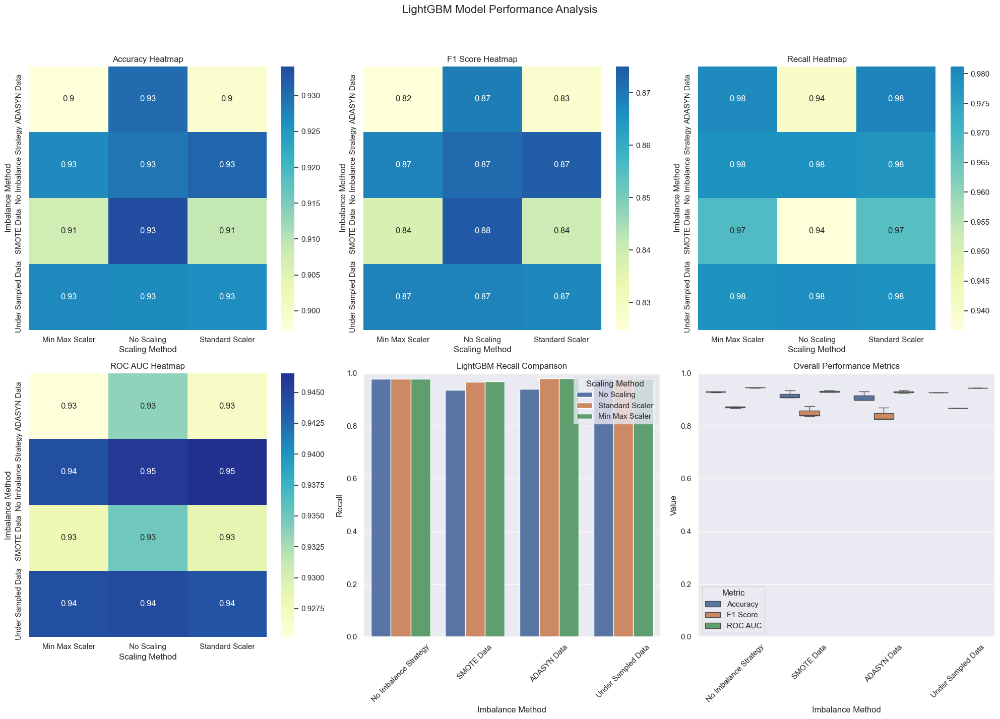


LightGBM Performance Summary:
                                       Accuracy  F1 Score    Recall   ROC AUC
Imbalance Method      Scaling Method                                         
ADASYN Data           Min Max Scaler   0.897357  0.824772  0.980167  0.925220
                      No Scaling       0.930159  0.869057  0.940411  0.933608
                      Standard Scaler  0.899128  0.827433  0.981259  0.926763
No Imbalance Strategy Min Max Scaler   0.926863  0.868330  0.978530  0.944247
                      No Scaling       0.929172  0.871986  0.978803  0.945871
                      Standard Scaler  0.930652  0.874222  0.977893  0.946547
SMOTE Data            Min Max Scaler   0.907401  0.837555  0.968614  0.927997
                      No Scaling       0.934082  0.875074  0.936772  0.934987
                      Standard Scaler  0.909172  0.840014  0.967522  0.928805
Under Sampled Data    Min Max Scaler   0.926818  0.868270  0.978621  0.944248
                      No Scaling 

In [221]:
visualize_model_performance(results,model_names[model_number])

In [242]:
data_frame = "SMOTE Data"
method = "No Scaling"
model_number = 6
model = LGBMClassifier(boosting_type='gbdt',
                        class_weight='balanced',
                        objective='binary',
                        random_state=42,
                        n_estimators=200,
                        learning_rate=0.01,
                        max_depth=4)

train_accuracy,test_metric, model = run_check_model(model, results, all_types_data, data_frame,method, model_names[model_number], importance=True)

[LightGBM] [Info] Number of positive: 78422, number of negative: 78422
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004531 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3569
[LightGBM] [Info] Number of data points in the train set: 156844, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

In [223]:
# set_save_results(LGBM, model_names[model_number], data_frame, method, train_accuracy,test_metric, model, results)

<a id="5.8"></a>
## 5.8 CatBoost   
<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#dfa8e4" data-toggle="popover">Content</a>

In [224]:
CatBoost = {}
model_number = 7
for data_frame in all_types_data:
    for method in scalling_methods:
        print("Model: {}".format(model_names[model_number]))
        print("Data Frame : {} , Scalling Method : {}".format(data_frame,method))
        model = CatBoostClassifier(iterations=100,
                              learning_rate=0.01,
                              depth=6,
                              loss_function='Logloss',
                              verbose=True)
        train_accuracy,test_metric, model = run_model(model, all_types_data, data_frame,method, importance=False)
        set_save_results(CatBoost, model_names[model_number], data_frame, method, train_accuracy,test_metric, model, results)
        print("---------------------------------------------------")

Model: CatBoost
Data Frame : No Imbalance Strategy , Scalling Method : No Scaling
0:	learn: 0.6868906	total: 132ms	remaining: 13.1s
1:	learn: 0.6807148	total: 136ms	remaining: 6.67s
2:	learn: 0.6746029	total: 142ms	remaining: 4.58s
3:	learn: 0.6687410	total: 146ms	remaining: 3.5s
4:	learn: 0.6628581	total: 150ms	remaining: 2.85s
5:	learn: 0.6574540	total: 155ms	remaining: 2.42s
6:	learn: 0.6520890	total: 159ms	remaining: 2.11s
7:	learn: 0.6465777	total: 163ms	remaining: 1.87s
8:	learn: 0.6412201	total: 167ms	remaining: 1.69s
9:	learn: 0.6359590	total: 171ms	remaining: 1.54s
10:	learn: 0.6308650	total: 175ms	remaining: 1.41s
11:	learn: 0.6257723	total: 178ms	remaining: 1.31s
12:	learn: 0.6208030	total: 182ms	remaining: 1.22s
13:	learn: 0.6159256	total: 186ms	remaining: 1.14s
14:	learn: 0.6111175	total: 190ms	remaining: 1.07s
15:	learn: 0.6063330	total: 194ms	remaining: 1.02s
16:	learn: 0.6017254	total: 197ms	remaining: 964ms
17:	learn: 0.5971111	total: 201ms	remaining: 916ms
18:	learn: 

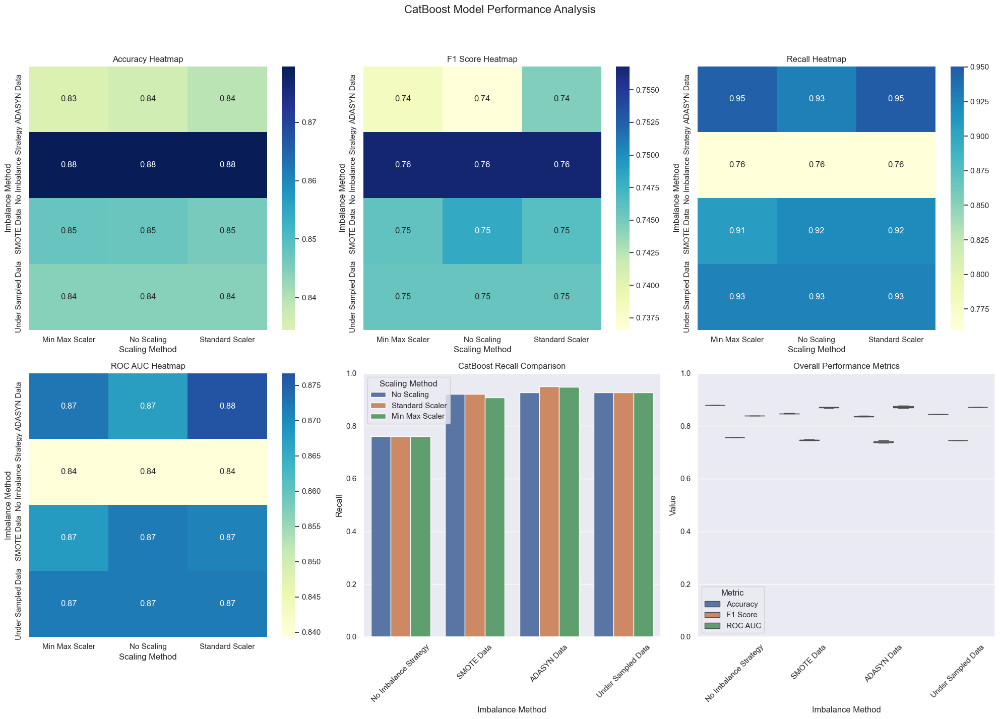


CatBoost Performance Summary:
                                       Accuracy  F1 Score    Recall   ROC AUC
Imbalance Method      Scaling Method                                         
ADASYN Data           Min Max Scaler   0.834443  0.738212  0.947143  0.872364
                      No Scaling       0.836461  0.736584  0.927766  0.867183
                      Standard Scaler  0.839309  0.744610  0.950509  0.876725
No Imbalance Strategy Min Max Scaler   0.879622  0.756806  0.760007  0.839375
                      No Scaling       0.879622  0.756806  0.760007  0.839375
                      Standard Scaler  0.879622  0.756806  0.760007  0.839375
SMOTE Data            Min Max Scaler   0.847582  0.745869  0.907569  0.867766
                      No Scaling       0.847358  0.748206  0.920215  0.871872
                      Standard Scaler  0.845721  0.746360  0.921033  0.871062
Under Sampled Data    Min Max Scaler   0.844286  0.745651  0.926128  0.871824
                      No Scaling 

In [225]:
visualize_model_performance(results,model_names[model_number])

In [243]:
data_frame = "No Imbalance Strategy"
method = "No Scaling"
model_number = 7
model = CatBoostClassifier(iterations=1000,
                              learning_rate=0.001,
                              depth=9,
                              loss_function='Logloss',
                              verbose=True)

train_accuracy,test_metric, model = run_check_model(model, results, all_types_data, data_frame,method, model_names[model_number], importance=True)

0:	learn: 0.6911702	total: 32.8ms	remaining: 32.7s
1:	learn: 0.6897120	total: 51.8ms	remaining: 25.9s
2:	learn: 0.6883056	total: 66.5ms	remaining: 22.1s
3:	learn: 0.6867660	total: 83.6ms	remaining: 20.8s
4:	learn: 0.6854089	total: 101ms	remaining: 20s
5:	learn: 0.6839639	total: 115ms	remaining: 19.1s
6:	learn: 0.6820139	total: 130ms	remaining: 18.4s
7:	learn: 0.6802240	total: 145ms	remaining: 18s
8:	learn: 0.6787249	total: 160ms	remaining: 17.6s
9:	learn: 0.6772643	total: 176ms	remaining: 17.4s
10:	learn: 0.6756223	total: 190ms	remaining: 17.1s
11:	learn: 0.6738932	total: 204ms	remaining: 16.8s
12:	learn: 0.6719921	total: 220ms	remaining: 16.7s
13:	learn: 0.6702909	total: 236ms	remaining: 16.6s
14:	learn: 0.6688837	total: 253ms	remaining: 16.6s
15:	learn: 0.6674909	total: 268ms	remaining: 16.5s
16:	learn: 0.6660603	total: 283ms	remaining: 16.3s
17:	learn: 0.6644021	total: 299ms	remaining: 16.3s
18:	learn: 0.6625396	total: 314ms	remaining: 16.2s
19:	learn: 0.6606960	total: 332ms	remaini

In [ ]:
# set_save_results(CatBoost, model_names[model_number], data_frame, method, train_accuracy,test_metric, model, results)

## 5.2 Model Comparisons
Compare the performance of different models.

In [245]:
results_backup = results.copy()

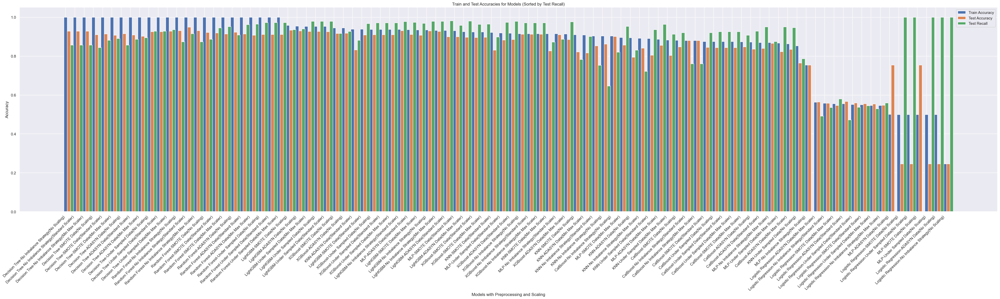

In [246]:
train_accuracies = []
test_accuracies = []
test_recalls = []
test_precisions = []
test_f1s = []
test_ROCs = []
x_labels = []

for model_name, models in results.items():
    for preprocess, imbalanced_strategies in models.items():
        for scaling, metrics in imbalanced_strategies.items():
                train_accuracy = metrics.get("Train", None)
                test_metrics = metrics.get("Test", None)
                test_accuracy = test_metrics.get("Accuracy", None) 
                test_recall = test_metrics.get("Recall", None) 
                test_precision = test_metrics.get("Precision", None) 
                test_f1 = test_metrics.get("F1 Score", None) 
                test_ROC = test_metrics.get("ROC", None) 

                if train_accuracy is not None and test_accuracy is not None:
                    x_labels.append(f"{model_name}-{preprocess}({scaling})")
                    train_accuracies.append(train_accuracy)
                    test_accuracies.append(test_accuracy)
                    test_recalls.append(test_recall)
                    test_ROCs.append(test_ROC)
                    test_precisions.append(test_precision)
                    test_f1s.append(test_f1)
                
               


data = list(zip(x_labels, train_accuracies, test_accuracies, test_recalls))
data_sorted = sorted(data, key=lambda x: x[1], reverse=True)
x_labels_sorted, train_accuracies_sorted, test_accuracies_sorted, test_recalls_sorted = zip(*data_sorted)

# Plotting
x = range(len(x_labels_sorted)) 
width = 0.35 

plt.figure(figsize=(40, 12))

plt.bar([pos for pos in x], train_accuracies_sorted, width, label='Train Accuracy')
plt.bar([pos + width for pos in x], test_accuracies_sorted, width, label='Test Accuracy')
plt.bar([pos + 2*width for pos in x], test_recalls_sorted, width, label='Test Recall')

plt.xlabel("Models with Preprocessing and Scaling")
plt.ylabel("Accuracy")
plt.title("Train and Test Accuracies for Models (Sorted by Test Recall)")
plt.xticks(ticks=x, labels=x_labels_sorted, rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()

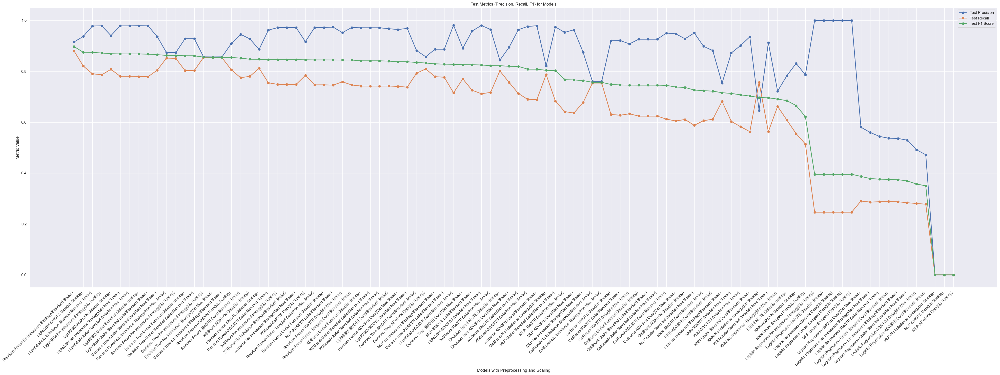

In [247]:
data = list(zip(x_labels, test_recalls, test_precisions, test_f1s))
data_sorted = sorted(data, key=lambda x: x[3], reverse=True)

x_labels_sorted, test_precisions_sorted, test_recalls_sorted, test_f1_scores_sorted = zip(*data_sorted)

x = range(len(x_labels_sorted)) 

plt.figure(figsize=(40, 15))
plt.plot(x, test_precisions_sorted, marker='o', label='Test Precision', linestyle='-', linewidth=2)
plt.plot(x, test_recalls_sorted, marker='o', label='Test Recall', linestyle='-', linewidth=2)
plt.plot(x, test_f1_scores_sorted, marker='o', label='Test F1 Score', linestyle='-', linewidth=2)

plt.xlabel("Models with Preprocessing and Scaling")
plt.ylabel("Metric Value")
plt.title("Test Metrics (Precision, Recall, F1) for Models")
plt.xticks(ticks=x, labels=x_labels_sorted, rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()

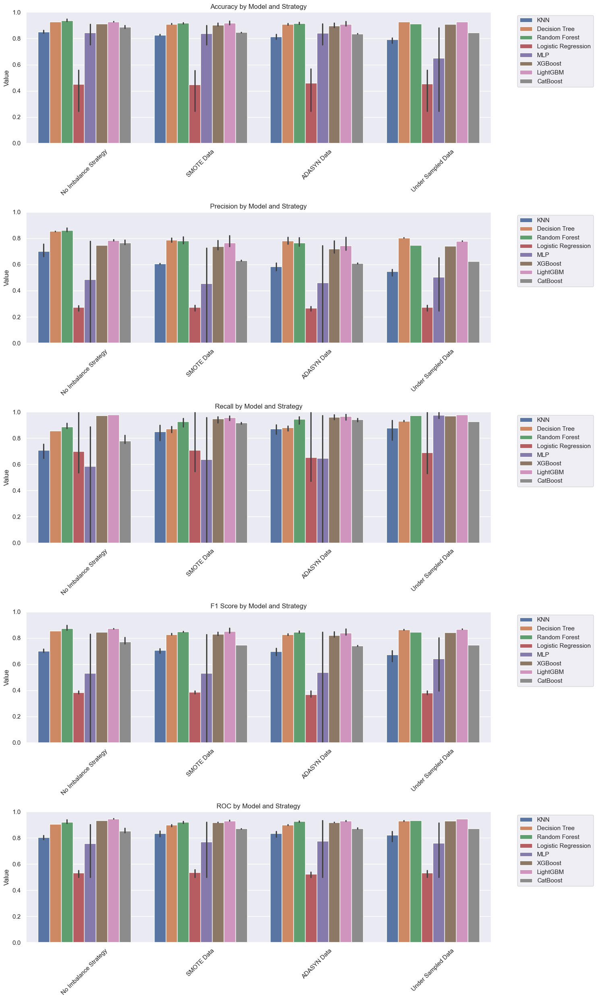

In [248]:
models = []
strategies = []
scalers = []
metrics = []
values = []

for model, model_data in results.items():
    for strategy, strategy_data in model_data.items():
        for scaler, scaler_data in strategy_data.items():
            for metric, value in scaler_data['Test'].items():
                if metric != 'Confusion Matrix':  # Skip confusion matrix
                    models.append(model)
                    strategies.append(strategy)
                    scalers.append(scaler)
                    metrics.append(metric)
                    values.append(value)

prepared_data = pd.DataFrame({
    'Model': models,
    'Strategy': strategies,
    'Scaler': scalers,
    'Metric': metrics,
    'Value': values
})
metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC']
    
fig, axes = plt.subplots(len(metrics), 1, figsize=(15, 5*len(metrics)))

for i, metric in enumerate(metrics):
    metric_data = prepared_data[prepared_data['Metric'] == metric]
    
    sb.barplot(
        data=metric_data,
        x='Strategy',
        y='Value',
        hue='Model',
        ax=axes[i]
    )
    
    axes[i].set_title(f'{metric} by Model and Strategy')
    axes[i].set_xlabel('')
    axes[i].tick_params(axis='x', rotation=45)
    axes[i].set_ylim(0, 1)
    axes[i].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
plt.tight_layout()

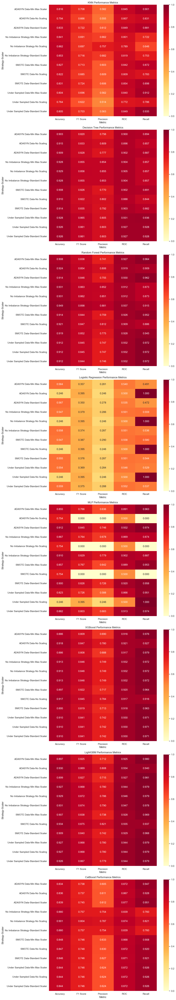

In [249]:
models = prepared_data['Model'].unique()
fig, axes = plt.subplots(len(models), 1, figsize=(12, 8*len(models)))
if len(models) == 1:
    axes = [axes]

for i, model in enumerate(models):
    model_data = prepared_data[prepared_data['Model'] == model]
    
    pivot_df = model_data.pivot_table(
        values='Value',
        index=['Strategy', 'Scaler'],
        columns='Metric'
    )
    
    sb.heatmap(
        pivot_df,
        annot=True,
        fmt='.3f',
        cmap='YlOrRd',
        center=0.5,
        vmin=0,
        vmax=1,
        ax=axes[i]
    )
    axes[i].set_title(f'{model} Performance Metrics')

plt.tight_layout()

## 5.3 Feature Importance & Double Checking For Fine-Tuning
Analyze and explain the most important features:

In [250]:
results["LightGBM"]["SMOTE Data"]["No Scaling"]["Test"]

{'Accuracy': 0.9340821954664693,
 'Precision': 0.8210014351778026,
 'Recall': 0.9367721979621543,
 'F1 Score': 0.8750743604997026,
 'Confusion Matrix': array([[31364,  2245],
        [  695, 10297]], dtype=int64),
 'ROC': 0.9349873069908363}

In [251]:
LGBM["SMOTE Data_No Scaling"].feature_importances_

array([936, 464,  65,  29, 498,  86, 670,  38,  49,  40,  59,  34,   7,
        25])

<Axes: title={'center': 'LightGBM Feature Importance'}, xlabel='Feature importance', ylabel='Features'>

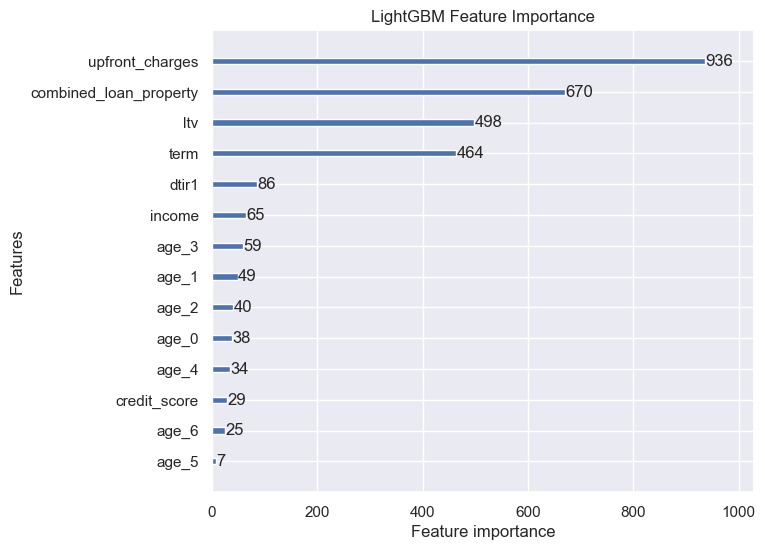

In [252]:
lgb.plot_importance(LGBM["SMOTE Data_No Scaling"], importance_type="auto", figsize=(7,6), title="LightGBM Feature Importance")

In [254]:
RF["Under Sampled Data_Standard Scaler"].feature_importances_

array([0.51477352, 0.05035455, 0.07565885, 0.05064579, 0.10383692,
       0.07033703, 0.11373099, 0.00292459, 0.00341543, 0.00393322,
       0.00430383, 0.00329488, 0.00059819, 0.00219222])

## 5.4 Final Model
Choose the best-performing model based on your evaluations and fine-tuning.

In [ ]:

param_grid = {
    'n_estimators': [150, 200, 250],  
    'criterion': ['entropy', 'gini'],  
    'max_depth': [25, 30, None],     
    'min_samples_split': [2, 3],     
    'min_samples_leaf': [1, 2],       
    'class_weight': ['balanced'],     
    'max_features': ['sqrt', 'log2'], 
    'bootstrap': [True, False],
}

scoring = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score),# average='weighted'),
    'recall': make_scorer(recall_score),# average='weighted'),
    'f1': make_scorer(f1_score),# average='weighted'),
    'roc_auc': make_scorer(roc_auc_score)# average='weighted', multi_class='ovr', needs_proba=True)
}

rf = RandomForestClassifier(
    random_state=42,
    n_jobs=-1,
    min_weight_fraction_leaf=0.0,
    min_impurity_decrease=0.0,
    ccp_alpha=0.0,
    oob_score=True 
)

grid_search = GridSearchCV(
    estimator=rf,
    param_grid=param_grid,
    cv=5,
    scoring=scoring,
    refit='f1',            # Refit on F1 since it balances precision and recall
    verbose=2,
    n_jobs=-1,
    return_train_score=True
)

grid_search.fit(all_types_data["No Imbalance Strategy"]["Standard Scaler"]["X_train"]
                ,all_types_data["No Imbalance Strategy"]["Standard Scaler"]["y_train"])


n_combinations = np.prod([len(v) for v in param_grid.values()])
print(f"Total parameter combinations to be tested: {n_combinations}")

Fitting 5 folds for each of 288 candidates, totalling 1440 fits


C:\Users\Stude\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
720 fits failed out of a total of 1440.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
720 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Stude\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Stude\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-

Total parameter combinations to be tested: 288


In [271]:
cvres = grid_search.cv_results_

for mean_score, params in zip(cvres["mean_test_accuracy"], cvres["params"]):
    print(mean_score, params)

0.9325889554045874 {'bootstrap': True, 'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 25, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 150}
0.9326494921638527 {'bootstrap': True, 'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 25, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
0.932669671083608 {'bootstrap': True, 'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 25, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 250}
0.932427524046546 {'bootstrap': True, 'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 25, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 150}
0.9326293132440977 {'bootstrap': True, 'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 25, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 200}
0.

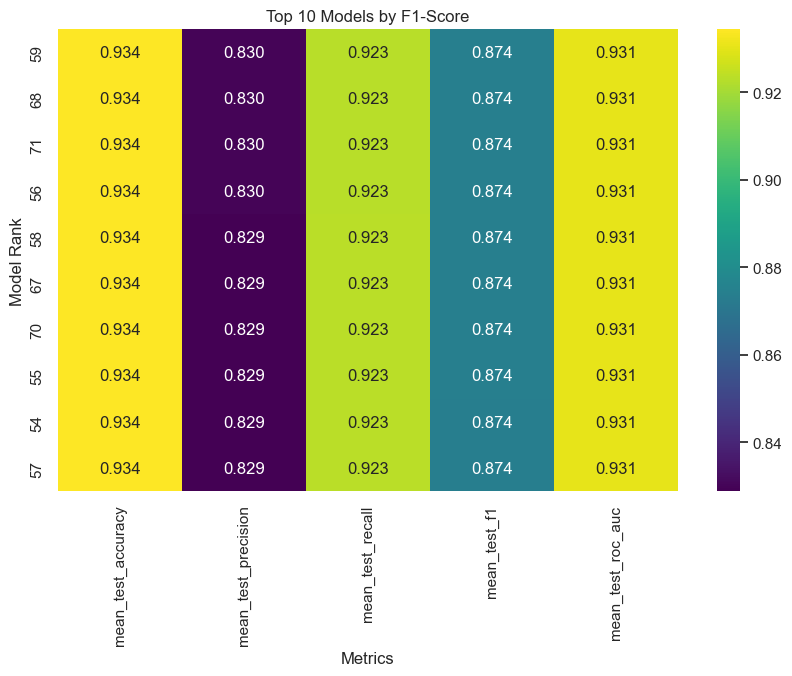

In [ ]:
results_ = pd.DataFrame(grid_search.cv_results_)
results_ = results_.sort_values(by='mean_test_f1', ascending=False)

top_10_models = results_.head(10)

heatmap_data = top_10_models[['mean_test_accuracy', 'mean_test_precision', 
                             'mean_test_recall', 'mean_test_f1', 'mean_test_roc_auc']]

plt.figure(figsize=(10, 6))
sb.heatmap(heatmap_data, annot=True, cmap='viridis', fmt=".3f")
plt.title('Top 10 Models by F1-Score')
plt.xlabel('Metrics')
plt.ylabel('Model Rank')
plt.show()

In [273]:
randomForest = grid_search.best_estimator_
grid_search.best_index_,grid_search.best_params_

(56,
 {'bootstrap': True,
  'class_weight': 'balanced',
  'criterion': 'entropy',
  'max_depth': None,
  'max_features': 'sqrt',
  'min_samples_leaf': 2,
  'min_samples_split': 2,
  'n_estimators': 250})

In [ ]:
param_grid_flgb = {
    'n_estimators': [300, 400, 500],
    'max_depth': [15, 20],
    'min_child_samples': [30],
    'num_leaves': [63, 127],
    'learning_rate': [0.05, 0.01],
    'colsample_bytree': [0.8, 0.9],
    'class_weight': ['balanced']
}

scoring_flgb = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score),# average='weighted'),
    'recall': make_scorer(recall_score),# average='weighted'),
    'f1': make_scorer(f1_score),# average='weighted'),
    'roc_auc': make_scorer(roc_auc_score),# average='weighted', needs_proba=True)
}

lgbm = lgb.LGBMClassifier(
    random_state=42,
    n_jobs=-1,
    boosting_type='gbdt'
)

grid_search_flgb = GridSearchCV(
    estimator=lgbm,
    param_grid=param_grid_flgb,
    cv=5,
    scoring=scoring_flgb,
    refit='f1',
    verbose=1,
    n_jobs=-1,
    return_train_score=True
)
grid_search_flgb.fit(all_types_data["SMOTE Data"]["No Scaling"]["X_train"],
                     all_types_data["SMOTE Data"]["No Scaling"]["y_train"])

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[LightGBM] [Info] Number of positive: 89414, number of negative: 112031
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006024 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3569
[LightGBM] [Info] Number of data points in the train set: 201445, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000


GridSearchCV(cv=5, estimator=LGBMClassifier(n_jobs=-1, random_state=42),
             n_jobs=-1,
             param_grid={'class_weight': ['balanced'],
                         'colsample_bytree': [0.8, 0.9],
                         'learning_rate': [0.05, 0.01], 'max_depth': [15, 20],
                         'min_child_samples': [30],
                         'n_estimators': [300, 400, 500],
                         'num_leaves': [63, 127]},
             refit='f1', return_train_score=True,
             scoring={'accuracy': make_scorer(accuracy_score, response_method='predict'),
                      'f1': make_scorer(f1_score, response_method='predict'),
                      'precision': make_scorer(precision_score, response_method='predict'),
                      'recall': make_scorer(recall_score, response_method='predict'),
                      'roc_auc': make_scorer(roc_auc_score, response_method='predict')},
             verbose=1)

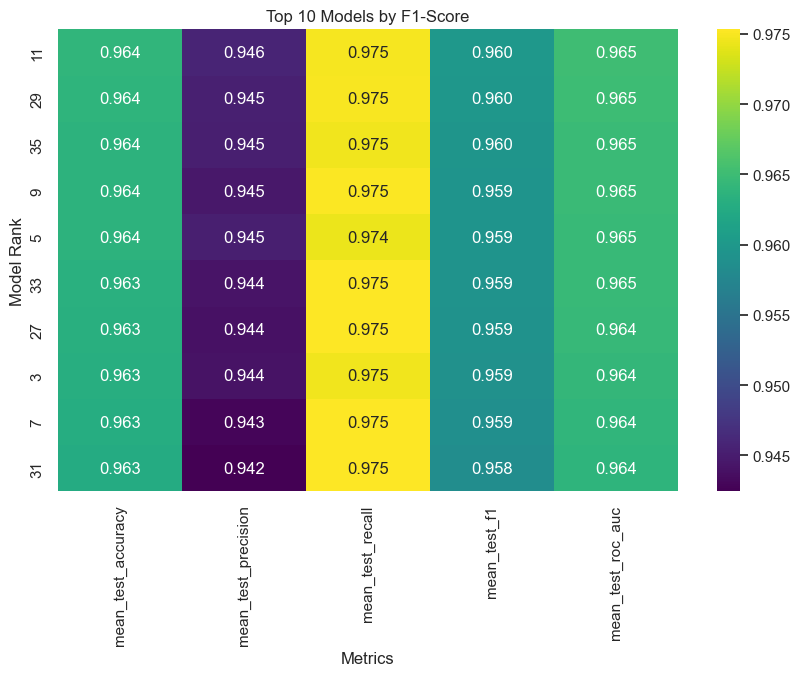

In [ ]:
results_ = pd.DataFrame(grid_search_flgb.cv_results_)
results_ = results_.sort_values(by='mean_test_f1', ascending=False)

top_10_models = results_.head(10)

heatmap_data = top_10_models[['mean_test_accuracy', 'mean_test_precision', 
                             'mean_test_recall', 'mean_test_f1', 'mean_test_roc_auc']]

plt.figure(figsize=(10, 6))
sb.heatmap(heatmap_data, annot=True, cmap='viridis', fmt=".3f")
plt.title('Top 10 Models by F1-Score')
plt.xlabel('Metrics')
plt.ylabel('Model Rank')
plt.show()

In [293]:
grid_search_flgb.best_score_
grid_search.best_index_,grid_search.best_params_

(56,
 {'bootstrap': True,
  'class_weight': 'balanced',
  'criterion': 'entropy',
  'max_depth': None,
  'max_features': 'sqrt',
  'min_samples_leaf': 2,
  'min_samples_split': 2,
  'n_estimators': 250})

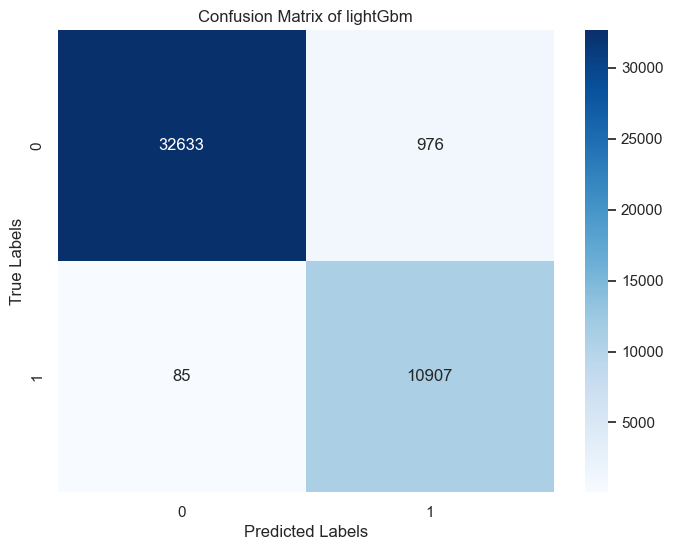

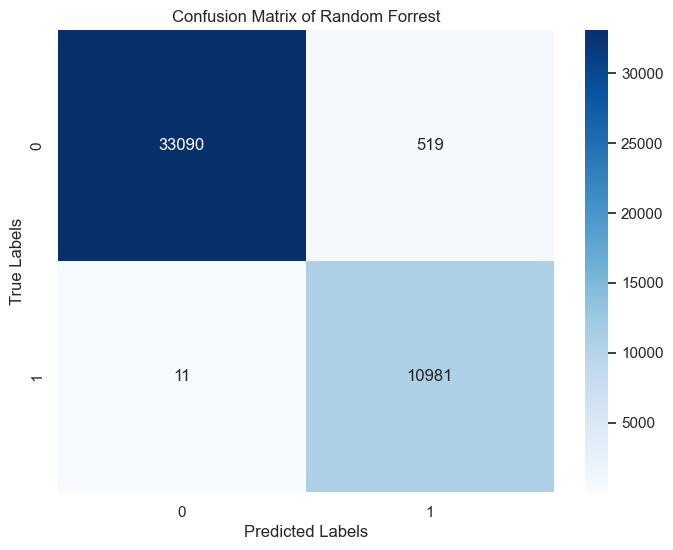

In [ ]:

lightGbm = grid_search_flgb.best_estimator_
y_pred = lightGbm.predict(all_types_data["SMOTE Data"]["No Scaling"]["X_test"])  
y_true = all_types_data["SMOTE Data"]["No Scaling"]["y_test"]

cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(8, 6))
sb.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix of lightGbm')
plt.show()
randomForest = grid_search.best_estimator_
y_pred = randomForest.predict(all_types_data["SMOTE Data"]["Standard Scaler"]["X_test"])
y_true =all_types_data["SMOTE Data"]["Standard Scaler"]["y_test"]

cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(8, 6))
sb.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix of Random Forrest')
plt.show()

In [300]:
y_pred_lgbm = lightGbm.predict(all_types_data["SMOTE Data"]["No Scaling"]["X_test"])  
y_pred_rf = randomForest.predict(all_types_data["SMOTE Data"]["Standard Scaler"]["X_test"])
y_true = all_types_data["SMOTE Data"]["No Scaling"]["y_test"]


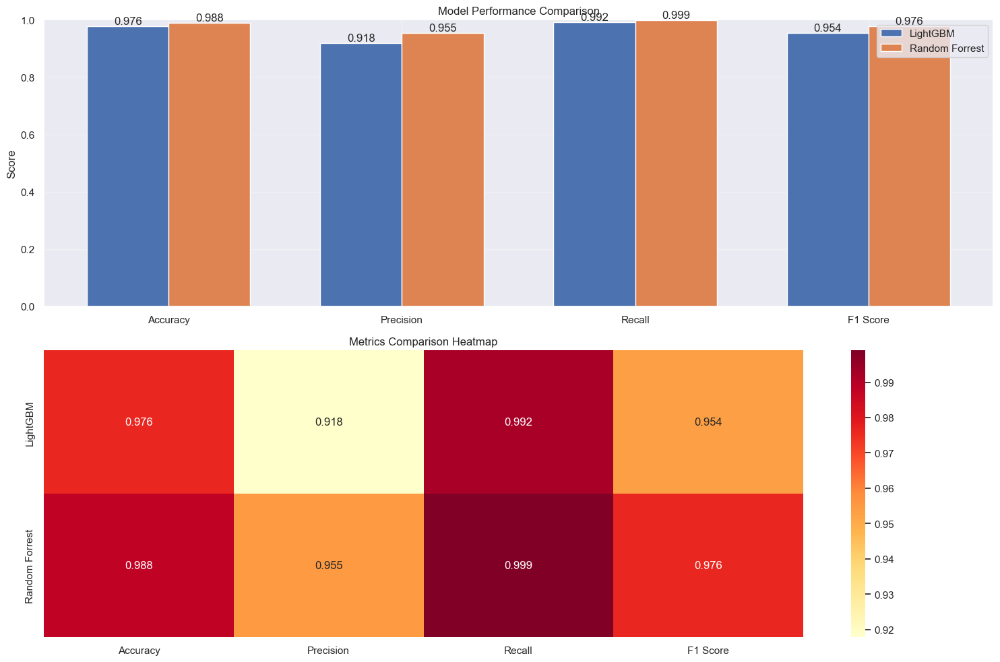

In [303]:
fig = plot_model_comparison(y_true, y_pred_lgbm, y_pred_rf, 
                          model1_name="LightGBM", model2_name="Random Forrest")
plt.show()


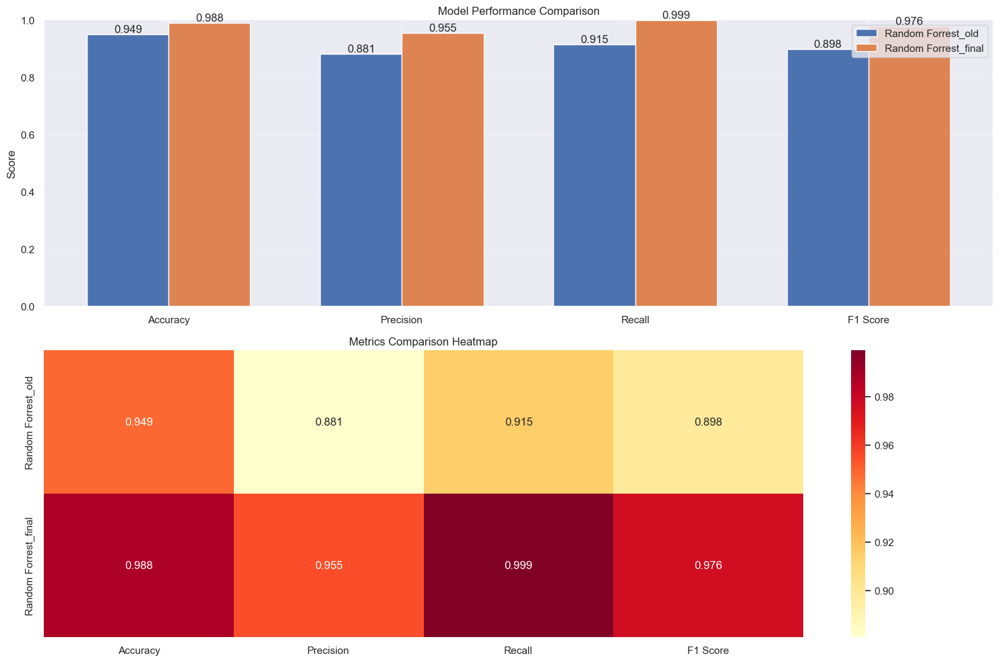

In [306]:
y_pred_rf = randomForest.predict(all_types_data["SMOTE Data"]["Standard Scaler"]["X_test"])
y_pred_o_rf = RF["No Imbalance Strategy_Standard Scaler"].predict(all_types_data["SMOTE Data"]["Standard Scaler"]["X_test"])
y_true = all_types_data["SMOTE Data"]["Standard Scaler"]["y_test"]
fig = plot_model_comparison(y_true, y_pred_o_rf, y_pred_rf, 
                          model1_name="Random Forrest_old", model2_name="Random Forrest_final")


## 5.6 Pickle the Model
Save the final model for future deployment:

In [307]:
import pickle
with open('random_forrest_final.pkl', 'wb') as f:
    pickle.dump(randomForest, f)

with open('standart_scaler_final.plk','wb') as f:
    pickle.dump(standard,f)

## <p style="background-color:#fea162; font-family:newtimeroman; color:#FFF9ED; font-size:175%; text-align:center; border-radius:10px 10px;">6. Conclusion</p>

<a id="6"></a>
<a href="#toc" class="btn btn-primary btn-sm" role="button" aria-pressed="true" 
style="color:blue; background-color:#dfa8e4" data-toggle="popover">Content</a>

### Project Conclusion

In this project, we meticulously processed an unbalanced loan default dataset by implementing a comprehensive **data cleaning process**. This included the removal of unnecessary features and effective handling of missing values. Following a detailed **correlation analysis**, several features were merged to optimize the dataset's structure.

To address the data imbalance, we employed techniques such as **SMOTE ADASYN undersampling**. We also created variants of the dataset using **standard scaling, min-max scaling, and no scaling** to explore the impacts of different preprocessing methods.

A suite of nine machine learning models was applied:
- KNN
- Logistic Regression
- Neural Network
- Decision Tree
- **Random Forest**
- XGBoost
- **LightGBM**
- CatBoost

Through rigorous performance evaluations, **LightGBM** and **Random Forest** emerged as the top performers. We further fine-tuned these models through a grid search with carefully selected parameters, ultimately selecting **Random Forest** as the most suitable final model due to its superior performance. This model was saved, encapsulating a robust approach to predicting loan defaults. This approach leverages advanced ensemble techniques and adaptive preprocessing methods to ensure accuracy and reliability in predictions.

......